<center><img src=https://datascience.harvard.edu/files/datascience/files/hdsi_logo_horizontal_01.png?m=1503492824></center>

## Prephase: Loading Libraries and Start Working With Data. 
- Global Libraries : `pandas`  <a href = "https://pandas.pydata.org" target="_blank"> (Data analysis Library) </a>|| `numpy` <a href = "https://numpy.org" target="_blank"> (Scientific Computing Libraby) </a> || `datetime`<a href = "https://docs.python.org/3/library/datetime.html" target="_blank"> (Documentation) </a>

- Private Libraries: `sql_connect` <a href = "https://docs.microsoft.com/en-us/sql/connect/python/python-driver-for-sql-server?view=sql-server-ver15" target="_blank"> (connects with sql server using ODBC Driver) </a>

- Local Libraries: `excel` <a href = "https://xlsxwriter.readthedocs.io" target="_blank"> (exports data to excel) </a>  || `slack` <a href = "https://api.slack.com/tutorials/tags/cool-tricks" target="_blank"> (a slack specific tool to send files and messages using a BOT) </a> || `sql` <a href = "https://docs.microsoft.com/en-US/sql/t-sql/queries/select-transact-sql?view=sql-server-ver15" target="_blank"> (contains direct queries to sql database using SELECT) </a> || `plot` <a href = "https://matplotlib.org" target="_blank"> (returns data as graph) </a> 



In [1]:
from datetime import datetime
from Private import sql_connect
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from DISCORD.ELOUNDA import slack, excel, sql, plot, notebook_run

## ΒΗΜΑ 1ο
- Διασύνδεση και απόκτηση δεδομένων σε πραγματικό χρόνο από τα κεντρικά γραφεία της εταιρίας.
- To πρώτο ερώτημα στην Βάση Δεδομένων (DB) επιλέξαμε να περιέχει τον <font color='green'>«κύκλο εργασιών»</font> του κεντρικού καταστήματος με τον διακριτικό τίτλο: **Elounda Market**
<details>
<summary> Step Details <font color='green'>(click me)</font></summary>
    
     * Αποθηκεύουμε τα αποτελέσματα στην μεταβλητή `ems` αρχικά της λέξης: <font color='green'>Elounda Market Sales</font> 
     * Θέλουμε η μεταβλητή να είναι τύπου `pandas.core.frame.DataFrame` " δλδ πλαίσιο δεδομένων" εφεξής `DataFrame`, με την χρήση `type(ems)` μπορούμε να επιβεβαιώσουμε αν αυτό που πραγματικά θέλουμε να δημιουργήσουμε το έχουμε πετύχει.
     * Για την επίτευξη της διασύνδεσης χρησιμοποιούμε την εντολή `sql_connect.connect()` η βιβλιοθήκη `sql_connect` είναι σε ιδιωτικό φάκελο και η υπηρεσία, την οποία εφεξής θα καλούμε "function" --> `.connect()` περιέχει ευαίσθητες πληροφορίες διασύνδεσης με τον SQL SERVER & τα credentials, τέλος για την διαδύνδεση χρησιμοποιούμε τον **ODBC** driver από την επίσημη ιστοσελίδα της Microsoft τον οποίο εγκαθιστούμε τοπικά στον υπολογιστή που θα τρέχει την εφαρμογή.
     * Για την απόκτηση δεδομένων χρησιμοποιούμε την εντολή `sql.elounda_market_sales()`, εδώ η βιβλιοθήκη την οποία εφεξης θα καλούμε `library` --> `sql` είναι σε κοινό (προσβάσιμο) φάκελο και η "function" `.elounda_market_sales()` περίεχει το ερώτημα στην βάση δεδομένων.
     * Για να δημιοργήσουμε το `DataFrame` χρησιμοποιούμε την βιβλιοθηκη pandas και για να διαβάσουμε ένα ερώτημα στην βάση δεδομένων χρησιμοποιούμε την `function` --> `read_sql_query()` η οποία δέχεται ως ορίσματα το ερώτημα στην βάση δεδομένων και τα στοιχεία σύνδεσης σε αυτήν.
     * Συνδυάζοντας όλα τα παραπάνω δημιουργήσαμε τον παρακάτω κώδικα σε μια γραμμή.


In [2]:
display(datetime.now().strftime('ΟΙ ΠΛΗΡΟΦΟΡΙΕΣ ΕΝΗΜΕΡΩΘΗΚΑΝ ΣΤΙΣ :%d-%m-%Y & ΩΡΑ:%H:%M:%S'))

'ΟΙ ΠΛΗΡΟΦΟΡΙΕΣ ΕΝΗΜΕΡΩΘΗΚΑΝ ΣΤΙΣ :11-10-2020 & ΩΡΑ:00:32:27'

In [3]:
ems= pd.read_sql_query(sql.elounda_market_sales(), sql_connect.connect())
type(ems)

pandas.core.frame.DataFrame

## ΒΗΜΑ 2ο

- Δημιουργούμε έναν συγκεντρωτικό πίνακα δεδομένων, 
- διορθώνουμε τις τιμές όπου χρειάζεται, 
- δημιουργούμε στήλη συνόλων για κάθε έτος και
- <font color='green'>εμφανίζουμε τα αποτελέσματα</font> στην οθόνη μας.
<details>
<summary>Step Details <font color='green'>(click me)</font></summary>
    
     * Χρησιμοπούμε την εντολή `df.pivot(index='', columns='', values='')` για να δημιουργήσουμε έναν συγκεντρωτικό πίνακα.
     * Με την χρήση της εντολής `df.fillna(0)` όλες οι "κενές" τιμές που έιναι τύπου **NaN** ή **NULL** παίρνουν την τιμή `0`
     * Η εντολή `df['...'] = df.sum(axis=1)` σημιουργεί τα σύνολα -> `[sum()]` ανά γραμμή -> `[axis=1]`
     * Με την εντολή `df` στην περίπτωσή μας `ems` εμφανίζονται - εκτυπώνονται  τα δεδομένα που η μεταβλητή περιέχει

In [4]:
ems = ems.fillna(0)
ems_pivot = ems.pivot(index='YEAR', columns='MONTH', values='TurnOver')

In [5]:
ems_pivot['ΣΥΝΟΛΑ'] = ems_pivot.sum(axis=1)
ems_pivot

MONTH,01-Jan,02-Feb,03-Mar,04-Apr,05-May,06-Jun,07-Jul,08-Aug,09-Sep,10-Oct,11-Nov,12-Dec,ΣΥΝΟΛΑ
YEAR,,,,,,,,,,,,,
2012,0.00,NaN,0.00,5.25,83.73,80226.84,189424.72,231554.15,189986.63,110862.03,47970.85,49372.94,899487.14
2013,46306.27,44343.63,54399.92,75100.55,154115.88,211295.17,255319.98,289623.82,231398.63,140433.66,61148.23,60499.10,1623984.84
2014,51522.63,54313.88,67325.06,110034.07,151159.46,207432.28,254664.93,286392.88,227248.46,144990.21,56852.08,78328.47,1690264.41
2015,53746.45,57248.77,67977.13,134745.61,161234.41,185237.19,227833.41,247306.88,208045.17,130178.53,61745.95,65799.76,1601099.26
2016,44551.72,48016.84,62205.55,97730.05,149258.60,186184.65,247597.46,274556.80,219732.90,151166.92,60015.60,57060.53,1598077.62
2017,47048.01,52468.99,60518.51,98177.35,163080.21,204713.30,259550.20,278523.01,229836.97,151005.59,59198.25,58098.97,1662219.36
2018,47220.44,50907.68,61452.93,99202.56,161281.24,210140.39,255839.83,274975.33,236082.76,152658.23,62021.48,60664.71,1672447.58
2019,51930.28,55184.22,67945.30,103037.67,158202.85,206636.41,255607.16,279038.61,238649.99,159480.56,71017.67,66649.42,1713380.14
2020,57024.35,64383.46,88555.89,97002.02,92204.43,84983.64,151002.89,205394.39,138477.70,47724.46,NaN,NaN,1026753.23


## ΒΗΜΑ 3ο
- Η παρακάτω γραφική παράσταση απεικονίζει την κεντρική τάση `Μηνιαίου Τζίρου` μαζί με το έυρος σφάλματος για κάθε `ΕΤΟΣ`
 <details>
<summary>Step Details <font color='green'>(click me)</font></summary>
    
     * Μια γραφική παράσταση ράβδου αντιπροσωπεύει μια εκτίμηση της κεντρικής τάσης για μια αριθμητική μεταβλητή `EΤΟΣ`  με το ύψος κάθε ορθογωνίου να παρέχει ένδειξη της αβεβαιότητας γύρω από αυτήν την εκτίμηση χρησιμοποιώντας γραμμές σφάλματος. 

     * Είναι επίσης σημαντικό να έχετε κατά νου ότι μια γραφική παράσταση γραμμής δείχνει μόνο την μέση τιμή (ή άλλος εκτιμητής), αλλά σε πολλές περιπτώσεις μπορεί να είναι πιο κατατοπιστική η εμφάνιση της κατανομής των τιμών σε κάθε επίπεδο των κατηγοριών μεταβλητών. Σε αυτήν την περίπτωση, άλλες προσεγγίσεις όπως ένα κουτί `boxplot` ή ένα βιολί `violinplot` μπορεί να είναι πιο κατάλληλες. 

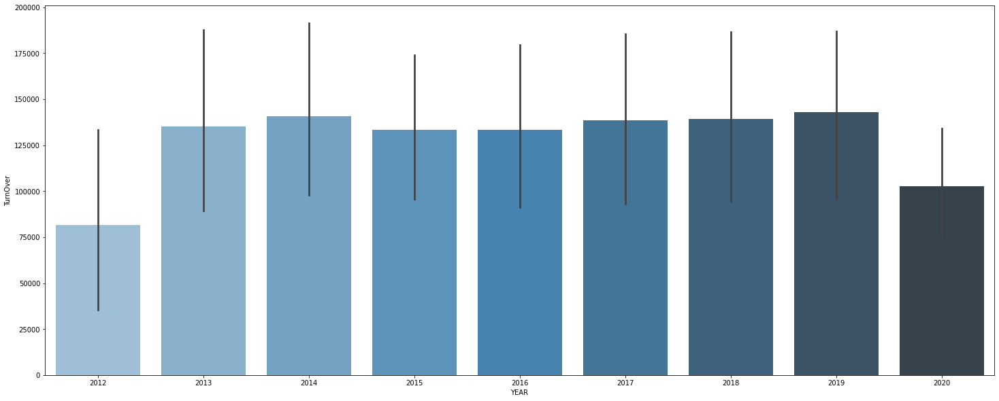

In [6]:
fig = plt.subplots(figsize=(25,10))
sns.barplot(data=ems, x='YEAR', y='TurnOver', palette="Blues_d")
plt.show()

## ΒΗΜΑ 4ο
- Η παρακάτω γραφική παραάσταση απεικονίζει την κατανομή `Μηνιαίου Τζίρου` για κάθε `ΕΤΟΣ`
 <details>
<summary>Step Details <font color='green'>(click me)</font></summary>
    
    * Μια γραφική παράσταση κουτιού `boxplot` (ή whisker plot) δείχνει την κατανομή των ποσοτικών δεδομένων με τρόπο που διευκολύνει τις συγκρίσεις μεταξύ μεταβλητών. 
    * Το πλαίσιο εμφανίζει τα τεταρτημόρια του συνόλου δεδομένων, ενώ τα μουστάκια επεκτείνονται για να δείξουν το υπόλοιπο της διανομής, εκτός από σημεία που προσδιορίζονται ως "ακραίες τιμές".


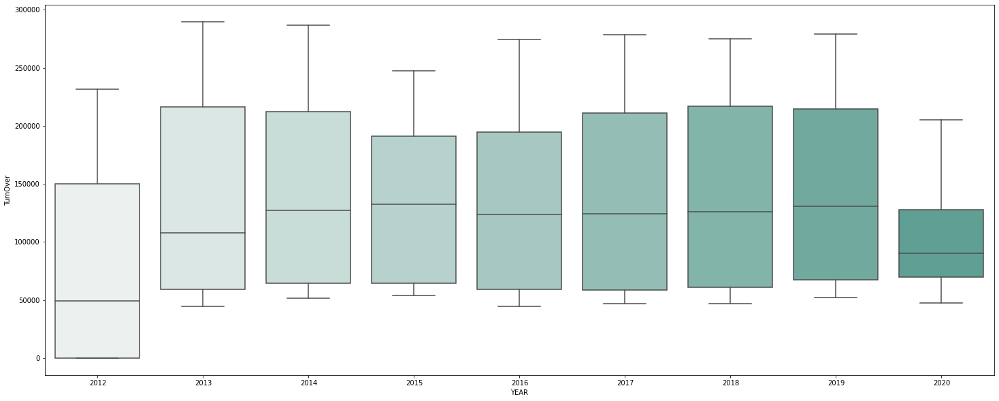

In [7]:
fig = plt.subplots(figsize=(25,10))
sns.boxplot(data=ems, x='YEAR', y='TurnOver', palette="light:#5A9")
plt.show()

## BHMA 5o
- Παρακάτω απεικονίζουμε περιγραφικές στατιστικές
 <details>
<summary>Step Details <font color='green'>(click me)</font></summary>
    
    * Οι περιγραφικές στατιστικές περιλαμβάνουν εκείνες που συνοψίζουν την κεντρική τάση, διασπορά και σχήμα της διανομής ενός συνόλου δεδομένων, εξαιρουμένων των τιμών NaN.

    * Αναλύει τόσο αριθμητικές όσο και σειρές αντικειμένων, καθώς και σύνολα στηλών DataFrame μεικτών τύπων δεδομένων. Η έξοδος θα ποικίλει ανάλογα με το τι παρέχεται.

In [8]:
ems_pivot.describe()

MONTH,01-Jan,02-Feb,03-Mar,04-Apr,05-May,06-Jun,07-Jul,08-Aug,09-Sep,10-Oct,11-Nov,12-Dec,ΣΥΝΟΛΑ
count,9.000000,8.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,8.000000,8.000000,9.000000e+00
mean,44372.238889,53358.433750,58931.143333,90559.458889,132291.201111,175205.541111,232982.286667,263040.652222,213273.245556,132055.576667,59996.263750,62059.237500,1.498635e+06
std,17117.768920,6065.463208,24042.100747,37336.450394,54202.736756,53387.960897,38025.177644,28689.568136,31953.376707,34826.120705,6381.837979,8499.923409,3.077253e+05
min,0.000000,44343.630000,0.000000,5.250000,83.730000,80226.840000,151002.890000,205394.390000,138477.700000,47724.460000,47970.850000,49372.940000,8.994871e+05
25%,46306.270000,50184.970000,60518.510000,97002.020000,149258.600000,185237.190000,227833.410000,247306.880000,208045.170000,130178.530000,58611.707500,57839.360000,1.598078e+06
50%,47220.440000,53391.435000,62205.550000,98177.350000,154115.880000,204713.300000,254664.930000,274975.330000,227248.460000,144990.210000,60581.915000,60581.905000,1.623985e+06
75%,51930.280000,55700.357500,67945.300000,103037.670000,161234.410000,207432.280000,255607.160000,279038.610000,231398.630000,151166.920000,61814.832500,66012.175000,1.672448e+06
max,57024.350000,64383.460000,88555.890000,134745.610000,163080.210000,211295.170000,259550.200000,289623.820000,238649.990000,159480.560000,71017.670000,78328.470000,1.713380e+06


## ΒΗΜΑ 6ο
- Η παρακάτω γραφική παράσταση απεικονίζει την κεντρική τάση `Μηνιαίου Τζίρου` μαζί με το έυρος σφάλματος
 <details>
<summary>Step Details <font color='green'>(click me)</font></summary>
    
     * Μια γραφική παράσταση ράβδου αντιπροσωπεύει μια εκτίμηση της κεντρικής τάσης για μια αριθμητική μεταβλητή με το ύψος κάθε ορθογωνίου να παρέχει ένδειξη της αβεβαιότητας γύρω από αυτήν την εκτίμηση χρησιμοποιώντας γραμμές σφάλματος. 

     * Είναι επίσης σημαντικό να έχετε κατά νου ότι μια γραφική παράσταση γραμμής δείχνει μόνο την μέση τιμή (ή άλλος εκτιμητής), αλλά σε πολλές περιπτώσεις μπορεί να είναι πιο κατατοπιστική η εμφάνιση της κατανομής των τιμών σε κάθε επίπεδο των κατηγοριών μεταβλητών. Σε αυτήν την περίπτωση, άλλες προσεγγίσεις όπως ένα κουτί `boxplot` ή ένα βιολί `violinplot` μπορεί να είναι πιο κατάλληλες. 

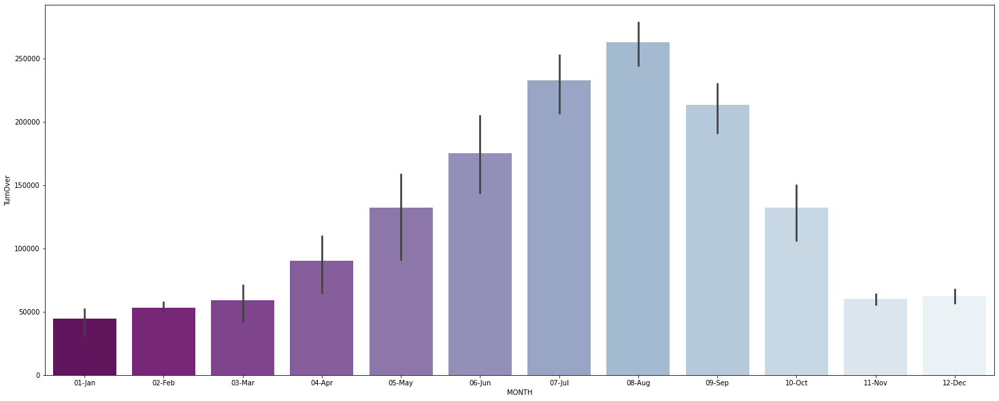

In [9]:
fig = plt.subplots(figsize=(25,10))
sns.barplot(data=ems.sort_values(by='MONTH'), x='MONTH', y='TurnOver' , palette="BuPu_r")
plt.show()

## ΒΗΜΑ 7ο
- Η παρακάτω γραφική παράσταση απεικονίζει την κατανομή `Μηνιαίου Τζίρου` στο σύνολο του δείγματος
 <details>
<summary>Step Details <font color='green'>(click me)</font></summary>
    
     * Ένα ιστόγραμμα είναι ένα κλασικό εργαλείο οπτικοποίησης που αντιπροσωπεύει την κατανομή μιας ή περισσότερων μεταβλητών μετρώντας τον αριθμό των παρατηρήσεων που εμπίπτουν σε ξεχωριστούς κάδους.

     * Αυτή η συνάρτηση μπορεί να ομαλοποιήσει το στατιστικό στοιχείο που υπολογίζεται μέσα σε κάθε κάδο για να εκτιμήσει τη συχνότητα, την πυκνότητα ή τη μάζα πιθανότητας και μπορεί να προσθέσει μια ομαλή καμπύλη που λαμβάνεται χρησιμοποιώντας μια εκτίμηση πυκνότητας πυρήνα, παρόμοια με το kdeplot ().

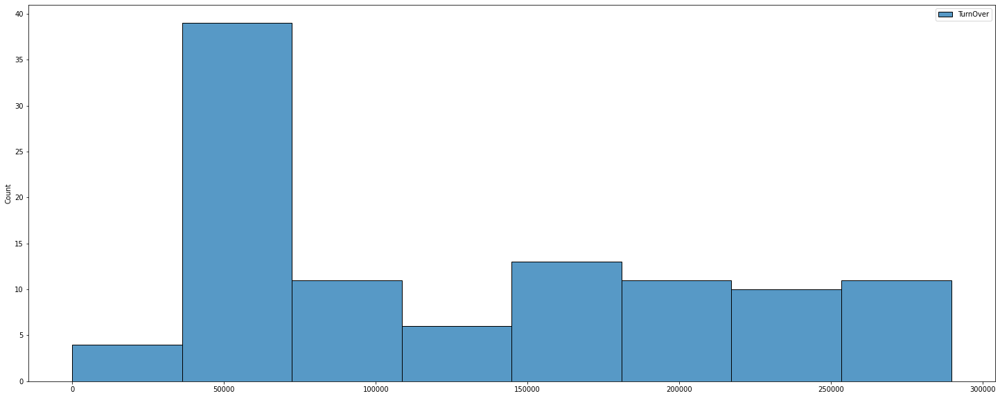

In [10]:
ax = plt.subplots(figsize=(25,10))
sns.histplot(ems)
plt.show()

## ΒΗΜΑ 8ο
- Η παρακάτω γραφική παράσταση απεικονίζει τον `Συνολικό Τζίρο / ΕΤΟΣ `


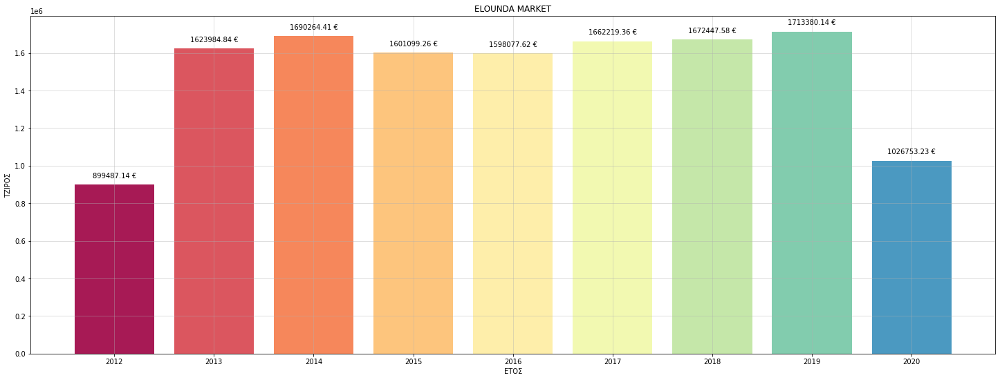

In [11]:
X = ems.YEAR.unique()
y = ems_pivot['ΣΥΝΟΛΑ']
plt.figure(figsize=(25, 9))
plt.subplot(xlabel='ΕΤΟΣ', ylabel='ΤΖΙΡΟΣ', title='ELOUNDA MARKET')
colors = [plt.cm.Spectral(i / float(len(X))) for i in range(len(X))]
plt.bar(X, y, alpha=0.9, color=colors)
for a, b in zip(X, y):
    label = "{:.2f} €".format(b)

    # this method is called for each point
    plt.annotate(label,  # this is the text
                 (a, b),  # this is the point to label
                 textcoords="offset points",  # how to position the text
                 xytext=(0, 10),  # distance from text to points (x,y)
                 ha='center')  # horizontal alignment can be left, right or center
plt.grid(True, alpha=0.5)
plt.show()

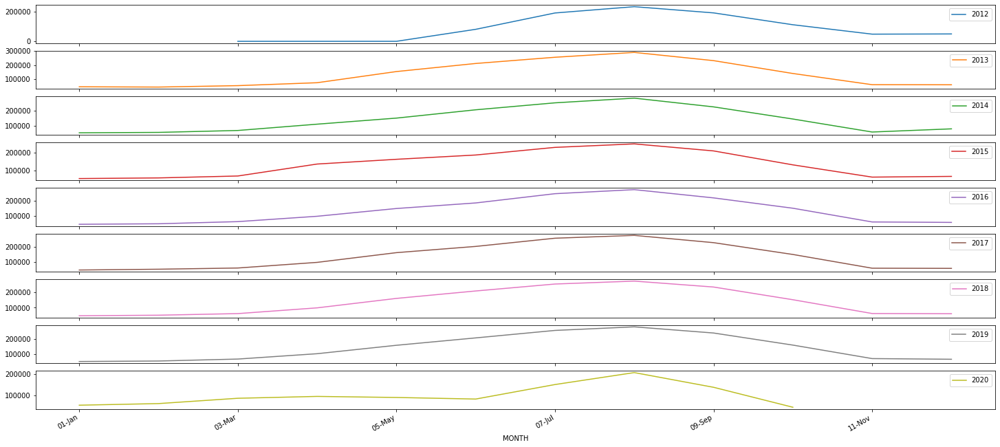

In [12]:
ems_year = ems.pivot(index='MONTH', columns='YEAR', values='TurnOver')
ems_year.plot(figsize=(25,12), kind='line', subplots=True)
plt.show()

<center><img src=https://mentocta.com/wp-content/uploads/2016/08/datascience.png></center>

# <center> ΤΖΙΡΟΣ ΕΠΙΛΕΓΜΕΝΩΝ ΚΑΤΑΣΚΕΥΑΣΤΩΝ </center>

## ΒΗΜΑ 9ο
- Διασύνδεση και απόκτηση δεδομένων σε πραγματικό χρόνο από τα κεντρικά γραφεία της εταιρίας.
- To δεύτερο ερώτημα στην Βάση Δεδομένων (DB) επιλέξαμε να περιέχει τον <font color='green'>«Τζίρο»</font> του κεντρικού καταστήματος με ανάλυση <font color='green'>«Υποκατηγορίας»</font> σε επίπεδο <font color='green'>«Κατασκευαστή»</font>
- Με την εντολή df.head() μπορούμε να δούμε τις πρώτες 05 εγγραφές 
- Με την εντολή df.fillna(0) συμπληρώνουμε με 0 όπου υπάρχει κενή τιμή.
- Δημιουργούμε ένα `pivot table` με `index` την υποκατηγορία

In [13]:
emspb= pd.read_sql_query(sql.sales_per_brand(), sql_connect.connect())

In [14]:
names = notebook_run.names()
brands = notebook_run.brands()

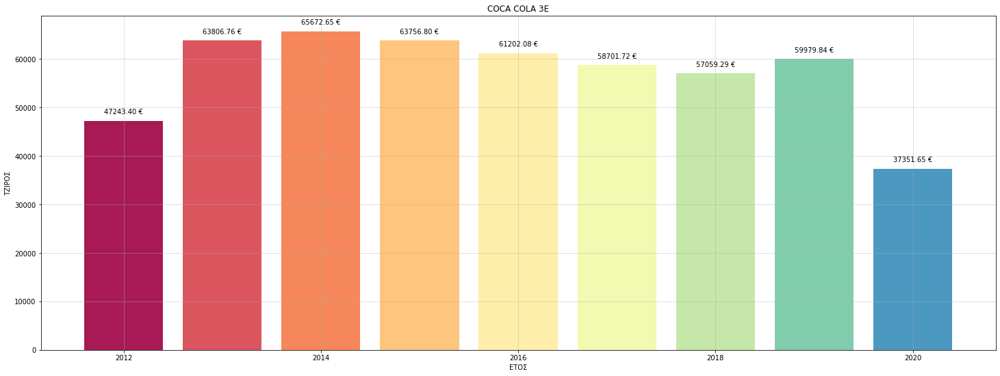

YEAR,2012,2013,2014,2015,2016,2017,2018,2019,2020,ΣΥΝΟΛΑ
SubCategory,,,,,,,,,,
Amita,9870.57,16032.46,16492.61,14691.27,14418.72,14020.00,13968.66,13423.69,8315.30,121233.28
Avra,672.21,465.90,110.48,377.57,38.08,13.43,0.00,1605.68,0.00,3283.35
Coca-Cola,15407.02,25182.28,27378.09,25842.41,24643.94,23733.81,24925.72,25580.01,18188.19,210881.47
Fanta,5366.42,8884.67,9822.12,8504.84,9268.03,8773.52,10191.83,10182.89,6106.61,77100.93
Frulite,550.08,1715.50,1453.30,1523.31,1737.83,1082.02,14.40,0.00,0.00,8076.44
Monster,731.61,440.49,802.39,1385.71,609.68,1281.75,1715.93,2023.18,1184.99,10175.73
Nestea,1480.86,2998.40,2394.94,3944.38,3940.88,2874.60,185.94,0.00,0.00,17820.00
Powerade,283.47,491.45,522.28,497.97,739.54,388.64,466.70,601.35,302.71,4294.11
Schweppes,1587.37,2861.99,2198.39,3627.83,2279.55,3269.90,1704.45,2822.69,1482.90,21835.07


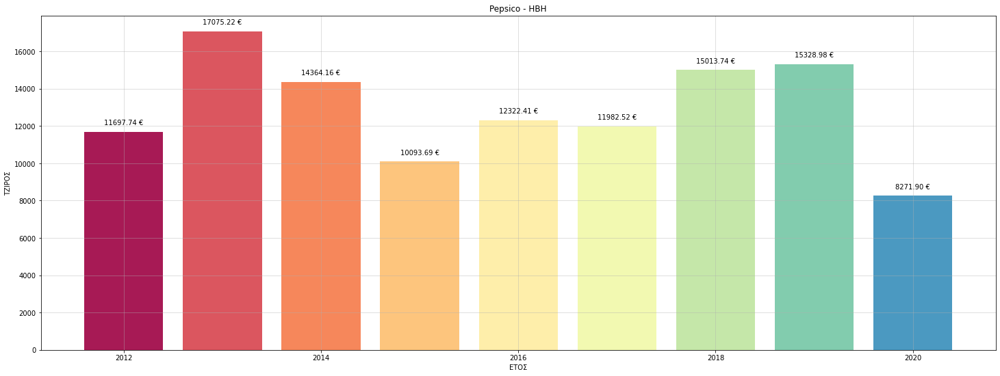

YEAR,2012,2013,2014,2015,2016,2017,2018,2019,2020,ΣΥΝΟΛΑ
SubCategory,,,,,,,,,,
7up,1096.06,1787.42,2027.15,1614.88,1683.63,917.75,728.93,591.61,383.96,10831.39
Lipton,4146.14,5915.81,5097.14,3557.88,4088.84,3919.39,5571.42,6870.15,3999.62,43166.39
Pepsi,2250.14,4064.20,3036.92,1923.98,2262.35,1197.39,1953.07,1702.59,984.22,19374.86
RockStar,0.00,121.44,257.70,9.66,0.00,134.82,30.07,0.00,0.00,553.69
Ήβη,4205.40,5186.35,3945.25,2987.29,4287.59,5813.17,6730.25,6164.63,2904.10,42224.03
TOTAL,11697.74,17075.22,14364.16,10093.69,12322.41,11982.52,15013.74,15328.98,8271.90,116150.36


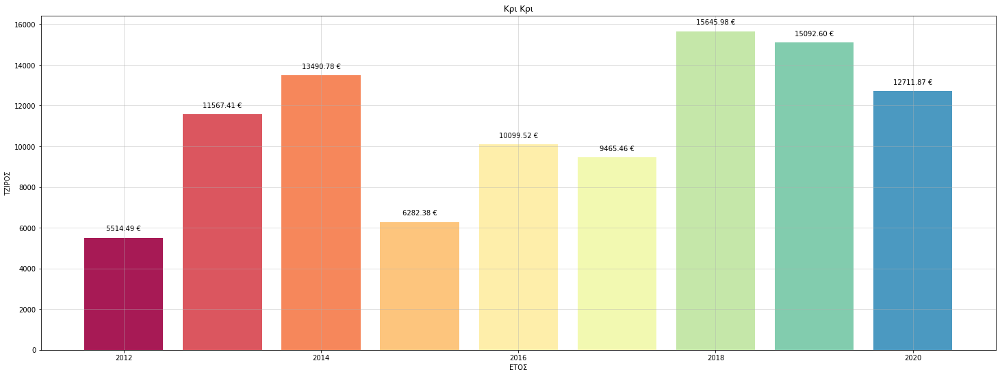

YEAR,2012,2013,2014,2015,2016,2017,2018,2019,2020,ΣΥΝΟΛΑ
SubCategory,,,,,,,,,,
Κρι Κρι,5514.49,11567.41,13490.78,6282.38,10099.52,9465.46,15645.98,15092.6,12711.87,99870.49
TOTAL,5514.49,11567.41,13490.78,6282.38,10099.52,9465.46,15645.98,15092.6,12711.87,99870.49


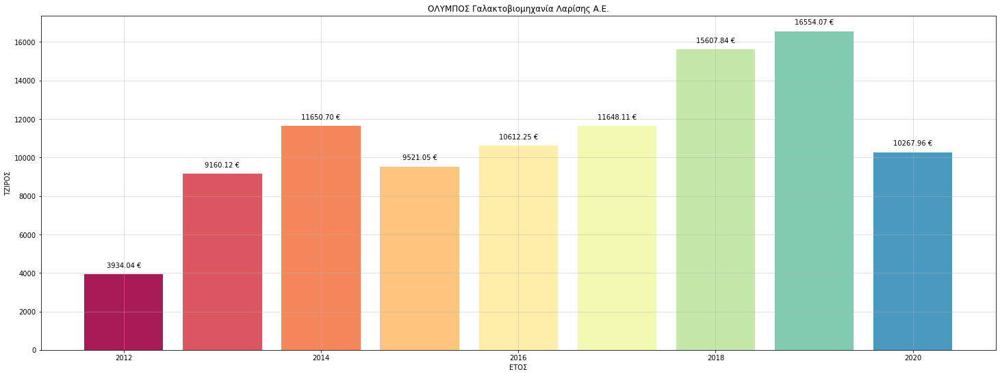

YEAR,2012,2013,2014,2015,2016,2017,2018,2019,2020,ΣΥΝΟΛΑ
SubCategory,,,,,,,,,,
Tyras,0.00,318.88,0.0,0.00,0.00,0.00,0.00,0.00,0.00,318.88
Όλυμπος,3934.04,8841.24,11650.7,9521.05,10612.25,11648.11,15607.84,16554.07,10267.96,98637.26
TOTAL,3934.04,9160.12,11650.7,9521.05,10612.25,11648.11,15607.84,16554.07,10267.96,98956.14


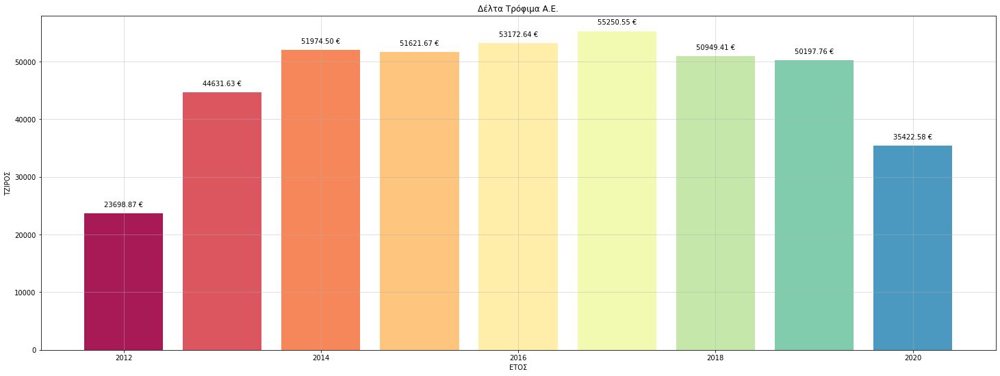

YEAR,2012,2013,2014,2015,2016,2017,2018,2019,2020,ΣΥΝΟΛΑ
SubCategory,,,,,,,,,,
Life,2954.22,5335.35,7045.65,6942.30,4931.80,5040.57,3593.89,4163.40,1931.55,41938.73
Wibe,0.00,0.00,0.00,118.94,88.75,40.77,0.00,0.00,0.00,248.46
Βλάχας,1358.35,2311.52,2459.35,1559.94,2036.58,2108.57,1568.97,1525.26,1055.20,15983.74
Δέλτα,19386.30,36984.76,42469.50,43000.49,46115.51,48060.64,45786.55,44509.10,32435.83,358748.68
TOTAL,23698.87,44631.63,51974.50,51621.67,53172.64,55250.55,50949.41,50197.76,35422.58,416919.61


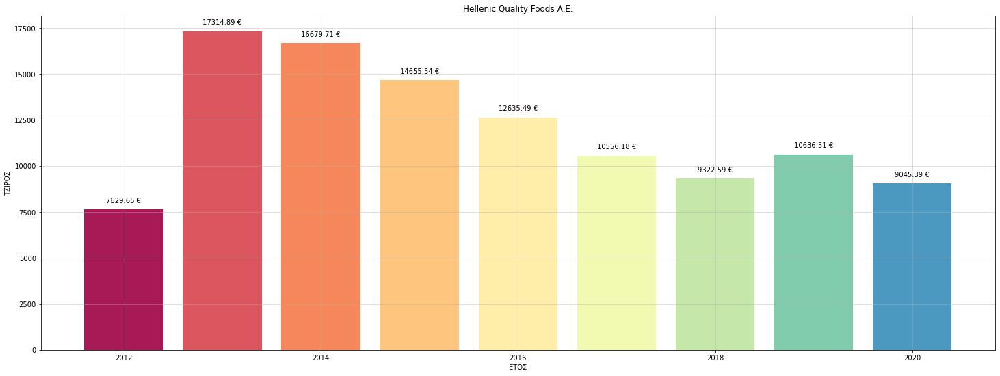

YEAR,2012,2013,2014,2015,2016,2017,2018,2019,2020,ΣΥΝΟΛΑ
SubCategory,,,,,,,,,,
Kanaki,2471.89,3739.55,3949.76,4244.69,3300.00,2476.48,2095.69,2215.34,2117.23,26610.63
Mimikos,5157.76,13575.34,12729.95,10410.85,9335.49,8079.70,7226.90,8421.17,6928.16,81865.32
TOTAL,7629.65,17314.89,16679.71,14655.54,12635.49,10556.18,9322.59,10636.51,9045.39,108475.95


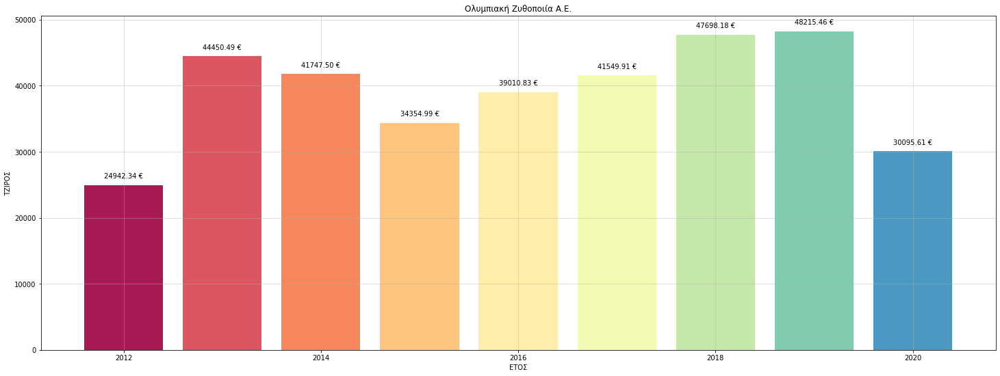

YEAR,2012,2013,2014,2015,2016,2017,2018,2019,2020,ΣΥΝΟΛΑ
SubCategory,,,,,,,,,,
Corona,1035.18,1393.58,1145.01,1298.09,2717.27,2001.21,2298.25,2688.07,762.60,15339.26
Fix,1590.36,5083.89,6879.19,5375.87,5266.60,7661.12,7700.51,9032.15,8327.20,56916.89
Guinness,585.82,785.08,596.23,610.27,694.44,866.23,633.30,726.29,189.86,5687.52
Henninger,2420.87,7419.83,5457.06,2299.68,873.84,518.63,2545.60,1864.20,2371.55,25771.26
Kaiser,266.69,561.57,182.40,253.12,781.33,274.29,448.49,255.74,245.61,3269.24
Magners,909.65,853.44,772.52,645.24,436.01,267.82,618.81,425.38,73.78,5002.65
Mythos,16345.59,26305.62,23368.83,22186.07,26061.44,27895.91,29397.02,29493.16,15539.36,216593.00
Somersby,0.00,172.04,940.74,792.62,1458.68,884.57,1277.89,1378.85,471.54,7376.93
Tuborg,1788.18,1875.44,2405.52,894.03,721.22,1180.13,2778.31,2351.62,2114.11,16108.56


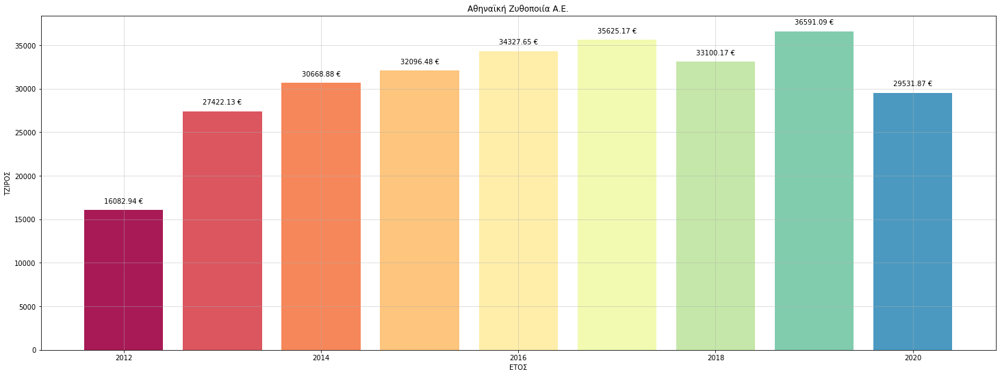

YEAR,2012,2013,2014,2015,2016,2017,2018,2019,2020,ΣΥΝΟΛΑ
SubCategory,,,,,,,,,,
Alfa,1022.43,3294.11,6343.71,8218.95,12540.28,10446.88,13176.33,17843.46,18463.10,91349.25
Amstel,10675.97,15882.67,18038.51,16792.47,14845.62,16231.17,13338.54,12822.69,8206.62,126834.26
Buckler,536.43,753.83,984.91,1413.31,991.83,765.63,295.47,348.97,413.80,6504.18
Desperados,0.00,286.85,395.91,530.21,339.55,471.54,929.26,594.72,312.94,3860.98
Fisher,0.00,0.00,0.00,0.00,0.00,283.39,142.05,148.75,26.60,600.79
Heineken,2400.33,5037.31,3548.39,3915.50,2876.91,3792.89,3265.38,3214.71,1791.76,29843.18
Sol,0.00,20.73,170.48,0.00,0.00,393.24,410.91,376.31,143.29,1514.96
Strongbow,1447.78,2146.63,1186.97,1226.04,2733.46,3240.43,1542.23,1241.48,173.76,14938.78
TOTAL,16082.94,27422.13,30668.88,32096.48,34327.65,35625.17,33100.17,36591.09,29531.87,275446.38


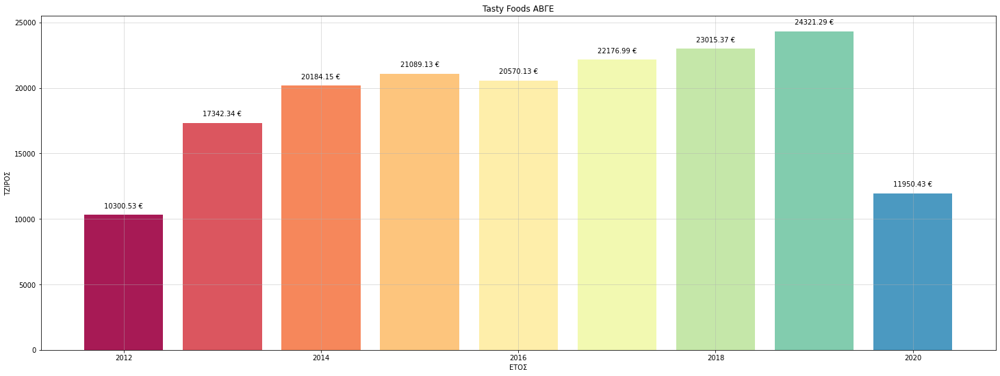

YEAR,2012,2013,2014,2015,2016,2017,2018,2019,2020,ΣΥΝΟΛΑ
SubCategory,,,,,,,,,,
Cheetos,251.74,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1513.62,1765.36
Doritos,220.11,0.00,0.00,0.00,0.00,0.00,0.00,77.12,0.00,297.23
Quaker,667.03,2387.06,2424.28,2825.26,1868.09,1599.06,1908.30,2279.56,1392.77,17351.41
Tasty,9161.65,14955.28,17759.87,18263.87,18702.04,20577.93,21107.07,21964.61,9044.04,151536.36
TOTAL,10300.53,17342.34,20184.15,21089.13,20570.13,22176.99,23015.37,24321.29,11950.43,170950.36


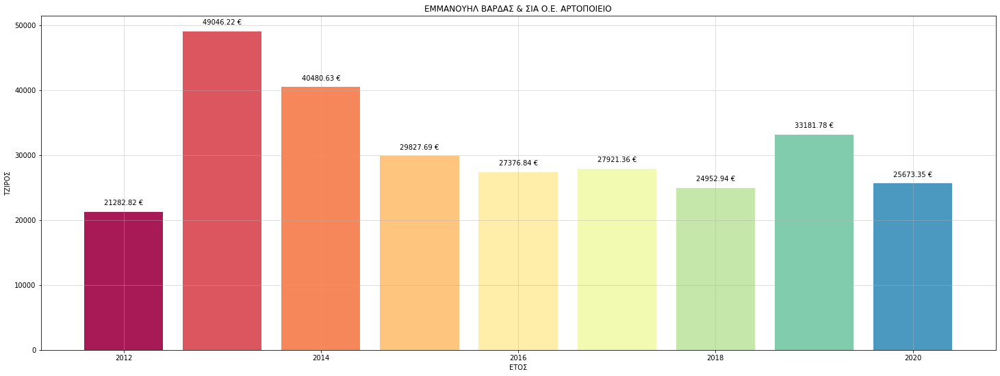

YEAR,2012,2013,2014,2015,2016,2017,2018,2019,2020,ΣΥΝΟΛΑ
SubCategory,,,,,,,,,,
Βάρδας,21282.82,49046.22,40480.63,29827.69,27376.84,27921.36,24952.94,33181.78,25673.35,279743.63
TOTAL,21282.82,49046.22,40480.63,29827.69,27376.84,27921.36,24952.94,33181.78,25673.35,279743.63


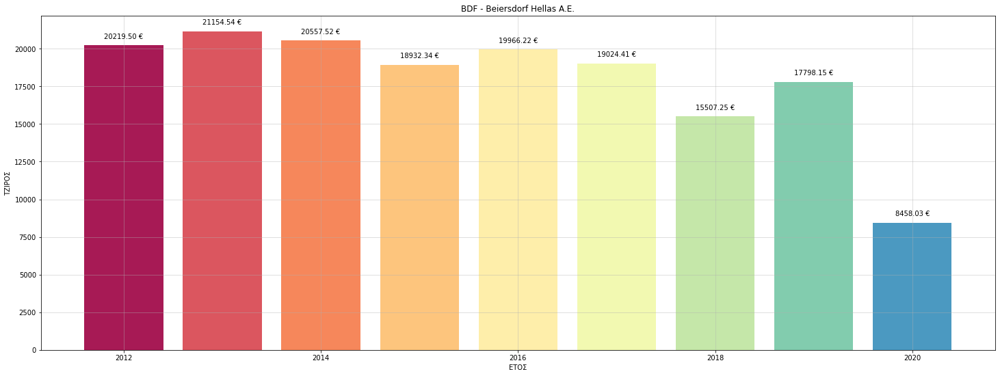

YEAR,2012,2013,2014,2015,2016,2017,2018,2019,2020,ΣΥΝΟΛΑ
SubCategory,,,,,,,,,,
Nivea,20219.5,21154.54,20557.52,18932.34,19966.22,19024.41,15507.25,17798.15,8458.03,161617.96
TOTAL,20219.5,21154.54,20557.52,18932.34,19966.22,19024.41,15507.25,17798.15,8458.03,161617.96


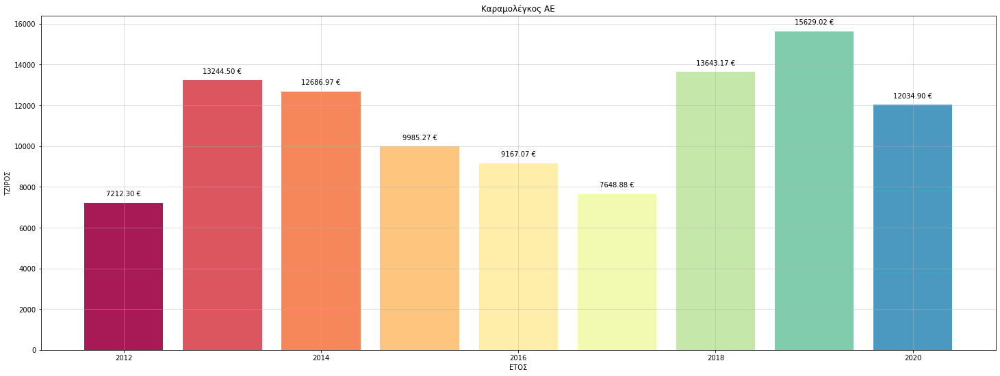

YEAR,2012,2013,2014,2015,2016,2017,2018,2019,2020,ΣΥΝΟΛΑ
SubCategory,,,,,,,,,,
Καραμολεγκος,7212.3,13244.5,12686.97,9985.27,9167.07,6769.36,10256.11,10989.80,8404.76,88716.14
Κατσελης,0.0,0.0,0.00,0.00,0.00,879.52,3387.06,4639.22,3630.14,12535.94
TOTAL,7212.3,13244.5,12686.97,9985.27,9167.07,7648.88,13643.17,15629.02,12034.90,101252.08


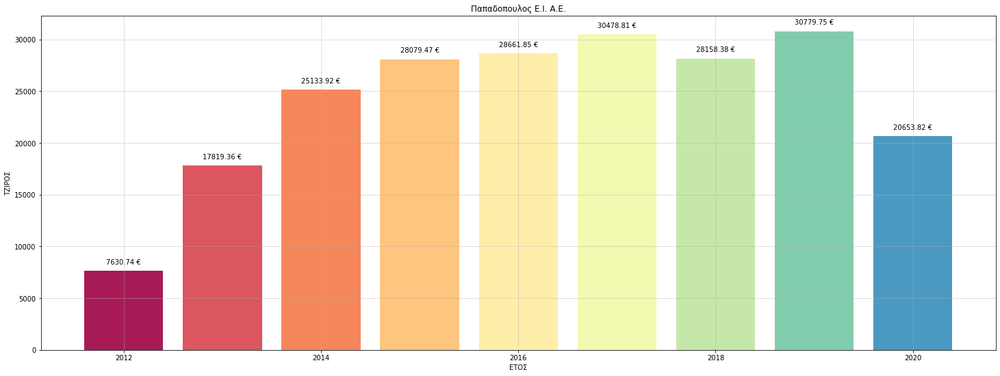

YEAR,2012,2013,2014,2015,2016,2017,2018,2019,2020,ΣΥΝΟΛΑ
SubCategory,,,,,,,,,,
Papadopoulou,7630.74,17819.36,25133.92,28079.47,28661.85,30478.81,28158.38,30779.75,20653.82,217396.1
TOTAL,7630.74,17819.36,25133.92,28079.47,28661.85,30478.81,28158.38,30779.75,20653.82,217396.1


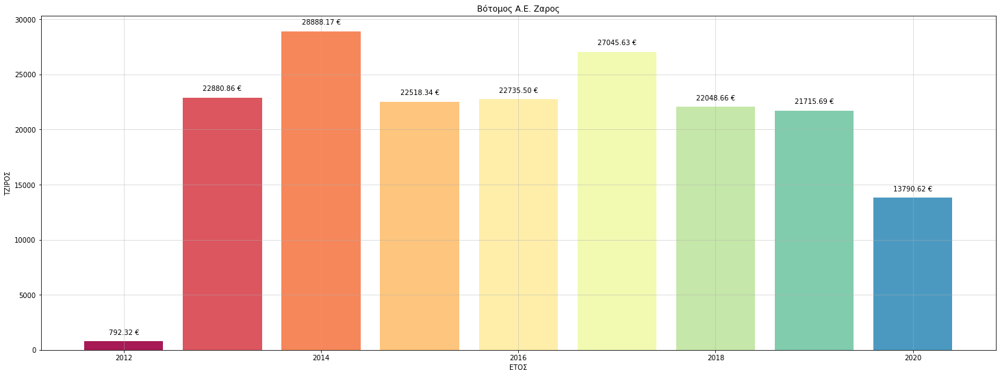

YEAR,2012,2013,2014,2015,2016,2017,2018,2019,2020,ΣΥΝΟΛΑ
SubCategory,,,,,,,,,,
Ζάρος,792.32,22880.86,28888.17,22518.34,22735.5,27045.63,22048.66,21715.69,13790.62,182415.79
TOTAL,792.32,22880.86,28888.17,22518.34,22735.5,27045.63,22048.66,21715.69,13790.62,182415.79


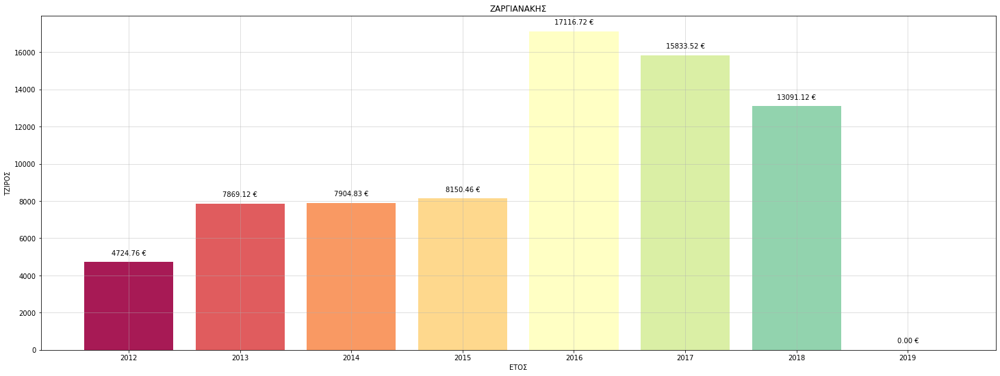

YEAR,2012,2013,2014,2015,2016,2017,2018,2019,ΣΥΝΟΛΑ
SubCategory,,,,,,,,,
Σητειακό,4724.76,7869.12,7904.83,8150.46,17116.72,15833.52,13091.12,0.0,74690.53
TOTAL,4724.76,7869.12,7904.83,8150.46,17116.72,15833.52,13091.12,0.0,74690.53


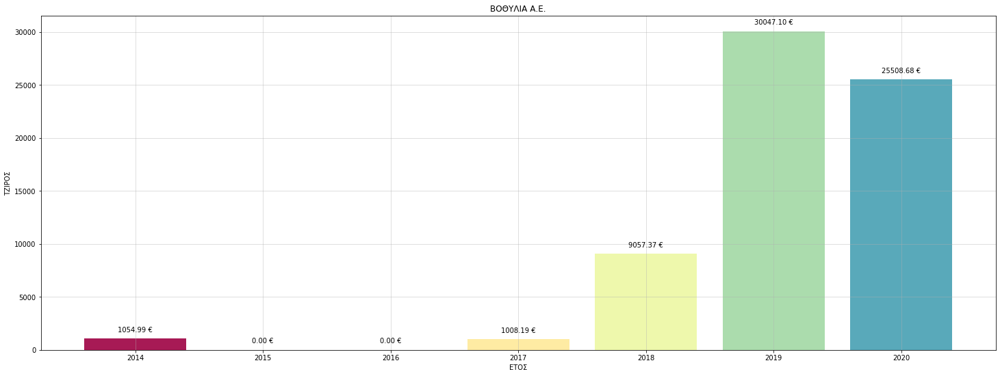

YEAR,2014,2015,2016,2017,2018,2019,2020,ΣΥΝΟΛΑ
SubCategory,,,,,,,,
Σεληνάρι,1054.99,0.0,0.0,1008.19,9057.37,30047.1,25508.68,66676.33
TOTAL,1054.99,0.0,0.0,1008.19,9057.37,30047.1,25508.68,66676.33


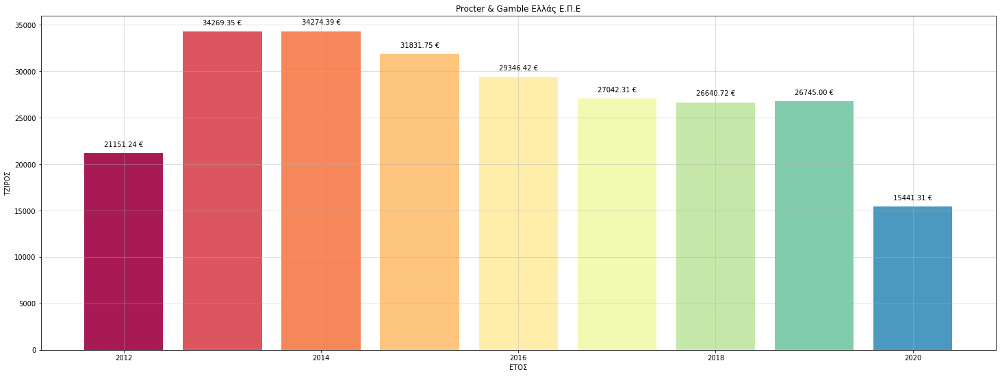

YEAR,2012,2013,2014,2015,2016,2017,2018,2019,2020,ΣΥΝΟΛΑ
SubCategory,,,,,,,,,,
Always,2609.87,3954.09,4060.45,3347.76,2893.65,2855.30,2721.88,2468.26,1439.29,26350.55
Ariel,2547.52,4229.61,4078.09,3364.73,2404.19,1911.97,1846.31,1978.95,1226.53,23587.90
Camay,122.08,36.47,0.00,0.00,18.63,52.27,45.36,0.00,0.00,274.81
Clairol,129.16,40.60,0.00,8.12,0.00,0.00,8.06,0.00,0.00,185.94
Crest,516.18,1116.84,428.74,675.45,181.58,368.82,514.18,224.04,0.00,4025.83
Essex,233.81,201.22,460.64,547.52,593.44,840.99,866.19,787.75,252.21,4783.77
Fairy,1053.75,2051.40,2121.62,2202.01,2648.18,2210.00,2351.57,2425.27,2257.97,19321.77
Gillette,1833.55,2660.25,3949.17,3944.20,4871.25,4322.37,4904.00,4949.46,2496.77,33931.02
Head&Shoulders,676.50,810.48,961.54,1046.27,1069.98,885.08,855.04,812.26,490.57,7607.72


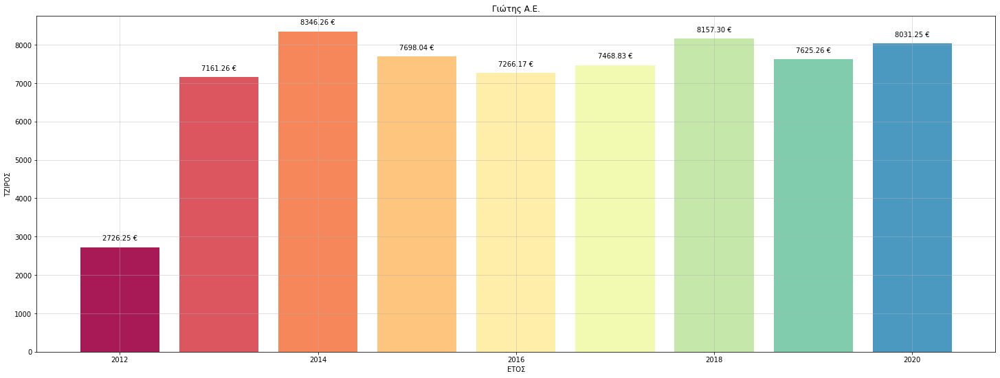

YEAR,2012,2013,2014,2015,2016,2017,2018,2019,2020,ΣΥΝΟΛΑ
SubCategory,,,,,,,,,,
Fytro,9.04,304.14,478.70,510.07,420.85,503.27,355.59,387.01,355.27,3323.94
Hemo,0.00,18.66,68.95,97.73,81.12,139.08,122.91,54.35,56.52,639.32
Άνθος,21.01,3.06,6.20,2.00,17.57,0.00,11.59,0.00,0.00,61.43
Γιώτης,2696.20,6835.40,7792.41,7088.24,6746.63,6826.48,7667.21,7183.90,7619.46,60455.93
TOTAL,2726.25,7161.26,8346.26,7698.04,7266.17,7468.83,8157.30,7625.26,8031.25,64480.62


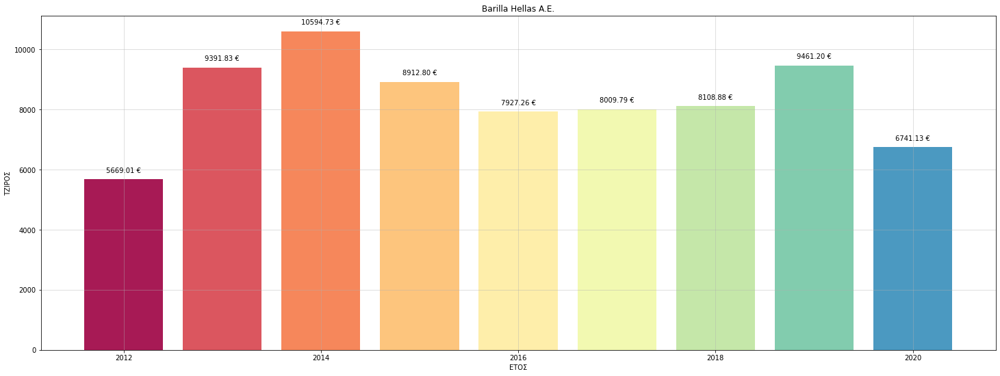

YEAR,2012,2013,2014,2015,2016,2017,2018,2019,2020,ΣΥΝΟΛΑ
SubCategory,,,,,,,,,,
Barilla,2225.30,3321.62,4261.34,2920.22,2754.97,3087.49,3175.53,4097.47,2839.54,28683.48
Misko,3032.33,5652.41,6009.06,5641.93,4621.05,4722.93,4702.19,5050.26,3839.38,43271.54
Wasa,411.38,417.80,324.33,350.65,551.24,199.37,231.16,313.47,62.21,2861.61
TOTAL,5669.01,9391.83,10594.73,8912.80,7927.26,8009.79,8108.88,9461.20,6741.13,74816.63


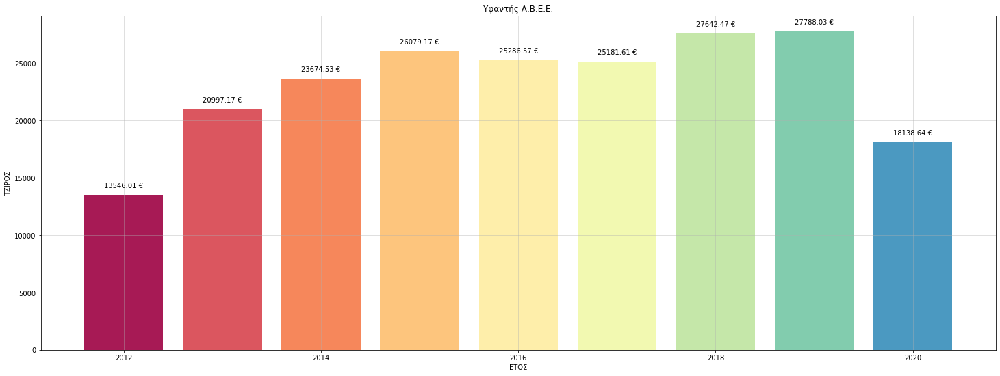

YEAR,2012,2013,2014,2015,2016,2017,2018,2019,2020,ΣΥΝΟΛΑ
SubCategory,,,,,,,,,,
Υφαντής,13546.01,20997.17,23674.53,26079.17,25286.57,25181.61,27642.47,27788.03,18138.64,208334.2
TOTAL,13546.01,20997.17,23674.53,26079.17,25286.57,25181.61,27642.47,27788.03,18138.64,208334.2


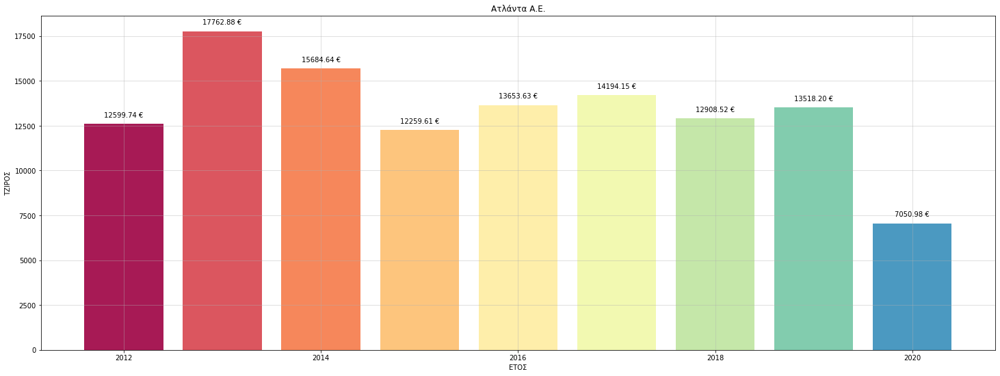

YEAR,2012,2013,2014,2015,2016,2017,2018,2019,2020,ΣΥΝΟΛΑ
SubCategory,,,,,,,,,,
Kelloggs,6327.63,9132.14,8319.06,7459.18,8083.90,8575.89,7683.27,7555.49,5014.21,68150.77
Twinings,836.12,1286.33,1240.81,399.11,951.17,749.86,862.93,1101.64,432.59,7860.56
Ατλάντα,5435.99,7344.41,6124.77,4401.32,4618.56,4868.40,4362.32,4861.07,1604.18,43621.02
TOTAL,12599.74,17762.88,15684.64,12259.61,13653.63,14194.15,12908.52,13518.20,7050.98,119632.35


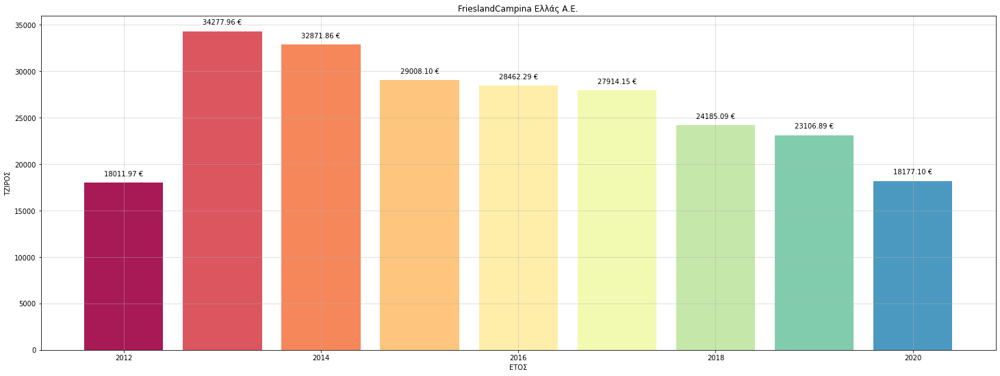

YEAR,2012,2013,2014,2015,2016,2017,2018,2019,2020,ΣΥΝΟΛΑ
SubCategory,,,,,,,,,,
Fina,203.00,268.84,184.68,367.87,415.01,318.81,265.10,124.41,177.51,2325.23
Frisolac,0.00,20.80,31.20,41.60,0.00,101.02,126.06,160.44,11.46,492.58
Milner,950.78,688.55,632.80,298.21,344.59,467.67,528.23,299.48,257.72,4468.03
Nounou,15499.84,30988.25,29563.83,26740.48,25666.11,24918.08,21696.73,20997.30,16675.21,212745.83
Βλάχας,1358.35,2311.52,2459.35,1559.94,2036.58,2108.57,1568.97,1525.26,1055.20,15983.74
TOTAL,18011.97,34277.96,32871.86,29008.10,28462.29,27914.15,24185.09,23106.89,18177.10,236015.41


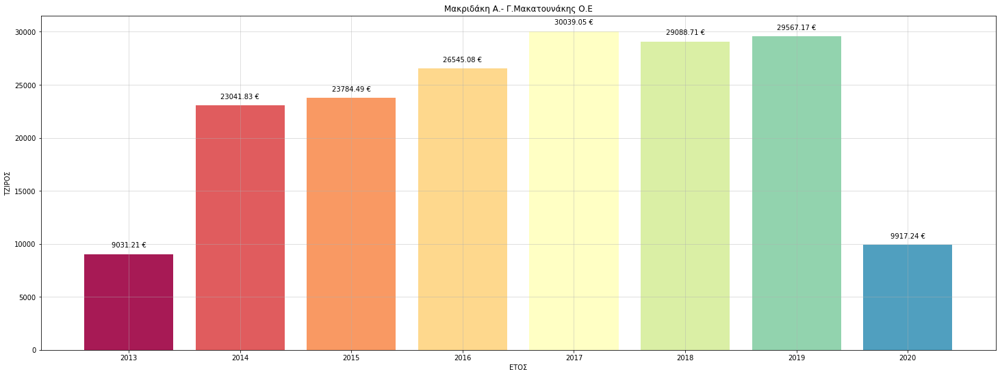

YEAR,2013,2014,2015,2016,2017,2018,2019,2020,ΣΥΝΟΛΑ
SubCategory,,,,,,,,,
Elli Spices,9031.21,23041.83,23784.49,26545.08,30039.05,29088.71,29567.17,9917.24,181014.78
TOTAL,9031.21,23041.83,23784.49,26545.08,30039.05,29088.71,29567.17,9917.24,181014.78


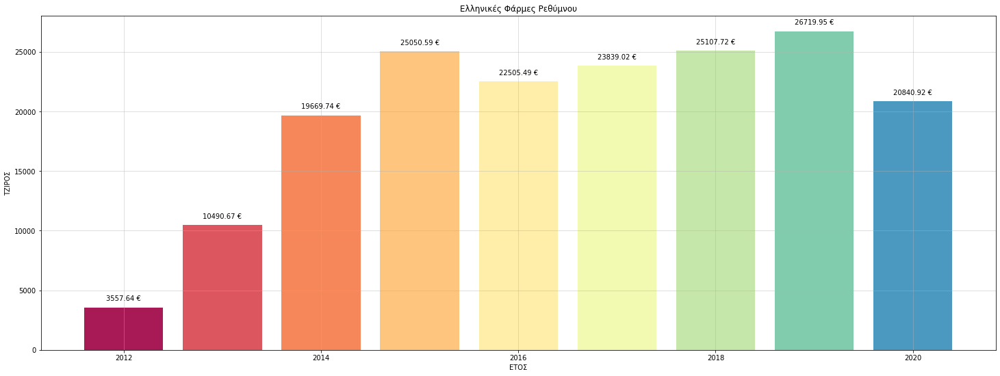

YEAR,2012,2013,2014,2015,2016,2017,2018,2019,2020,ΣΥΝΟΛΑ
SubCategory,,,,,,,,,,
Hellenic,3557.64,10490.67,19669.74,25050.59,22505.49,23839.02,25107.72,26719.95,20840.92,177781.74
TOTAL,3557.64,10490.67,19669.74,25050.59,22505.49,23839.02,25107.72,26719.95,20840.92,177781.74


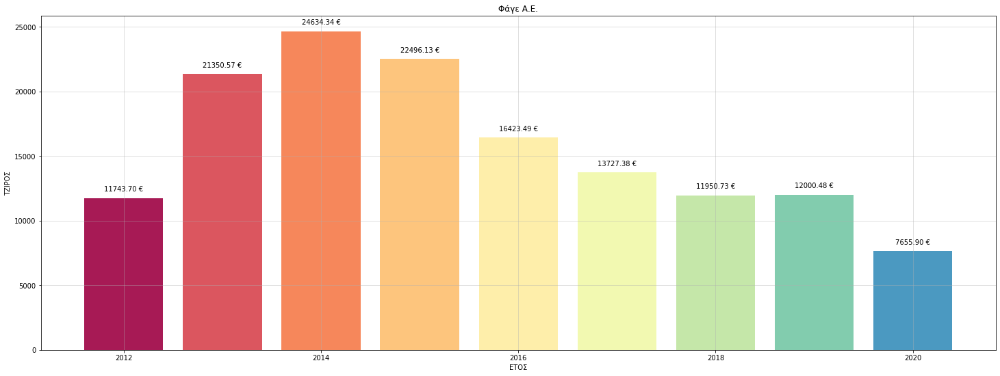

YEAR,2012,2013,2014,2015,2016,2017,2018,2019,2020,ΣΥΝΟΛΑ
SubCategory,,,,,,,,,,
Φάγε,11743.7,21350.57,24634.34,22496.13,16423.49,13727.38,11950.73,12000.48,7655.9,141982.72
TOTAL,11743.7,21350.57,24634.34,22496.13,16423.49,13727.38,11950.73,12000.48,7655.9,141982.72


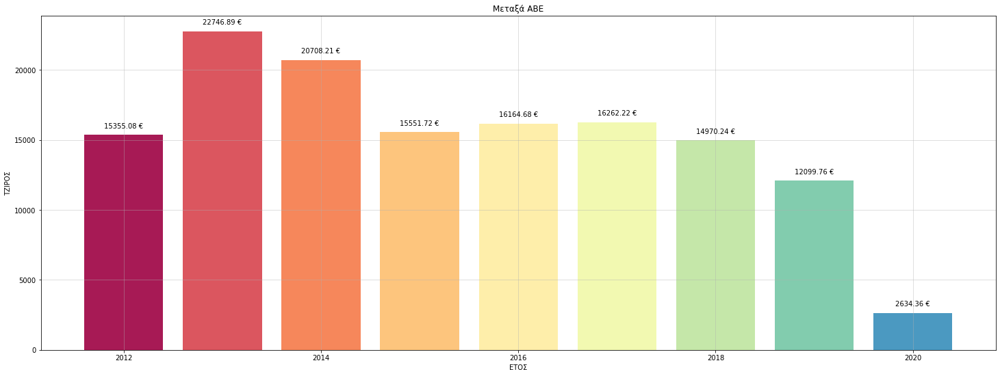

YEAR,2012,2013,2014,2015,2016,2017,2018,2019,2020,ΣΥΝΟΛΑ
SubCategory,,,,,,,,,,
Metaxa,15355.08,22746.89,20708.21,15551.72,16164.68,16262.22,14970.24,12099.76,2634.36,136493.16
TOTAL,15355.08,22746.89,20708.21,15551.72,16164.68,16262.22,14970.24,12099.76,2634.36,136493.16


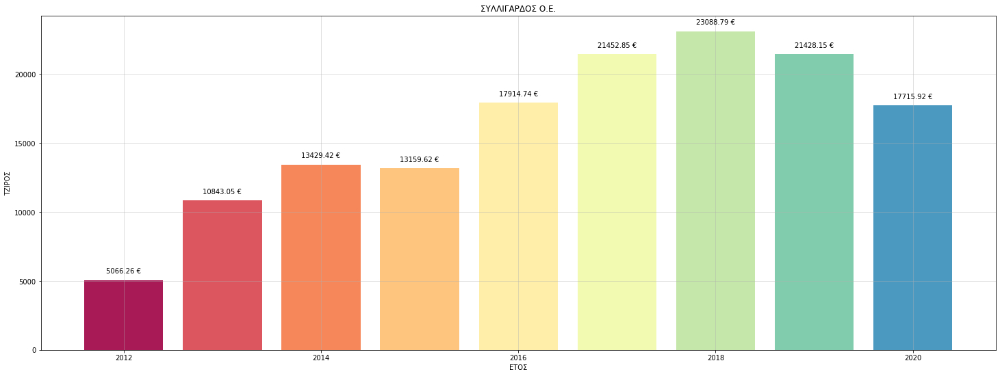

YEAR,2012,2013,2014,2015,2016,2017,2018,2019,2020,ΣΥΝΟΛΑ
SubCategory,,,,,,,,,,
Αγνότης,5066.26,10843.05,13429.42,13159.62,17914.74,21452.85,23088.79,21428.15,17567.08,143949.96
Συλλιγάρδος,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,148.84,148.84
TOTAL,5066.26,10843.05,13429.42,13159.62,17914.74,21452.85,23088.79,21428.15,17715.92,144098.80


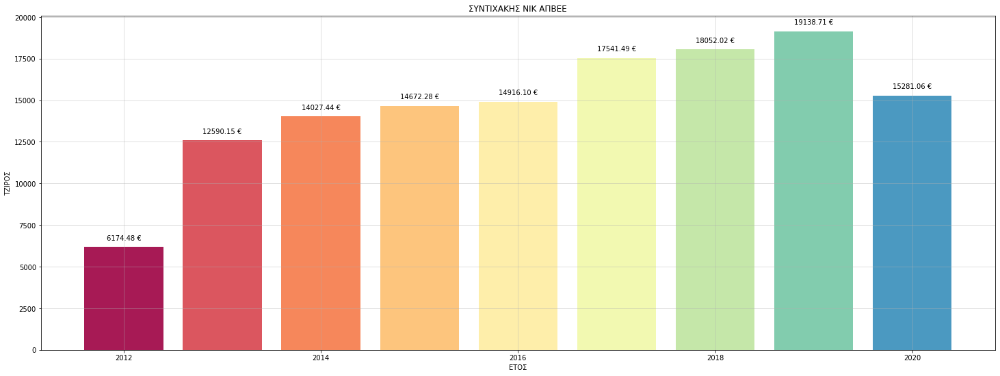

YEAR,2012,2013,2014,2015,2016,2017,2018,2019,2020,ΣΥΝΟΛΑ
SubCategory,,,,,,,,,,
Συντιχάκης,6174.48,12590.15,14027.44,14672.28,14916.1,17541.49,18052.02,19138.71,15281.06,132393.73
TOTAL,6174.48,12590.15,14027.44,14672.28,14916.1,17541.49,18052.02,19138.71,15281.06,132393.73


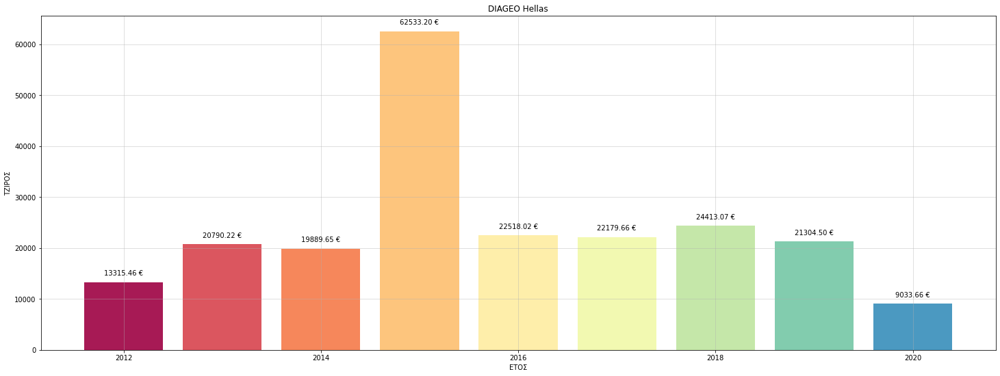

YEAR,2012,2013,2014,2015,2016,2017,2018,2019,2020,ΣΥΝΟΛΑ
SubCategory,,,,,,,,,,
Baileys,967.38,1815.19,1844.12,1383.15,1068.60,1300.10,920.09,828.36,302.67,10429.66
Captain Morgan,437.73,751.08,1239.22,1530.64,1328.18,1700.16,1354.39,1504.24,342.88,10188.52
Cardhu,185.34,463.35,291.69,232.54,288.25,306.40,183.84,519.26,91.92,2562.59
Dimple,240.03,346.71,240.03,78.50,226.33,173.43,149.76,124.80,105.69,1685.28
Gordon Space,146.27,320.68,382.64,259.28,261.46,349.33,256.67,135.18,69.02,2180.53
Gordons,3743.49,5767.24,5078.33,5900.99,7380.68,6503.53,6396.89,5895.57,1749.13,48415.85
Grand Marnier,21.13,126.78,91.02,126.43,96.95,25.69,126.94,24.19,0.00,639.13
Haig,77.05,77.05,136.21,353.37,321.65,202.50,193.08,273.54,354.00,1988.45
J&B,277.72,116.32,138.88,136.28,172.20,189.42,172.20,154.98,53.31,1411.31


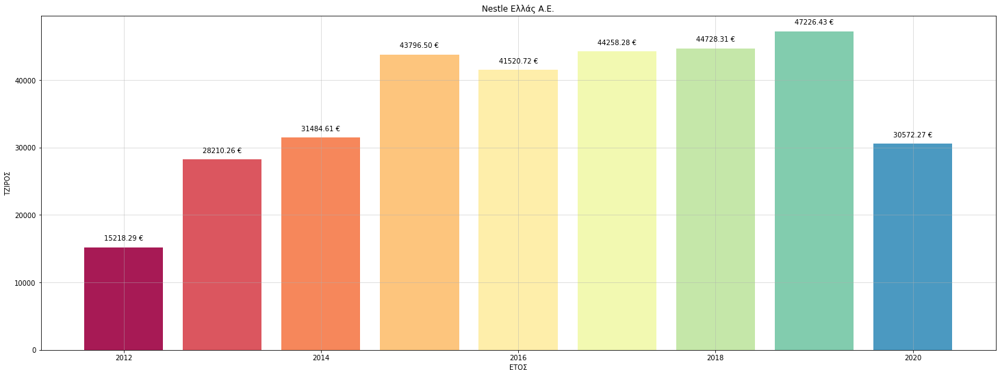

YEAR,2012,2013,2014,2015,2016,2017,2018,2019,2020,ΣΥΝΟΛΑ
SubCategory,,,,,,,,,,
Felix,381.48,568.16,706.76,905.65,440.15,946.22,234.99,1010.16,1625.90,6819.47
Fitness,600.43,1872.98,2353.00,2408.95,1693.11,1612.99,1433.77,1288.71,1289.16,14553.10
Friskies,95.96,44.88,0.00,234.90,5.28,142.80,633.99,387.66,381.79,1927.26
Gourmet,172.93,267.94,231.80,827.39,584.61,940.68,1216.91,1087.57,977.42,6307.25
Maggi,81.39,160.73,0.00,177.78,557.89,858.40,1154.74,1195.67,835.31,5021.91
Nescafe,6998.58,13643.55,15304.78,14637.53,14352.89,13260.87,13903.48,13858.99,9375.96,115336.63
Nesquik,379.02,727.28,723.04,626.91,596.02,478.15,548.85,313.03,267.46,4659.76
Nestle,3060.86,4731.01,5319.02,17261.10,17678.36,18921.57,18923.76,20656.95,10182.36,116734.99
Perrier,1076.98,1031.77,1082.63,1128.98,648.01,682.53,494.07,349.49,386.25,6880.71


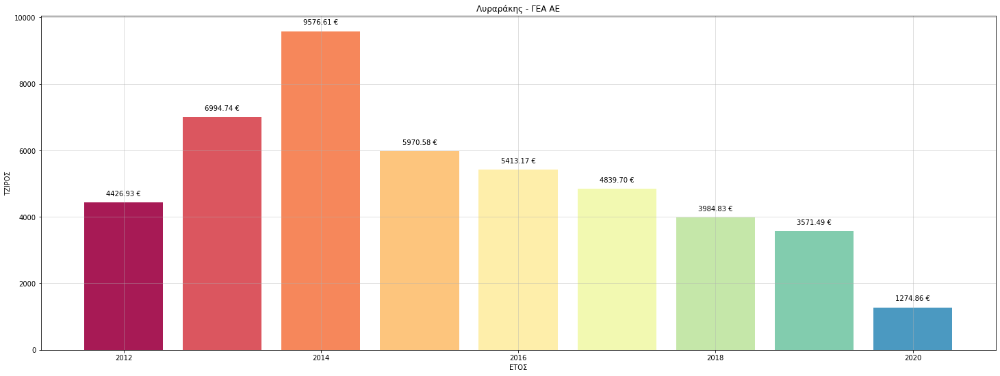

YEAR,2012,2013,2014,2015,2016,2017,2018,2019,2020,ΣΥΝΟΛΑ
SubCategory,,,,,,,,,,
Lyrarakis,4426.93,6994.74,9576.61,5970.58,5413.17,4839.7,3984.83,3571.49,1274.86,46052.91
TOTAL,4426.93,6994.74,9576.61,5970.58,5413.17,4839.7,3984.83,3571.49,1274.86,46052.91


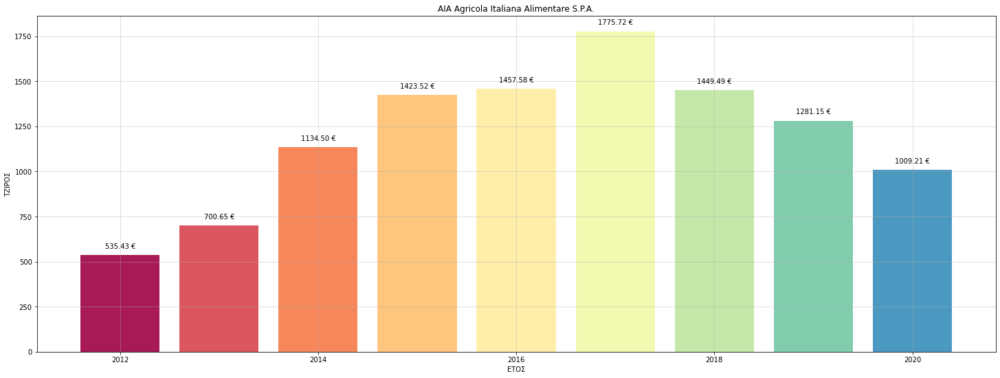

YEAR,2012,2013,2014,2015,2016,2017,2018,2019,2020,ΣΥΝΟΛΑ
SubCategory,,,,,,,,,,
Aia Wudy,523.85,689.07,1134.5,1423.52,1457.58,1775.72,1449.49,1281.15,990.61,10725.49
Gran Podere,11.58,11.58,0.0,0.00,0.00,0.00,0.00,0.00,18.60,41.76
TOTAL,535.43,700.65,1134.5,1423.52,1457.58,1775.72,1449.49,1281.15,1009.21,10767.25


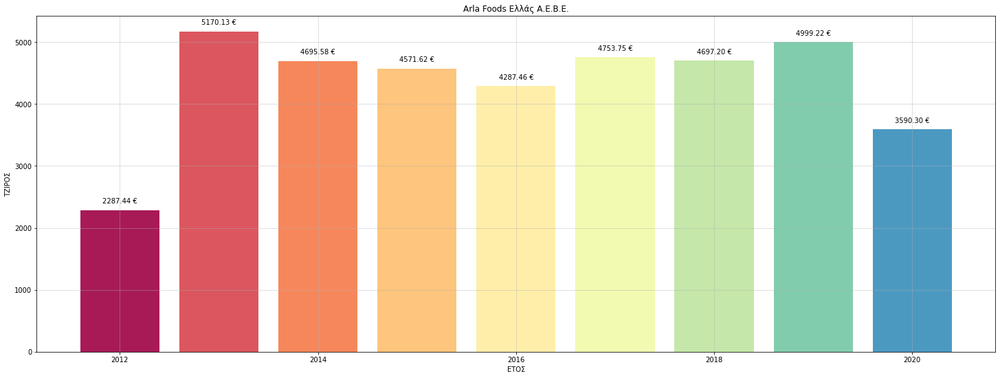

YEAR,2012,2013,2014,2015,2016,2017,2018,2019,2020,ΣΥΝΟΛΑ
SubCategory,,,,,,,,,,
Arla,0.00,0.00,0.00,155.79,251.38,207.26,400.41,588.55,440.48,2043.87
Buko,0.00,132.74,0.00,0.00,0.00,0.00,0.00,0.00,0.00,132.74
Castello,132.31,217.97,292.37,231.81,51.89,13.84,0.00,0.00,0.00,940.19
Lurpack,2155.13,4819.42,4403.21,4184.02,3984.19,4532.65,4296.79,4410.67,3149.82,35935.90
TOTAL,2287.44,5170.13,4695.58,4571.62,4287.46,4753.75,4697.20,4999.22,3590.30,39052.70


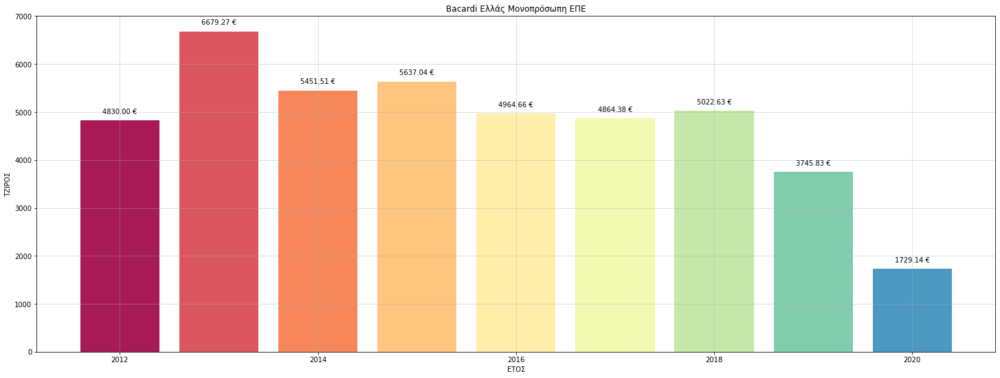

YEAR,2012,2013,2014,2015,2016,2017,2018,2019,2020,ΣΥΝΟΛΑ
SubCategory,,,,,,,,,,
Bacardi,4830.0,6679.27,5451.51,5637.04,4964.66,4864.38,5022.63,3745.83,1729.14,42924.46
TOTAL,4830.0,6679.27,5451.51,5637.04,4964.66,4864.38,5022.63,3745.83,1729.14,42924.46


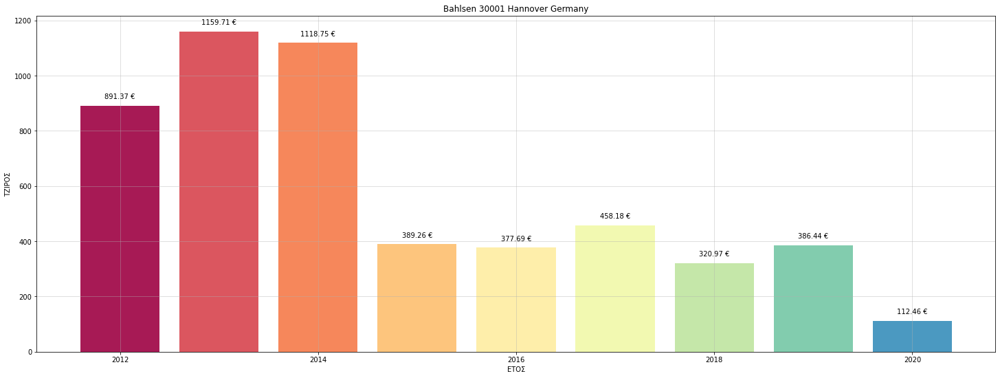

YEAR,2012,2013,2014,2015,2016,2017,2018,2019,2020,ΣΥΝΟΛΑ
SubCategory,,,,,,,,,,
Bahlsen,891.37,1159.71,1118.75,389.26,377.69,458.18,320.97,386.44,112.46,5214.83
TOTAL,891.37,1159.71,1118.75,389.26,377.69,458.18,320.97,386.44,112.46,5214.83


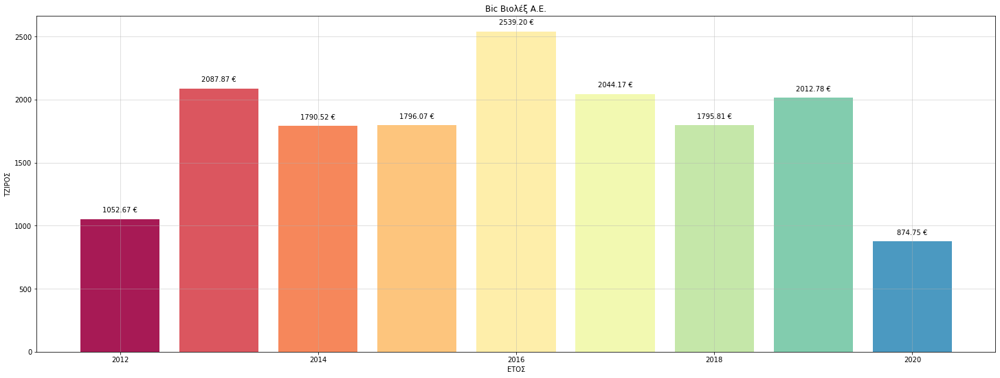

YEAR,2012,2013,2014,2015,2016,2017,2018,2019,2020,ΣΥΝΟΛΑ
SubCategory,,,,,,,,,,
Bic,1052.67,2087.87,1790.52,1796.07,2539.2,2044.17,1795.81,2012.78,874.75,15993.84
TOTAL,1052.67,2087.87,1790.52,1796.07,2539.2,2044.17,1795.81,2012.78,874.75,15993.84


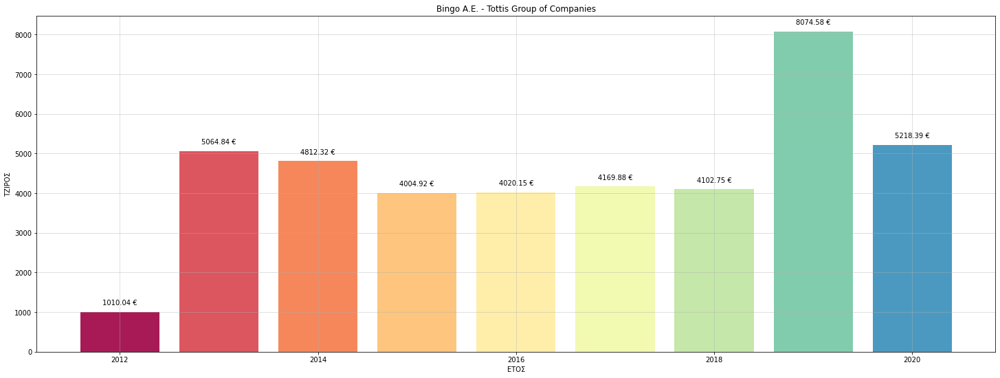

YEAR,2012,2013,2014,2015,2016,2017,2018,2019,2020,ΣΥΝΟΛΑ
SubCategory,,,,,,,,,,
Amaretti,192.68,698.24,655.62,1068.59,1001.08,783.54,933.02,1000.70,647.13,6980.60
Champion,339.49,2360.69,1345.22,671.97,464.14,372.61,460.78,498.75,362.01,6875.66
Koukou Roukou,102.96,246.39,240.41,14.63,25.21,0.00,20.74,34.03,24.27,708.64
Serenata,259.91,679.20,1331.37,1428.63,1724.02,2071.37,1807.96,2315.32,1700.51,13318.29
Tottis,0.00,0.00,0.00,0.00,56.58,48.33,207.77,3521.19,2100.59,5934.46
Τοττης,115.00,1080.32,1239.70,821.10,749.12,894.03,672.48,704.59,383.88,6660.22
TOTAL,1010.04,5064.84,4812.32,4004.92,4020.15,4169.88,4102.75,8074.58,5218.39,40477.87


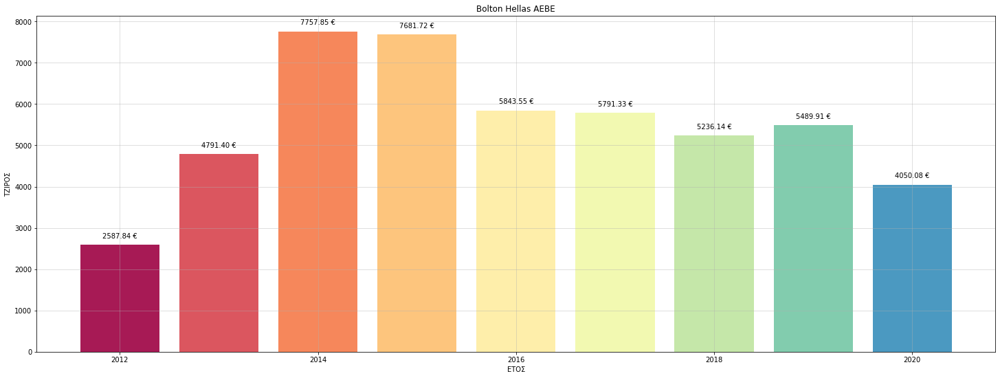

YEAR,2012,2013,2014,2015,2016,2017,2018,2019,2020,ΣΥΝΟΛΑ
SubCategory,,,,,,,,,,
Borotalco,0.00,0.00,0.00,0.00,0.00,0.00,0.00,86.07,7.86,93.93
Fornet,36.60,123.89,106.14,102.48,90.35,94.38,83.49,72.60,68.24,778.17
Merito,68.47,30.80,24.60,46.97,35.01,67.51,51.87,32.94,33.37,391.54
Neutro Roberts,206.56,202.73,171.38,215.41,91.68,153.69,160.17,31.46,110.49,1343.57
Omino Bianco,0.00,26.65,353.91,395.22,294.40,255.70,193.11,329.02,333.75,2181.76
Overlay,71.74,319.96,426.95,303.99,376.61,428.41,414.75,476.45,303.92,3122.78
Rio Mare,1681.38,2175.27,3106.51,2933.80,2549.90,2463.07,2349.69,2417.03,2013.76,21690.41
Softex,523.09,1912.10,3443.63,3442.96,2224.81,2172.77,1806.20,1898.99,1020.04,18444.59
WC Net,0.00,0.00,124.73,240.89,180.79,155.80,176.86,145.35,158.65,1183.07


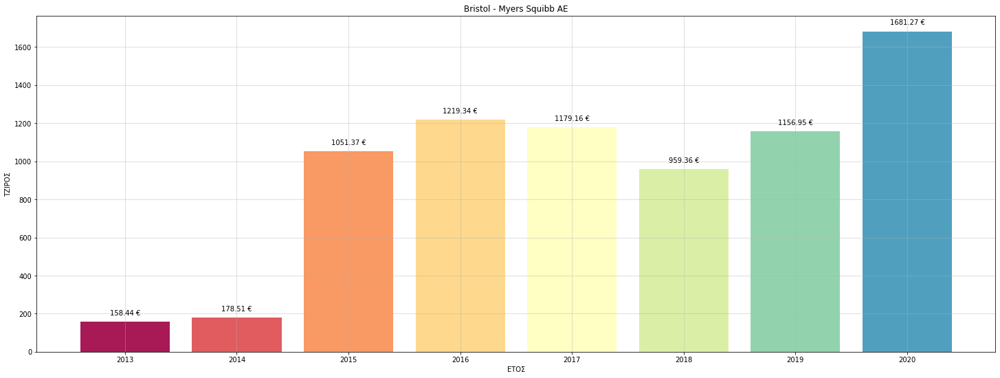

YEAR,2013,2014,2015,2016,2017,2018,2019,2020,ΣΥΝΟΛΑ
SubCategory,,,,,,,,,
Depon,158.44,178.51,1051.37,1219.34,1179.16,959.36,1156.95,1681.27,7584.4
TOTAL,158.44,178.51,1051.37,1219.34,1179.16,959.36,1156.95,1681.27,7584.4


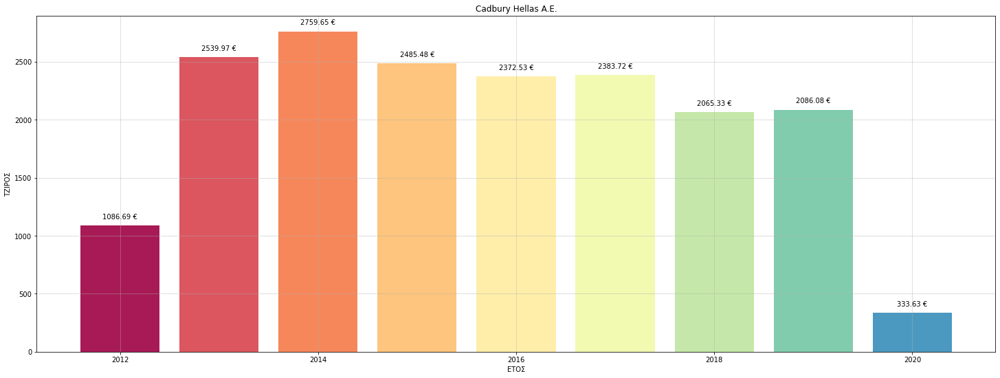

YEAR,2012,2013,2014,2015,2016,2017,2018,2019,2020,ΣΥΝΟΛΑ
SubCategory,,,,,,,,,,
Bassett's,147.32,42.34,142.62,49.72,13.56,0.00,0.00,0.00,0.00,395.56
Cadbury,939.37,2497.63,2617.03,2435.76,2358.97,2383.72,2065.33,2086.08,333.63,17717.52
TOTAL,1086.69,2539.97,2759.65,2485.48,2372.53,2383.72,2065.33,2086.08,333.63,18113.08


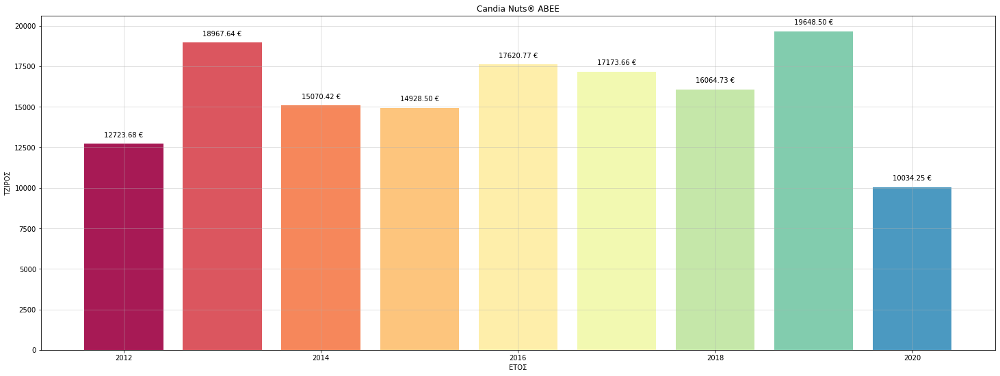

YEAR,2012,2013,2014,2015,2016,2017,2018,2019,2020,ΣΥΝΟΛΑ
SubCategory,,,,,,,,,,
Candia Nuts,7594.08,12554.76,10980.30,11658.02,14013.52,13440.09,11803.39,15644.71,8767.60,106456.47
Melibar,355.72,19.38,12.60,0.00,0.00,0.00,0.00,0.00,0.00,387.70
Μίνως,4773.88,6393.50,4077.52,3270.48,3607.25,3733.57,4261.34,4003.79,1266.65,35387.98
TOTAL,12723.68,18967.64,15070.42,14928.50,17620.77,17173.66,16064.73,19648.50,10034.25,142232.15


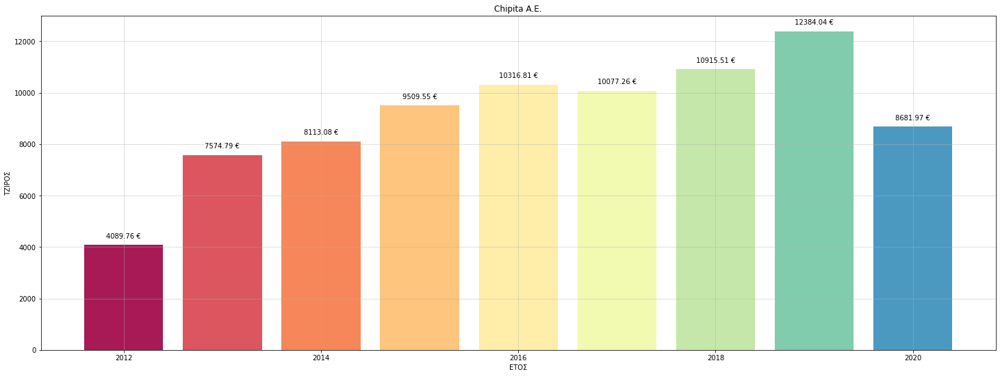

YEAR,2012,2013,2014,2015,2016,2017,2018,2019,2020,ΣΥΝΟΛΑ
SubCategory,,,,,,,,,,
7 Days,2952.08,5433.76,6125.83,8485.64,9552.05,8752.19,10093.20,10788.10,6989.65,69172.50
Chipita,0.00,0.71,13.41,19.08,17.82,133.97,0.00,350.30,543.36,1078.65
Extra,0.00,33.60,146.23,39.42,115.74,118.26,43.74,514.31,655.25,1666.55
Fineti,0.00,0.00,0.00,0.00,81.66,415.73,126.60,235.30,194.40,1053.69
Molto,767.25,1930.96,1827.61,965.41,549.54,657.11,651.97,496.03,299.31,8145.19
Recor,370.43,175.76,0.00,0.00,0.00,0.00,0.00,0.00,0.00,546.19
TOTAL,4089.76,7574.79,8113.08,9509.55,10316.81,10077.26,10915.51,12384.04,8681.97,81662.77


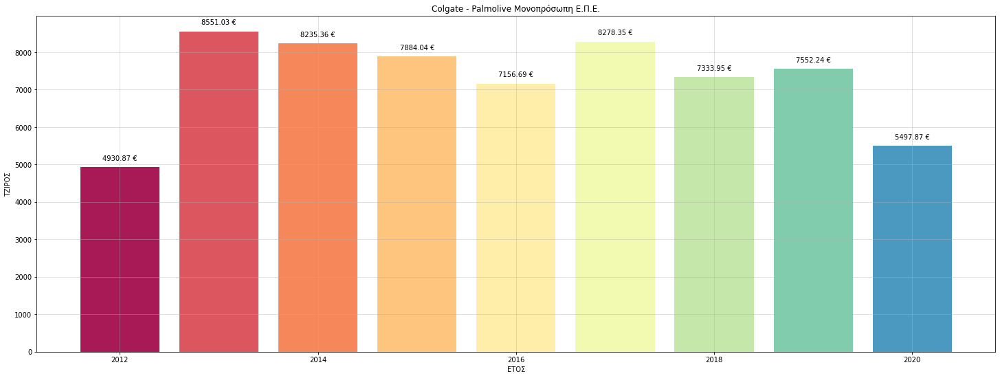

YEAR,2012,2013,2014,2015,2016,2017,2018,2019,2020,ΣΥΝΟΛΑ
SubCategory,,,,,,,,,,
Azax,971.44,1848.49,1652.80,1740.34,1571.05,1396.18,1086.85,1028.94,917.17,12213.26
Colgate,2037.22,3501.21,3789.97,3364.55,3452.31,4414.29,3744.95,4112.96,2395.34,30812.80
Fabuloso,156.86,296.60,283.16,407.23,286.18,215.68,280.64,252.98,185.62,2364.95
Palmolive,1168.36,1480.90,1018.94,927.15,600.66,728.31,600.75,909.48,615.31,8049.86
Soupline,596.99,1423.83,1490.49,1444.77,1246.49,1523.89,1620.76,1247.88,1384.43,11979.53
TOTAL,4930.87,8551.03,8235.36,7884.04,7156.69,8278.35,7333.95,7552.24,5497.87,65420.40


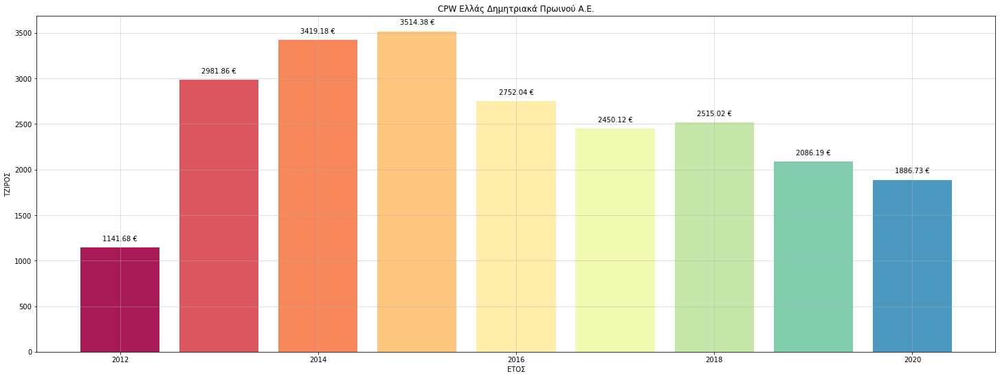

YEAR,2012,2013,2014,2015,2016,2017,2018,2019,2020,ΣΥΝΟΛΑ
SubCategory,,,,,,,,,,
Cheerios,55.80,220.10,178.54,335.39,386.22,256.78,379.10,367.26,198.11,2377.30
Clusters,106.43,161.50,164.60,143.13,76.69,102.20,153.30,117.19,132.00,1157.04
Fitness,600.43,1872.98,2353.00,2408.95,1693.11,1612.99,1433.77,1288.71,1289.16,14553.10
Nesquik,379.02,727.28,723.04,626.91,596.02,478.15,548.85,313.03,267.46,4659.76
TOTAL,1141.68,2981.86,3419.18,3514.38,2752.04,2450.12,2515.02,2086.19,1886.73,22747.20


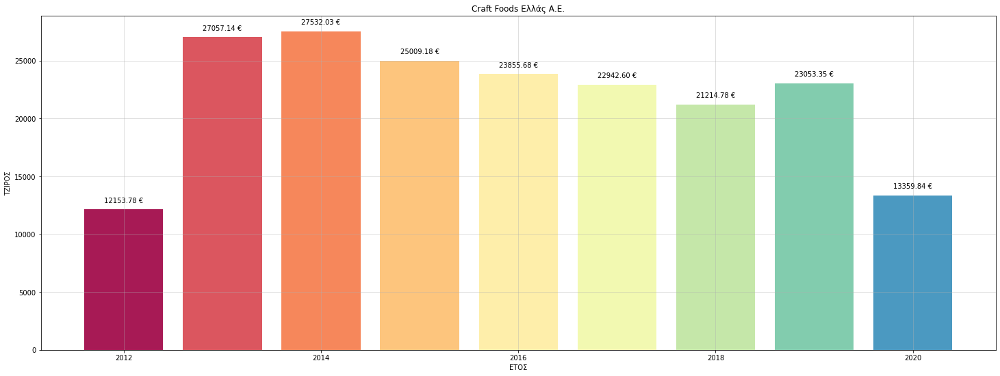

YEAR,2012,2013,2014,2015,2016,2017,2018,2019,2020,ΣΥΝΟΛΑ
SubCategory,,,,,,,,,,
Dentyne,0.00,85.04,43.23,98.36,94.74,126.27,43.69,56.55,37.73,585.61
Energizer,55.58,1816.32,2180.36,1034.35,617.45,120.64,31.50,35.92,3.99,5896.11
Fonzies,0.00,174.90,56.29,0.00,0.00,0.00,0.00,0.00,0.00,231.19
Halls,112.45,512.80,598.95,668.71,576.96,540.76,502.08,558.80,354.64,4426.15
Jacobs,1097.75,2747.64,2413.18,2480.10,2108.45,2487.70,2462.42,3226.35,1917.33,20940.92
Kraft,846.16,1409.10,1509.82,1133.16,959.11,1030.98,1158.11,1550.65,798.69,10395.78
Maxwell,0.00,11.33,85.15,42.83,153.00,95.44,111.36,109.43,11.16,619.70
Milka,3643.77,5775.22,4618.16,4379.72,4766.67,3801.89,3352.71,4631.99,1628.44,36598.57
Mondelez,384.54,651.12,608.99,322.59,275.88,335.67,360.72,394.17,222.73,3556.41


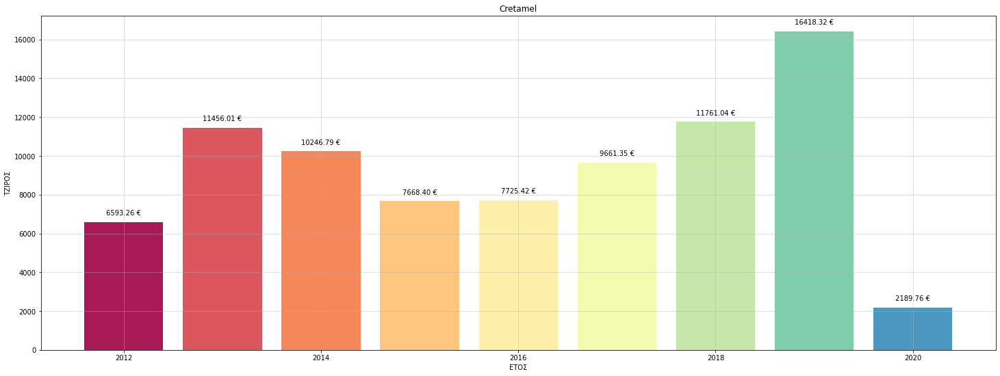

YEAR,2012,2013,2014,2015,2016,2017,2018,2019,2020,ΣΥΝΟΛΑ
SubCategory,,,,,,,,,,
Cretamel,49.92,386.23,1339.49,277.68,641.48,3035.25,5521.73,9445.35,1039.38,21736.51
Orino,6543.34,11069.78,8907.30,7390.72,7083.94,6626.10,6239.31,6972.97,1150.38,61983.84
TOTAL,6593.26,11456.01,10246.79,7668.40,7725.42,9661.35,11761.04,16418.32,2189.76,83720.35


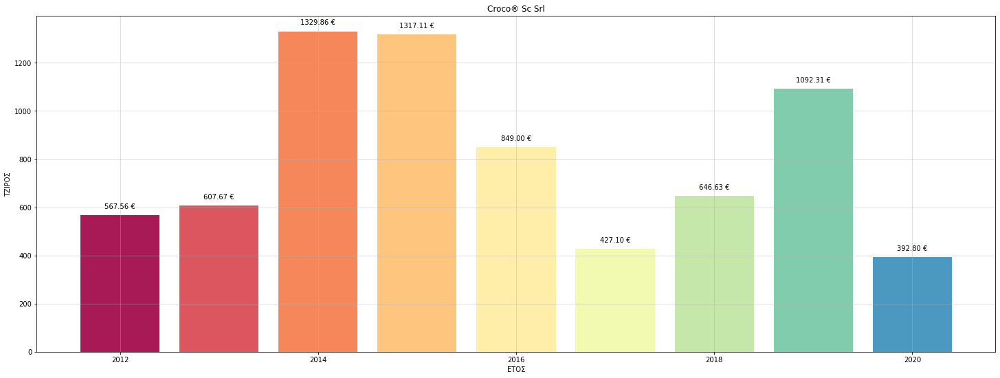

YEAR,2012,2013,2014,2015,2016,2017,2018,2019,2020,ΣΥΝΟΛΑ
SubCategory,,,,,,,,,,
Croco,567.56,607.67,1329.86,1317.11,849.0,427.1,646.63,1092.31,392.8,7230.04
TOTAL,567.56,607.67,1329.86,1317.11,849.0,427.1,646.63,1092.31,392.8,7230.04


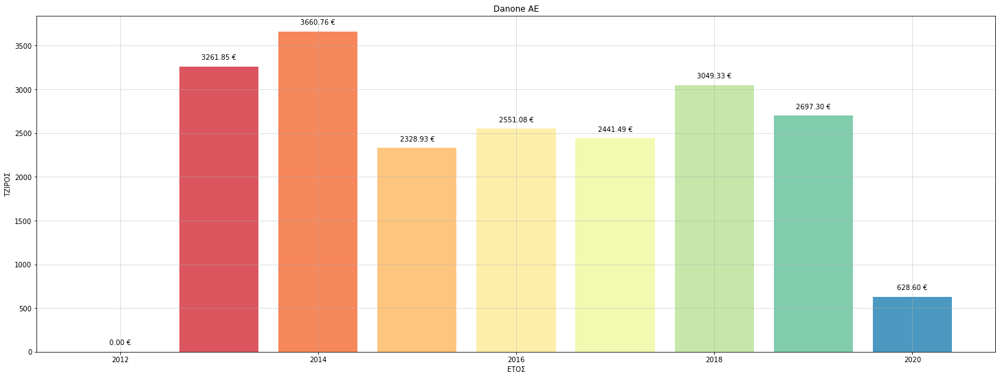

YEAR,2012,2013,2014,2015,2016,2017,2018,2019,2020,ΣΥΝΟΛΑ
SubCategory,,,,,,,,,,
Actimel,0.0,0.00,326.25,214.02,88.74,62.64,205.27,65.25,0.00,962.17
Activia,0.0,2260.87,2796.89,1837.14,1660.52,1564.36,1919.59,1952.91,458.55,14450.83
Danone,0.0,1000.98,537.62,277.77,801.82,814.49,924.47,679.14,170.05,5206.34
TOTAL,0.0,3261.85,3660.76,2328.93,2551.08,2441.49,3049.33,2697.30,628.60,20619.34


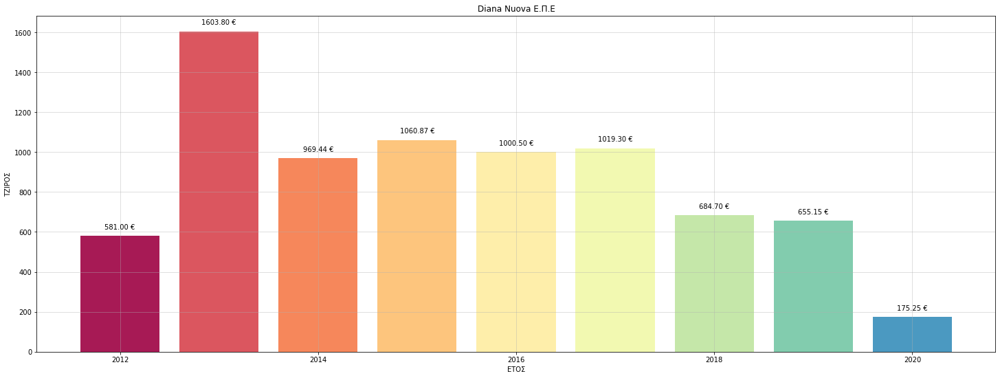

YEAR,2012,2013,2014,2015,2016,2017,2018,2019,2020,ΣΥΝΟΛΑ
SubCategory,,,,,,,,,,
Attiva,0.00,0.00,0.00,0.00,14.32,8.23,6.05,4.84,4.84,38.28
Diana,518.04,1390.34,863.25,945.52,847.73,883.32,596.02,577.65,162.21,6784.08
Diana Ottima,62.96,213.46,63.04,37.51,87.20,108.48,54.24,41.94,8.20,677.03
Flert,0.00,0.00,3.42,5.13,0.00,5.08,1.69,8.45,0.00,23.77
Ottima,0.00,0.00,39.73,72.71,51.25,14.19,26.70,22.27,0.00,226.85
TOTAL,581.00,1603.80,969.44,1060.87,1000.50,1019.30,684.70,655.15,175.25,7750.01


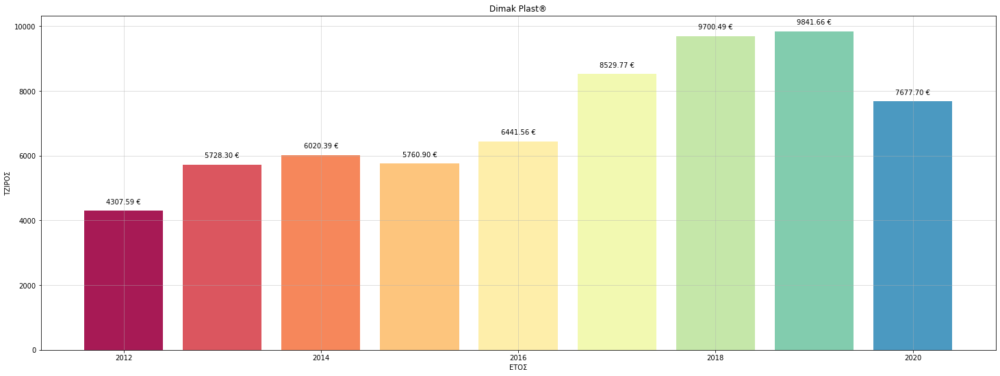

YEAR,2012,2013,2014,2015,2016,2017,2018,2019,2020,ΣΥΝΟΛΑ
SubCategory,,,,,,,,,,
Delta Plast,0.00,1.14,6.84,4.56,0.00,10.00,0.00,3.22,19.04,44.80
Dimak Plast,4293.28,5705.16,5786.17,5700.94,6210.36,7971.72,8761.75,8876.05,6889.94,60195.37
Viomes,14.31,15.90,13.05,33.89,183.36,395.62,481.33,525.41,289.72,1952.59
Viosarp,0.00,6.10,214.33,21.51,47.84,152.43,457.41,436.98,479.00,1815.60
TOTAL,4307.59,5728.30,6020.39,5760.90,6441.56,8529.77,9700.49,9841.66,7677.70,64008.36


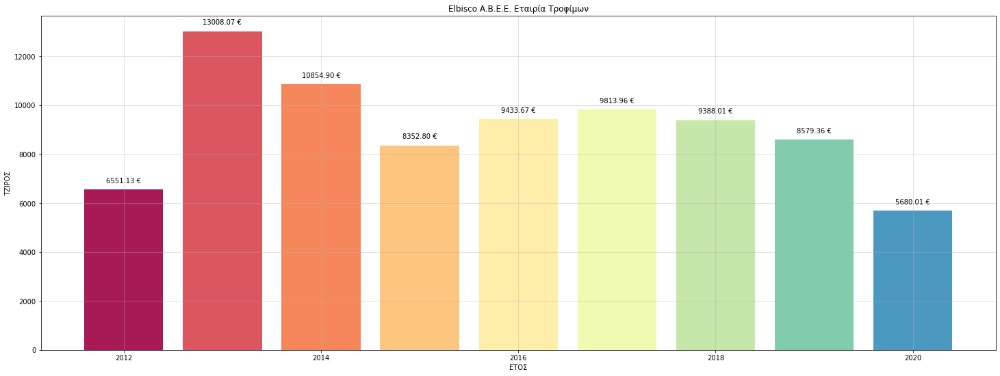

YEAR,2012,2013,2014,2015,2016,2017,2018,2019,2020,ΣΥΝΟΛΑ
SubCategory,,,,,,,,,,
Elite,3853.64,8235.77,5301.49,3098.08,3937.84,4956.32,4722.24,3649.53,2302.74,40057.65
Forma,330.22,510.13,567.25,443.17,554.87,402.05,480.39,456.90,397.03,4142.01
Rollers,0.00,0.00,0.00,75.52,67.44,151.14,48.26,155.74,47.60,545.70
Αλλατίνη,2367.27,4262.17,4986.16,4736.03,4873.52,4235.49,4017.75,4317.19,2932.64,36728.22
Κρις-Κρις,0.00,0.00,0.00,0.00,0.00,68.96,52.36,0.00,0.00,121.32
Μανα,0.00,0.00,0.00,0.00,0.00,0.00,67.01,0.00,0.00,67.01
TOTAL,6551.13,13008.07,10854.90,8352.80,9433.67,9813.96,9388.01,8579.36,5680.01,81661.91


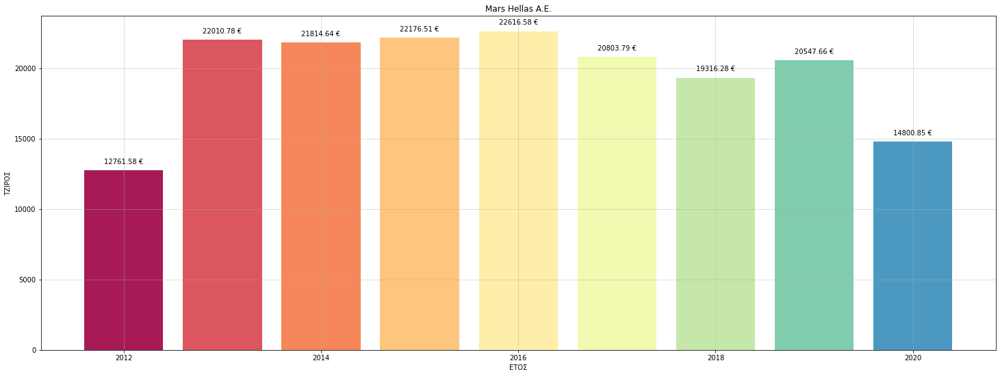

YEAR,2012,2013,2014,2015,2016,2017,2018,2019,2020,ΣΥΝΟΛΑ
SubCategory,,,,,,,,,,
Bounty,385.47,524.83,505.69,804.69,874.22,595.11,625.81,842.76,540.51,5699.09
Catisfactions,0.00,0.00,0.00,0.00,240.46,225.75,269.61,497.49,307.01,1540.32
Catsan,80.10,208.26,64.08,0.00,0.00,0.00,0.00,0.00,0.00,352.44
Dolmio,245.12,258.87,255.88,264.00,253.60,50.42,0.00,42.00,0.00,1369.89
Kitekat,253.07,764.79,1091.37,1006.31,924.30,1142.58,937.86,701.55,526.49,7348.32
Maltesers,206.90,381.28,478.65,525.58,883.50,961.93,758.51,702.79,545.72,5444.86
Mars,2447.35,3641.01,3938.06,3899.57,1844.75,872.16,1216.22,1301.23,730.77,19891.12
Milky Way,236.66,224.35,230.57,48.19,118.56,199.49,232.58,137.73,176.17,1604.30
Orbit,614.21,1213.30,745.77,1159.59,1491.12,1563.88,1624.03,1609.14,231.58,10252.62


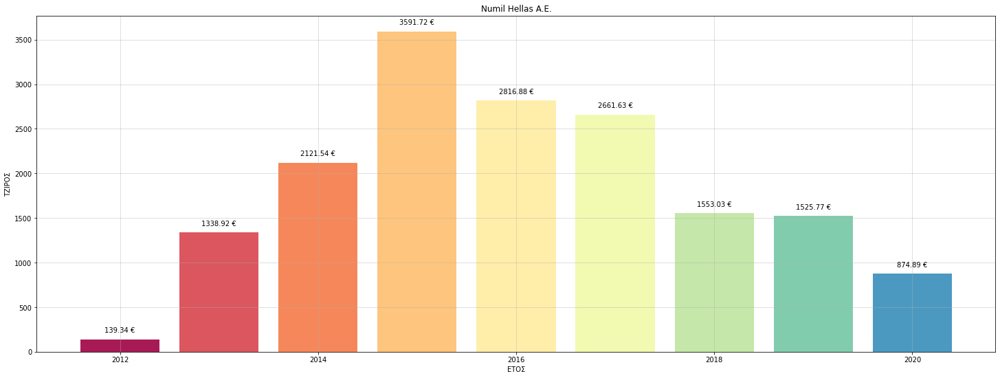

YEAR,2012,2013,2014,2015,2016,2017,2018,2019,2020,ΣΥΝΟΛΑ
SubCategory,,,,,,,,,,
Aptamil,0.00,140.60,0.00,811.26,834.80,443.48,476.74,282.76,70.63,3060.27
Milupa,0.00,0.00,0.00,1.73,19.03,0.00,0.00,0.00,0.00,20.76
Nutricia,139.34,1198.32,2121.54,2778.73,1963.05,2218.15,1076.29,1243.01,804.26,13542.69
TOTAL,139.34,1338.92,2121.54,3591.72,2816.88,2661.63,1553.03,1525.77,874.89,16623.72


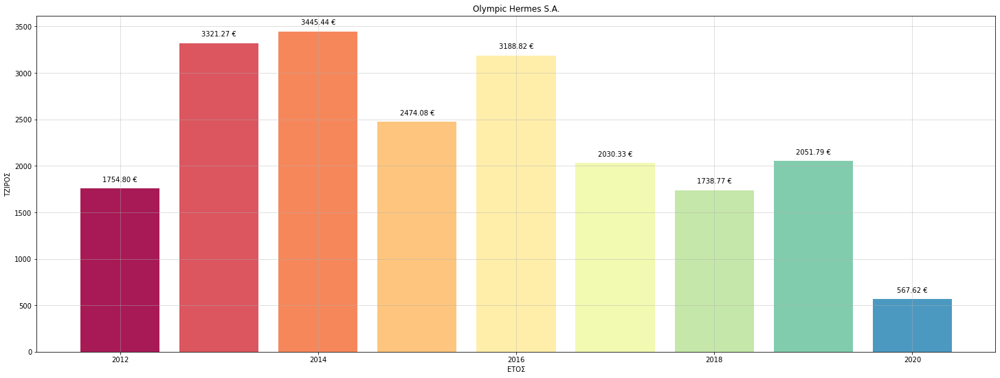

YEAR,2012,2013,2014,2015,2016,2017,2018,2019,2020,ΣΥΝΟΛΑ
SubCategory,,,,,,,,,,
Olympic,1754.8,3321.27,3445.44,2474.08,3188.82,2030.33,1738.77,2051.79,567.62,20572.92
TOTAL,1754.8,3321.27,3445.44,2474.08,3188.82,2030.33,1738.77,2051.79,567.62,20572.92


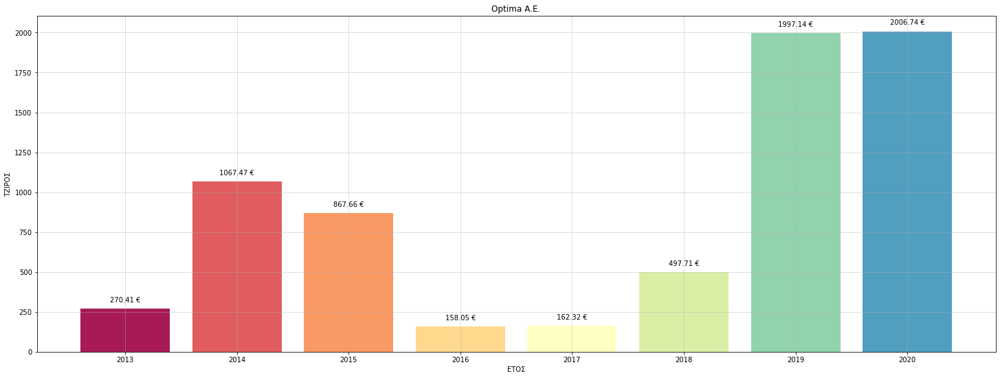

YEAR,2013,2014,2015,2016,2017,2018,2019,2020,ΣΥΝΟΛΑ
SubCategory,,,,,,,,,
Adoro,66.03,0.00,76.88,0.00,0.00,108.91,143.83,329.11,724.76
Dirollo,105.34,256.68,128.82,34.57,8.64,205.17,326.11,597.58,1662.91
Ήπειρος,99.04,810.79,661.96,123.48,153.68,183.63,1103.05,918.13,4053.76
Ταλαγάνι,0.00,0.00,0.00,0.00,0.00,0.00,424.15,161.92,586.07
TOTAL,270.41,1067.47,867.66,158.05,162.32,497.71,1997.14,2006.74,7027.50


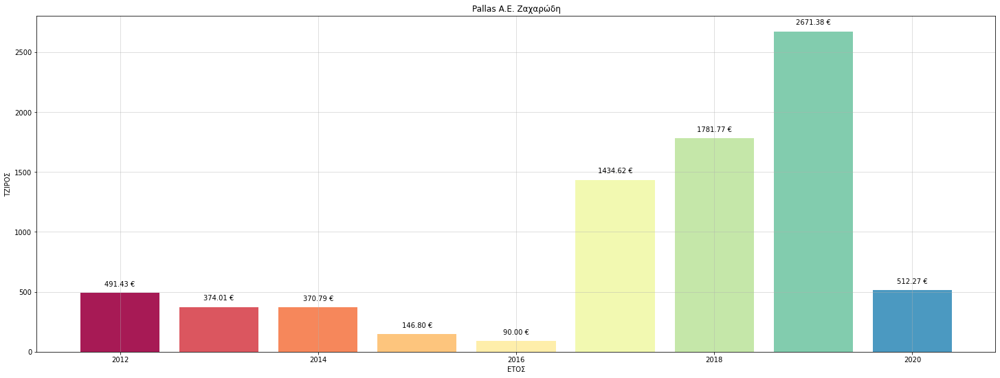

YEAR,2012,2013,2014,2015,2016,2017,2018,2019,2020,ΣΥΝΟΛΑ
SubCategory,,,,,,,,,,
Pallas,0.00,290.16,370.79,146.8,90.0,1434.62,1777.29,1660.91,504.83,6275.40
Λάβδας,491.43,83.85,0.00,0.0,0.0,0.00,4.48,1010.47,7.44,1597.67
TOTAL,491.43,374.01,370.79,146.8,90.0,1434.62,1781.77,2671.38,512.27,7873.07


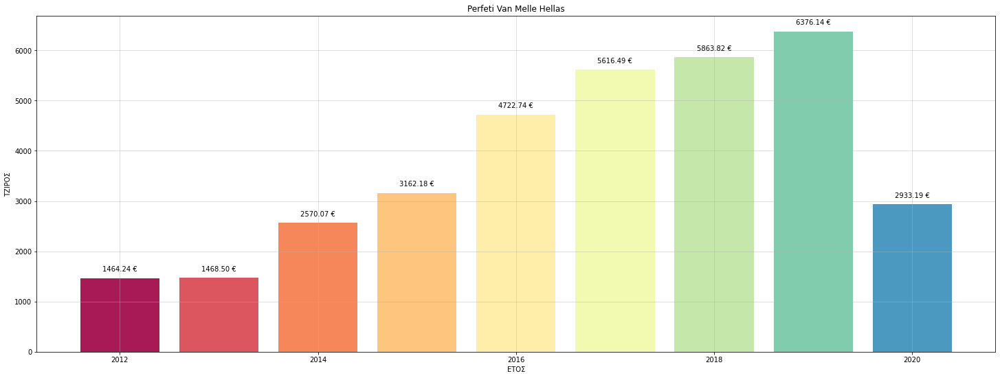

YEAR,2012,2013,2014,2015,2016,2017,2018,2019,2020,ΣΥΝΟΛΑ
SubCategory,,,,,,,,,,
Chupa Chups,323.89,126.41,380.01,762.74,1407.91,1491.64,1769.00,2012.15,892.16,9165.91
Fruittella,315.82,297.28,326.53,0.00,0.00,0.00,0.00,0.00,0.00,939.63
Mentos,824.53,1044.81,1783.21,2210.77,3134.86,3806.35,3892.55,4001.31,1872.90,22571.29
Vivident,0.00,0.00,80.32,188.67,179.97,318.50,202.27,362.68,168.13,1500.54
TOTAL,1464.24,1468.50,2570.07,3162.18,4722.74,5616.49,5863.82,6376.14,2933.19,34177.37


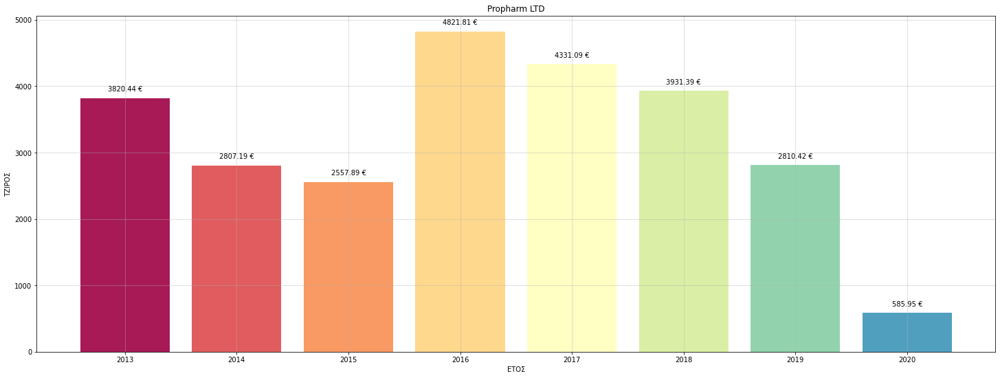

YEAR,2013,2014,2015,2016,2017,2018,2019,2020,ΣΥΝΟΛΑ
SubCategory,,,,,,,,,
Olive Touch,0.00,0.00,0.00,0.00,1301.73,1211.29,779.24,143.36,3435.62
Propharm,612.84,2749.83,2557.89,4821.81,3029.36,2720.10,2031.18,442.59,18965.60
Tantra Beauty,3207.60,57.36,0.00,0.00,0.00,0.00,0.00,0.00,3264.96
TOTAL,3820.44,2807.19,2557.89,4821.81,4331.09,3931.39,2810.42,585.95,25666.18


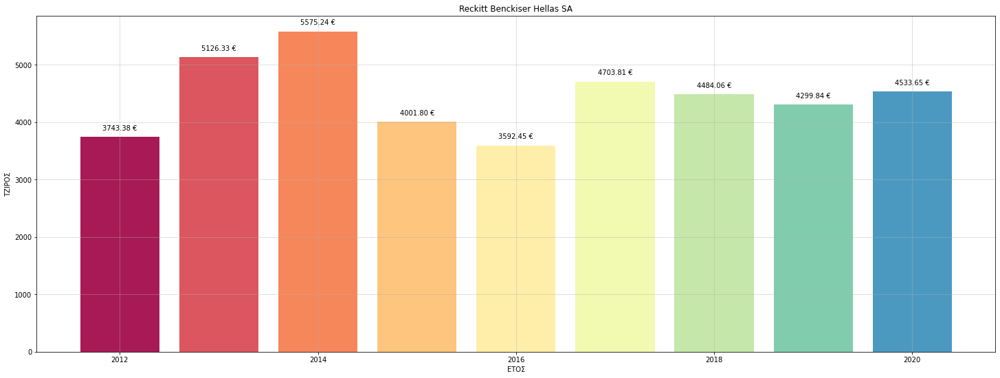

YEAR,2012,2013,2014,2015,2016,2017,2018,2019,2020,ΣΥΝΟΛΑ
SubCategory,,,,,,,,,,
Airwick,309.85,570.38,429.93,441.66,315.16,349.76,265.28,235.78,255.30,3173.10
Brasso,0.00,3.21,28.89,16.05,6.42,15.95,19.14,15.95,9.57,115.18
Calgon,307.52,320.95,285.74,289.95,327.83,298.51,292.98,403.47,446.15,2973.10
Cilit Bang,57.60,155.97,74.97,120.78,83.63,117.54,74.06,40.04,70.10,794.69
Clearasil,0.00,34.08,22.72,11.36,0.00,0.00,0.00,0.00,0.00,68.16
Dettol,527.31,504.53,667.21,760.89,727.63,1018.53,1144.51,977.67,2096.69,8424.97
Dr Scoll,0.00,0.00,817.50,93.30,13.62,0.00,120.55,42.19,24.11,1111.27
Finish,361.60,864.98,881.35,625.51,411.04,742.92,535.81,545.93,307.37,5276.51
Harpic,122.66,252.90,192.01,18.64,26.60,145.89,89.83,162.68,178.85,1190.06


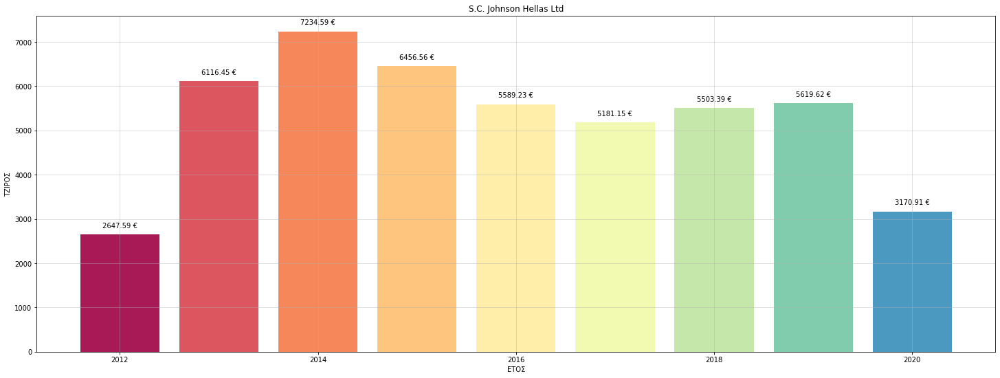

YEAR,2012,2013,2014,2015,2016,2017,2018,2019,2020,ΣΥΝΟΛΑ
SubCategory,,,,,,,,,,
Autan,510.75,1100.30,1147.90,807.91,850.45,850.80,1015.30,1225.22,625.04,8133.67
Baygon,1099.08,1899.60,2111.17,1648.15,1272.01,1253.34,1054.69,1121.01,708.08,12167.13
Bio Shout,38.52,118.77,151.59,160.94,198.62,203.21,140.01,186.31,34.20,1232.17
Duck,27.66,162.31,250.31,331.75,316.89,250.02,363.28,443.25,201.95,2347.42
Glade,66.83,579.40,773.22,1202.29,792.82,427.97,424.31,498.71,376.34,5141.89
Mr Muscle,40.20,82.45,313.83,186.27,163.62,225.12,85.09,84.38,7.62,1188.58
Pronto,0.00,0.00,44.33,53.04,24.52,32.34,5.44,0.00,0.00,159.67
Raid,864.55,2173.62,2442.24,2066.21,1970.30,1938.35,2415.27,2060.74,1217.68,17148.96
TOTAL,2647.59,6116.45,7234.59,6456.56,5589.23,5181.15,5503.39,5619.62,3170.91,47519.49


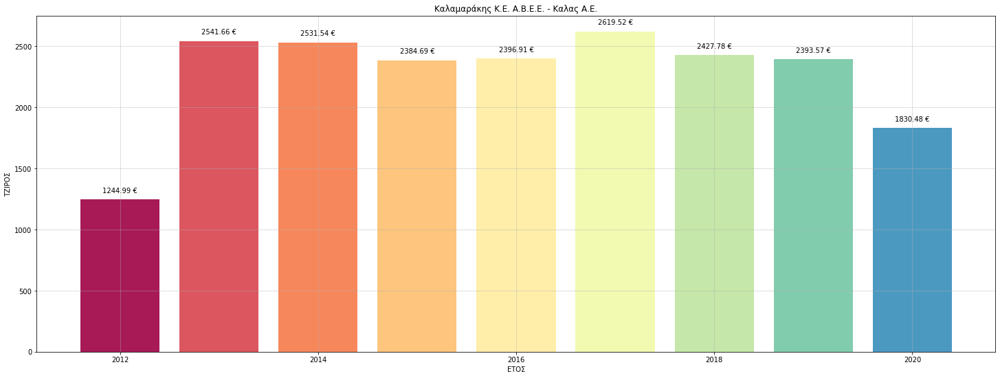

YEAR,2012,2013,2014,2015,2016,2017,2018,2019,2020,ΣΥΝΟΛΑ
SubCategory,,,,,,,,,,
Midland,103.76,165.38,160.09,77.40,131.47,143.84,166.98,170.46,136.88,1256.26
Tulip,216.46,542.38,607.62,748.99,740.36,532.36,529.62,423.78,290.47,4632.04
Ήρα,565.32,1001.94,1001.65,928.60,911.77,984.98,874.96,956.19,736.84,7962.25
Κάλας,359.45,805.51,762.18,629.70,613.31,958.34,856.22,843.14,666.29,6494.14
Φιλικές,0.00,26.45,0.00,0.00,0.00,0.00,0.00,0.00,0.00,26.45
TOTAL,1244.99,2541.66,2531.54,2384.69,2396.91,2619.52,2427.78,2393.57,1830.48,20371.14


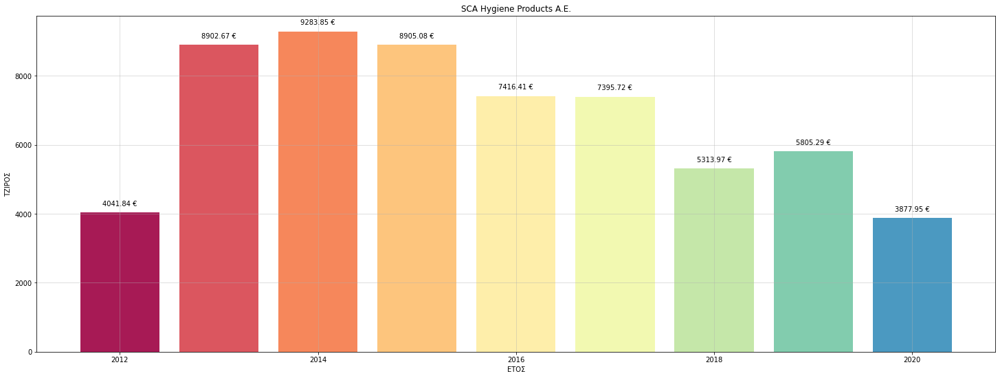

YEAR,2012,2013,2014,2015,2016,2017,2018,2019,2020,ΣΥΝΟΛΑ
SubCategory,,,,,,,,,,
Libero,834.15,518.67,1034.64,838.21,681.82,1284.10,649.45,877.10,357.59,7075.73
Libresse,269.83,590.49,755.01,572.79,520.45,771.31,674.41,649.26,230.46,5034.01
Tena,1710.09,5913.28,6294.14,6130.30,4684.27,4155.13,3125.93,3120.95,2694.13,37828.22
Zewa,1227.77,1880.23,1200.06,1363.78,1529.87,1185.18,864.18,1157.98,595.77,11004.82
TOTAL,4041.84,8902.67,9283.85,8905.08,7416.41,7395.72,5313.97,5805.29,3877.95,60942.78


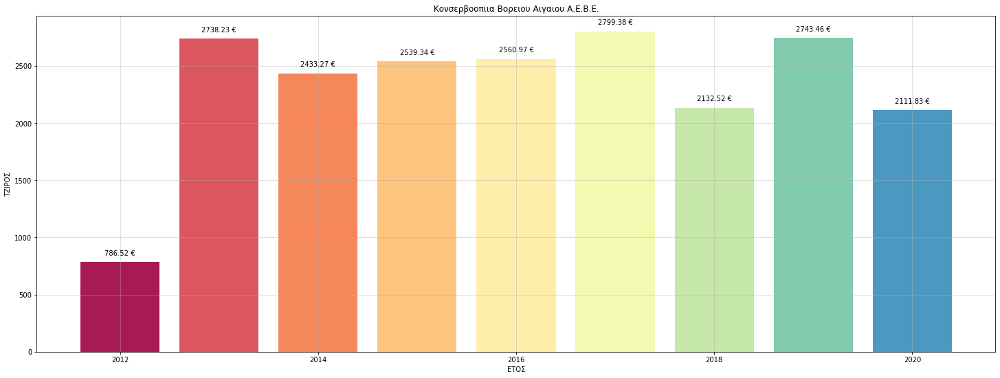

YEAR,2012,2013,2014,2015,2016,2017,2018,2019,2020,ΣΥΝΟΛΑ
SubCategory,,,,,,,,,,
Dakor,26.50,436.26,286.77,5.22,267.38,262.87,372.07,552.27,355.73,2565.07
Flokos,211.14,440.49,779.42,957.29,1193.89,1706.86,1109.78,1069.42,1148.63,8616.92
Trata,548.88,1861.48,1367.08,1576.83,1099.70,829.65,650.67,1121.77,607.47,9663.53
TOTAL,786.52,2738.23,2433.27,2539.34,2560.97,2799.38,2132.52,2743.46,2111.83,20845.52


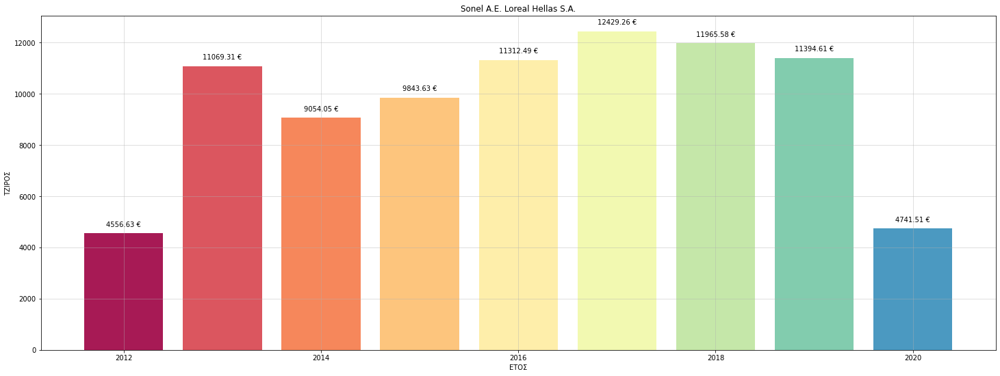

YEAR,2012,2013,2014,2015,2016,2017,2018,2019,2020,ΣΥΝΟΛΑ
SubCategory,,,,,,,,,,
Ambre Solaire,1944.92,6304.98,5827.43,4504.30,5675.80,6309.41,6308.13,5500.39,1537.87,43913.23
Dermo,0.00,0.00,0.00,100.25,88.00,45.96,0.00,0.00,0.00,234.21
Elvive,494.44,651.71,577.99,717.96,809.82,782.30,731.65,641.46,538.88,5946.21
Fructis,1206.39,1880.06,1040.63,1440.25,1115.73,988.48,805.86,1103.12,626.27,10206.79
Garnier,769.37,1127.02,523.20,1830.41,2671.20,3781.24,3692.34,3600.06,1755.23,19750.07
Loreal,109.81,777.63,885.55,768.00,522.05,259.64,207.48,370.37,187.02,4087.55
Studio,0.00,0.00,0.00,81.92,104.24,70.28,72.80,55.88,86.36,471.48
Studio FX,0.00,302.55,113.66,394.20,325.65,191.95,147.32,123.33,9.88,1608.54
minerals,31.70,25.36,85.59,6.34,0.00,0.00,0.00,0.00,0.00,148.99


In [15]:
for name,brand in zip(names,brands):
    data = notebook_run.cset(emspb, name, brand)
    display(data)

<center><img src=https://www.logolynx.com/images/logolynx/db/dbcfb1972c1f67549d873d5258085efc.png></center>

# <center> ΣΤΑΘΕΡΕΣ ΕΚΠΤΩΣΕΙΣ </center>

## ΒΗΜΑ 10ο
- Οι Σταθερές Εκπτώσεις που κάνουμε στους πελάτες μας είναι:
    - ΨΩΜΙ (Κάθε Δευτέρα και Τρίτη)
    - ΝΕΡΟ (Κάθε Τετάρτη και Πέμπτη)
    - ΓΑΛΑ (Κάθε Παρασκευή Σάββατο και Κυριακή)
## <center> ΨΩΜΙ </center>
- Ανάθεση του μοναδικού κωδικού στην μεταβλητή `code`

In [16]:
code = ('5200109530018','5200109530018')

- Εύρεση και Γένεση Ημερομηνιών από `01-01-2018 έως και σήμερα`
- Eπιλογή βάσει φίλτρων δλδ. η ημέρα να είναι `ΔΕΥΤΕΡΑ ή ΤΡΙΤΗ`
- Δημιουργία Λίστας `list` με τις σωστές ημερομηνίες

In [17]:
today = datetime.now()
dates = pd.date_range('2018-01-01', today)
dates = dates[(dates.strftime('%a') == 'Mon') | (dates.strftime('%a') == 'Tue')]
special_date = []
for date in dates:
    date = date.strftime('%Y-%m-%d')
    special_date.append(date)

- Η λίστα με τις ημερομηνίες δεν μπορούν να διαβαστούν από την Βάση Δεδομένων, έτσι θα χρειαστεί να την μετατρέψουμε σε `tuple`
- Αποθηκεύουμε τα αποτελέσματα της αναζήτησης στην Βάση μας σε μια `DataFrame` μεταβλητή
- Δημιουργούμε ένα `pivot table`
- Εμφανίζουμε τα αποτελέσματα

In [18]:
vardas_pricelist= pd.read_sql_query(sql.sales_from_pricelist(tuple(special_date), code), sql_connect.connect())

In [19]:
df = vardas_pricelist.pivot(index='MONTH', columns='YEAR', values='QUANTITY')
df = df.fillna(0)

- Στο παρακάτω γράφημα απεικονίζουμε την `ποσότητα πωλήσεων` για κάθε μήνα ξεχωριστά σε σχέση με τα έτη. 

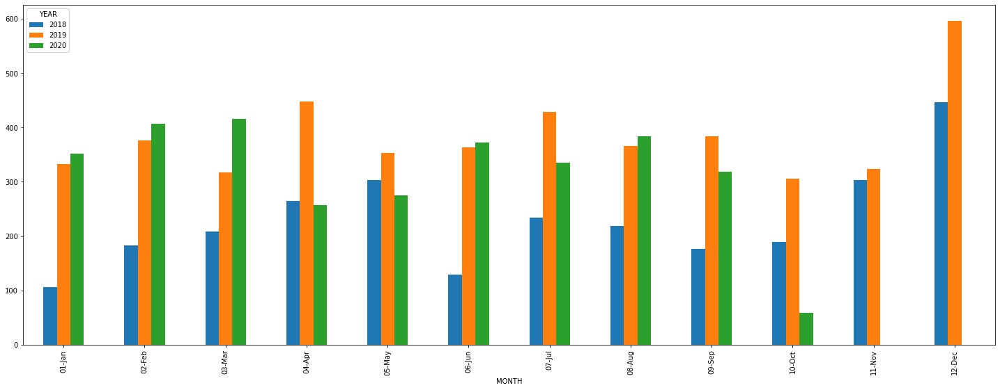

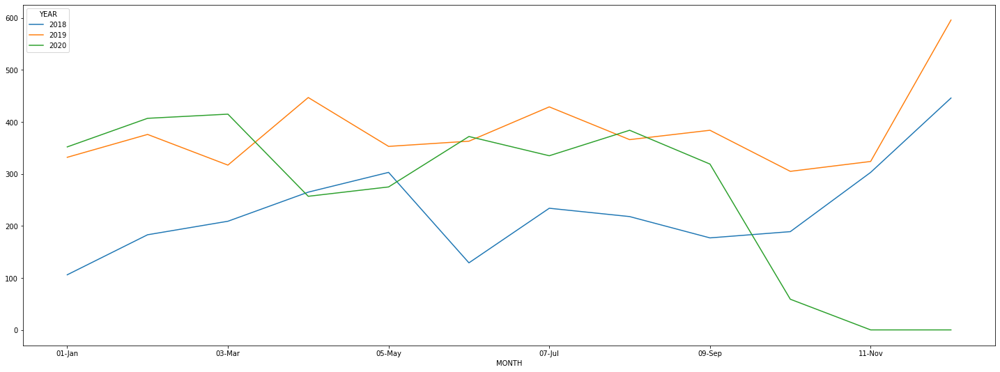

In [20]:
df.plot.bar(figsize=(25,9))
df.plot(figsize=(25,9))
plt.show()

- Η παρακάτω γραφική παράσταση απεικονίζει την κατανομή `Ποσοτικής Πώλησης` στο σύνολο του δείγματος
 <details>
<summary>Step Details <font color='green'>(click me)</font></summary>
    
     * Ένα ιστόγραμμα είναι ένα κλασικό εργαλείο οπτικοποίησης που αντιπροσωπεύει την κατανομή μιας ή περισσότερων μεταβλητών μετρώντας τον αριθμό των παρατηρήσεων που εμπίπτουν σε ξεχωριστούς κάδους.

     * Αυτή η συνάρτηση μπορεί να ομαλοποιήσει το στατιστικό στοιχείο που υπολογίζεται μέσα σε κάθε κάδο για να εκτιμήσει τη συχνότητα, την πυκνότητα ή τη μάζα πιθανότητας και μπορεί να προσθέσει μια ομαλή καμπύλη που λαμβάνεται χρησιμοποιώντας μια εκτίμηση πυκνότητας πυρήνα, παρόμοια με το kdeplot ().

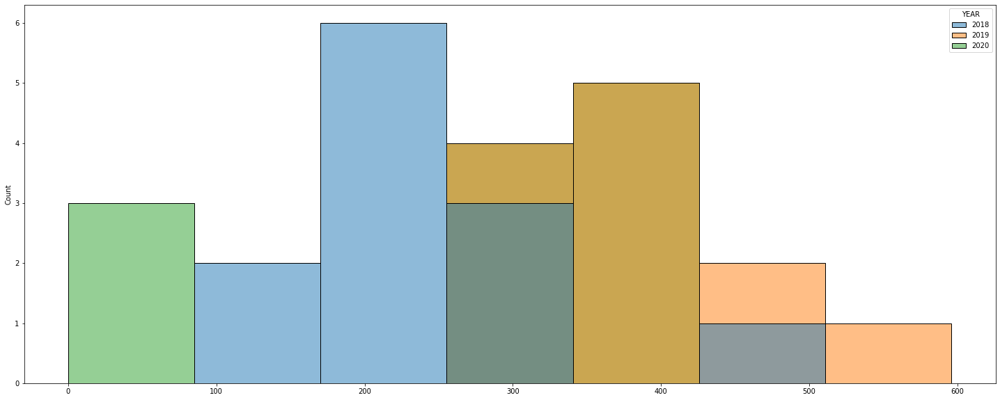

In [21]:
ax = plt.subplots(figsize=(25,10))
sns.histplot(df)
plt.show()

- Η παρακάτω γραφική παράσταση απεικονίζει την `ΣΥΝΟΛΙΚΗ ΠΟΣΟΤΗΤΑ ΠΩΛΗΣΕΩΝ / ΕΤΟΣ` (αφορά μόνο τις ημέρες που έχουμε το ψωμί προσφορά)

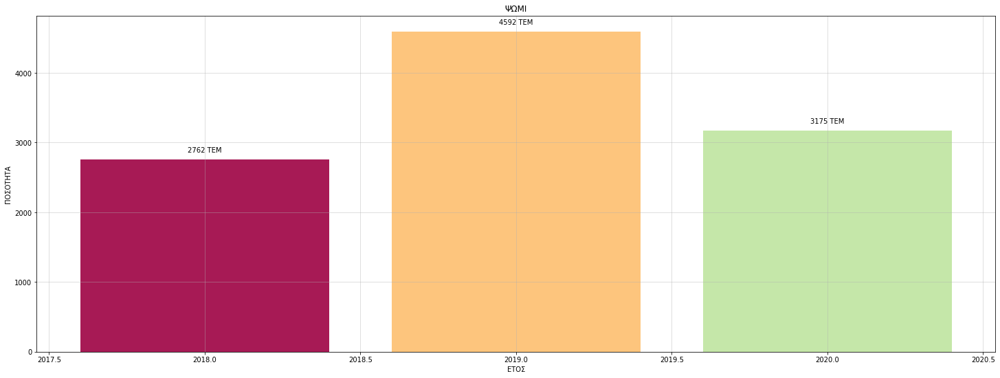

In [22]:
df_g = vardas_pricelist.groupby('YEAR').sum().reset_index()
X = df_g.YEAR
y = df_g.QUANTITY
plt.figure(figsize=(25, 9))
plt.subplot(xlabel='ΕΤΟΣ', ylabel='ΠΟΣΟΤΗΤΑ', title='ΨΩΜΙ')
colors = [plt.cm.Spectral(i / float(len(X))) for i in range(len(X))]
plt.bar(X, y, alpha=0.9, color=colors)
for a, b in zip(X, y):
    label = "{:.0f} ΤΕΜ".format(b)

    # this method is called for each point
    plt.annotate(label,  # this is the text
                 (a, b),  # this is the point to label
                 textcoords="offset points",  # how to position the text
                 xytext=(0, 10),  # distance from text to points (x,y)
                 ha='center')  # horizontal alignment can be left, right or center
plt.grid(True, alpha=0.5)
plt.show()

In [23]:
df['ΣΥΝΟΛΑ'] = df.sum(axis=1)
df.loc['TOTAL'] = df.sum(axis=0)
print('ΠΟΣΟΤΙΚΕΣ ΠΩΛΗΣΕΙΣ ΤΙΜΟΚΑΤΑΛΟΓΟΥ: ΨΩΜΙ ΒΑΡΔΑΣ (ΔΕΥΤΕΡΑ - ΤΡΙΤΗ)')
df

ΠΟΣΟΤΙΚΕΣ ΠΩΛΗΣΕΙΣ ΤΙΜΟΚΑΤΑΛΟΓΟΥ: ΨΩΜΙ ΒΑΡΔΑΣ (ΔΕΥΤΕΡΑ - ΤΡΙΤΗ)


YEAR,2018,2019,2020,ΣΥΝΟΛΑ
MONTH,,,,
01-Jan,106.0,332.0,352.0,790.0
02-Feb,183.0,376.0,407.0,966.0
03-Mar,209.0,317.0,415.0,941.0
04-Apr,265.0,447.0,257.0,969.0
05-May,303.0,353.0,275.0,931.0
06-Jun,129.0,363.0,372.0,864.0
07-Jul,234.0,429.0,335.0,998.0
08-Aug,218.0,366.0,384.0,968.0
09-Sep,177.0,384.0,319.0,880.0


## <center> ΝΕΡΟ </center>
- Ανάθεση του μοναδικού κωδικού στην μεταβλητή `code`

In [24]:
code = ('5202087000668','5202087000668')

- Εύρεση και Γένεση Ημερομηνιών από `01-01-2018 έως και σήμερα`
- Eπιλογή βάσει φίλτρων δλδ. η ημέρα να είναι `ΤΕΤΑΡΤΗ ή ΠΕΜΠΤΗ`
- Δημιουργία Λίστας `list` με τις σωστές ημερομηνίες

In [25]:
today = datetime.now()
dates = pd.date_range('2018-01-01', today)
dates = dates[(dates.strftime('%a') == 'Wed') | (dates.strftime('%a') == 'Thu')]
special_date = []
for date in dates:
    date = date.strftime('%Y-%m-%d')
    special_date.append(date)

- Η λίστα με τις ημερομηνίες δεν μπορούν να διαβαστούν από την Βάση Δεδομένων, έτσι θα χρειαστεί να την μετατρέψουμε σε `tuple`
- Αποθηκεύουμε τα αποτελέσματα της αναζήτησης στην Βάση μας σε μια `DataFrame` μεταβλητή
- Δημιουργούμε ένα `pivot table`
- Εμφανίζουμε τα αποτελέσματα

In [26]:
selinari_pricelist= pd.read_sql_query(sql.sales_from_pricelist(tuple(special_date), code), sql_connect.connect())

In [27]:
df = selinari_pricelist.pivot(index='MONTH', columns='YEAR', values='QUANTITY')
df = df.fillna(0)

- Στο παρακάτω γράφημα απεικονίζουμε την `ποσότητα πωλήσεων` για κάθε μήνα ξεχωριστά σε σχέση με τα έτη. 

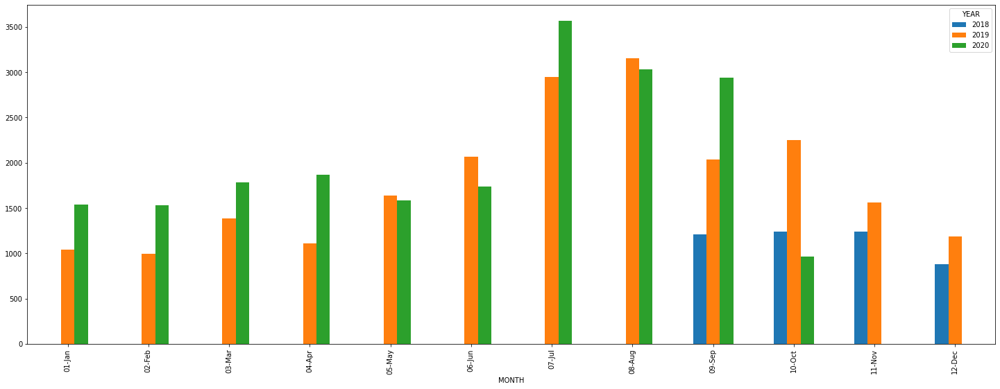

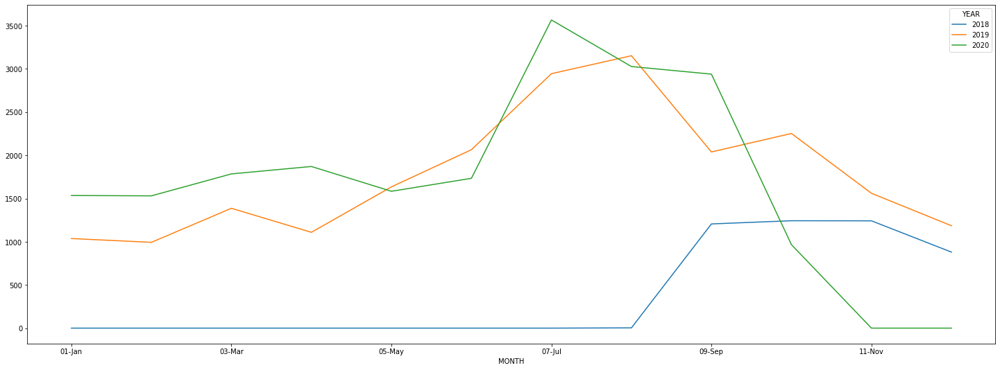

In [28]:
df.plot.bar(figsize=(25,9))
df.plot(figsize=(25,9))
plt.show()

- Η παρακάτω γραφική παράσταση απεικονίζει την κατανομή `Ποσοτικής Πώλησης` στο σύνολο του δείγματος
 <details>
<summary>Step Details <font color='green'>(click me)</font></summary>
    
     * Ένα ιστόγραμμα είναι ένα κλασικό εργαλείο οπτικοποίησης που αντιπροσωπεύει την κατανομή μιας ή περισσότερων μεταβλητών μετρώντας τον αριθμό των παρατηρήσεων που εμπίπτουν σε ξεχωριστούς κάδους.

     * Αυτή η συνάρτηση μπορεί να ομαλοποιήσει το στατιστικό στοιχείο που υπολογίζεται μέσα σε κάθε κάδο για να εκτιμήσει τη συχνότητα, την πυκνότητα ή τη μάζα πιθανότητας και μπορεί να προσθέσει μια ομαλή καμπύλη που λαμβάνεται χρησιμοποιώντας μια εκτίμηση πυκνότητας πυρήνα, παρόμοια με το kdeplot ().

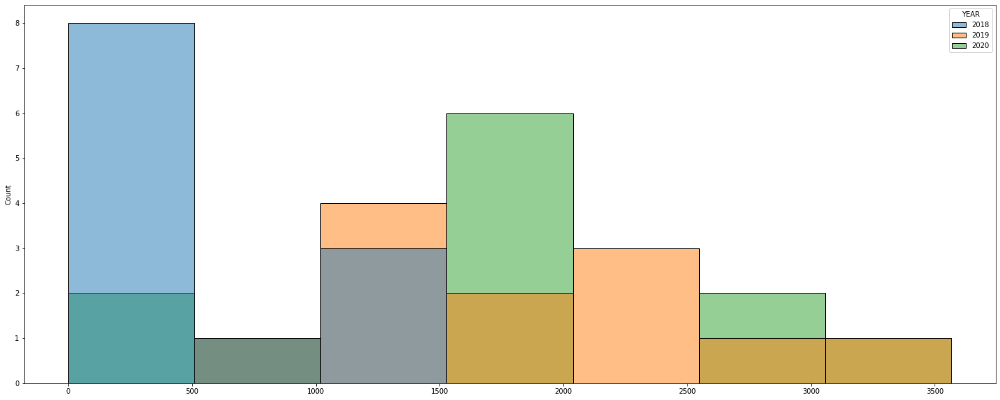

In [29]:
ax = plt.subplots(figsize=(25,10))
sns.histplot(df)
plt.show()

- Η παρακάτω γραφική παράσταση απεικονίζει την `ΣΥΝΟΛΙΚΗ ΠΟΣΟΤΗΤΑ ΠΩΛΗΣΕΩΝ / ΕΤΟΣ` (αφορά μόνο τις ημέρες που έχουμε το ψωμί προσφορά)

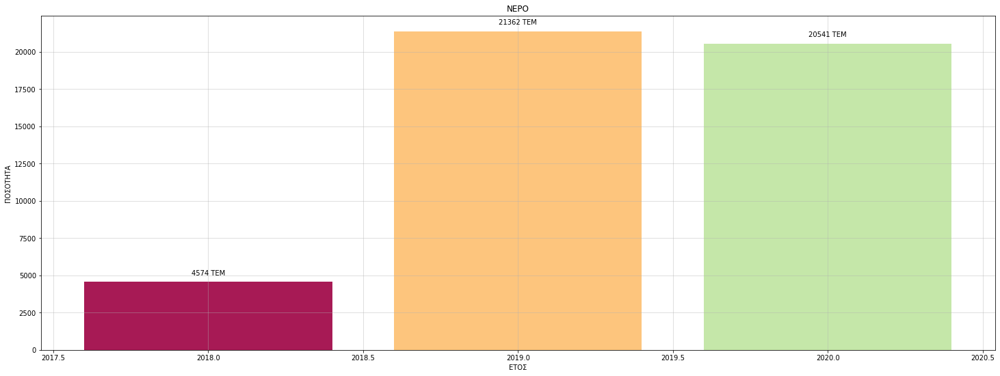

In [30]:
df_g = selinari_pricelist.groupby('YEAR').sum().reset_index()
X = df_g.YEAR
y = df_g.QUANTITY
plt.figure(figsize=(25, 9))
plt.subplot(xlabel='ΕΤΟΣ', ylabel='ΠΟΣΟΤΗΤΑ', title='ΝΕΡΟ')
colors = [plt.cm.Spectral(i / float(len(X))) for i in range(len(X))]
plt.bar(X, y, alpha=0.9, color=colors)
for a, b in zip(X, y):
    label = "{:.0f} ΤΕΜ".format(b)

    # this method is called for each point
    plt.annotate(label,  # this is the text
                 (a, b),  # this is the point to label
                 textcoords="offset points",  # how to position the text
                 xytext=(0, 10),  # distance from text to points (x,y)
                 ha='center')  # horizontal alignment can be left, right or center
plt.grid(True, alpha=0.5)
plt.show()

In [31]:
df['ΣΥΝΟΛΑ'] = df.sum(axis=1)
df.loc['TOTAL'] = df.sum(axis=0)
print('ΠΟΣΟΤΙΚΕΣ ΠΩΛΗΣΕΙΣ ΤΙΜΟΚΑΤΑΛΟΓΟΥ: ΝΕΡΟ ΕΞΑΔΑ ΣΕΛΗΝΑΡΙ (ΤΕΤΑΡΤΗ - ΠΕΜΠΤΗ)')
df

ΠΟΣΟΤΙΚΕΣ ΠΩΛΗΣΕΙΣ ΤΙΜΟΚΑΤΑΛΟΓΟΥ: ΝΕΡΟ ΕΞΑΔΑ ΣΕΛΗΝΑΡΙ (ΤΕΤΑΡΤΗ - ΠΕΜΠΤΗ)


YEAR,2018,2019,2020,ΣΥΝΟΛΑ
MONTH,,,,
01-Jan,0.0,1037.0,1535.0,2572.0
02-Feb,0.0,993.0,1531.0,2524.0
03-Mar,0.0,1387.0,1785.0,3172.0
04-Apr,0.0,1109.0,1871.0,2980.0
05-May,0.0,1635.0,1584.0,3219.0
06-Jun,0.0,2065.0,1734.0,3799.0
07-Jul,0.0,2945.0,3567.0,6512.0
08-Aug,3.0,3153.0,3028.0,6184.0
09-Sep,1206.0,2039.0,2940.0,6185.0


## <center> ΓΑΛΑ </center>
- Ανάθεση του μοναδικού κωδικού στην μεταβλητή `code`

In [32]:
code = ('5201037500128','5201037500289')

- Εύρεση και Γένεση Ημερομηνιών από `01-01-2017 έως και σήμερα`
- Eπιλογή βάσει φίλτρων δλδ. η ημέρα να είναι `ΠΑΡΑΣΚΕΥΗ ή ΣΑΒΒΑΤΟ ή ΚΥΡΙΑΚΗ`
- Δημιουργία Λίστας `list` με τις σωστές ημερομηνίες

In [33]:
today = datetime.now()
dates = pd.date_range('2017-01-01', today)
dates = dates[(dates.strftime('%a') == 'Fri') | (dates.strftime('%a') == 'Sat') | (dates.strftime('%a') == 'Sun')]
special_date = []
for date in dates:
    date = date.strftime('%Y-%m-%d')
    special_date.append(date)

- Η λίστα με τις ημερομηνίες δεν μπορούν να διαβαστούν από την Βάση Δεδομένων, έτσι θα χρειαστεί να την μετατρέψουμε σε `tuple`
- Αποθηκεύουμε τα αποτελέσματα της αναζήτησης στην Βάση μας σε μια `DataFrame` μεταβλητή
- Δημιουργούμε ένα `pivot table`
- Εμφανίζουμε τα αποτελέσματα

In [34]:
delta_pricelist= pd.read_sql_query(sql.sales_from_pricelist(tuple(special_date), code), sql_connect.connect())

In [35]:
df = delta_pricelist.pivot(index='MONTH', columns='YEAR', values='QUANTITY')
df = df.fillna(0)

- Στο παρακάτω γράφημα απεικονίζουμε την `ποσότητα πωλήσεων` για κάθε μήνα ξεχωριστά σε σχέση με τα έτη. 

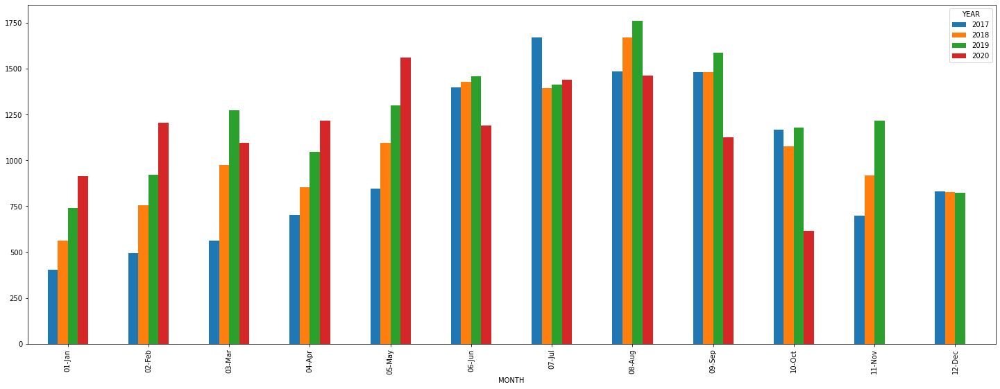

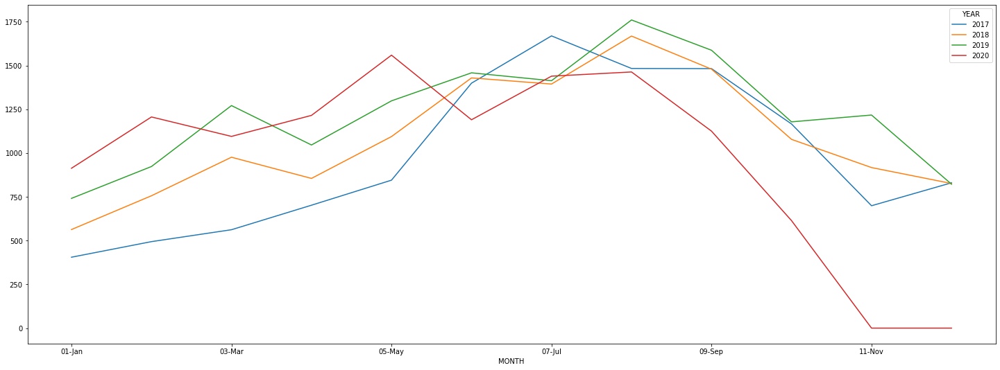

In [36]:
df.plot.bar(figsize=(25,9))
df.plot(figsize=(25,9))
plt.show()

- Η παρακάτω γραφική παράσταση απεικονίζει την κατανομή `Ποσοτικής Πώλησης` στο σύνολο του δείγματος
 <details>
<summary>Step Details <font color='green'>(click me)</font></summary>
    
     * Ένα ιστόγραμμα είναι ένα κλασικό εργαλείο οπτικοποίησης που αντιπροσωπεύει την κατανομή μιας ή περισσότερων μεταβλητών μετρώντας τον αριθμό των παρατηρήσεων που εμπίπτουν σε ξεχωριστούς κάδους.

     * Αυτή η συνάρτηση μπορεί να ομαλοποιήσει το στατιστικό στοιχείο που υπολογίζεται μέσα σε κάθε κάδο για να εκτιμήσει τη συχνότητα, την πυκνότητα ή τη μάζα πιθανότητας και μπορεί να προσθέσει μια ομαλή καμπύλη που λαμβάνεται χρησιμοποιώντας μια εκτίμηση πυκνότητας πυρήνα, παρόμοια με το kdeplot ().

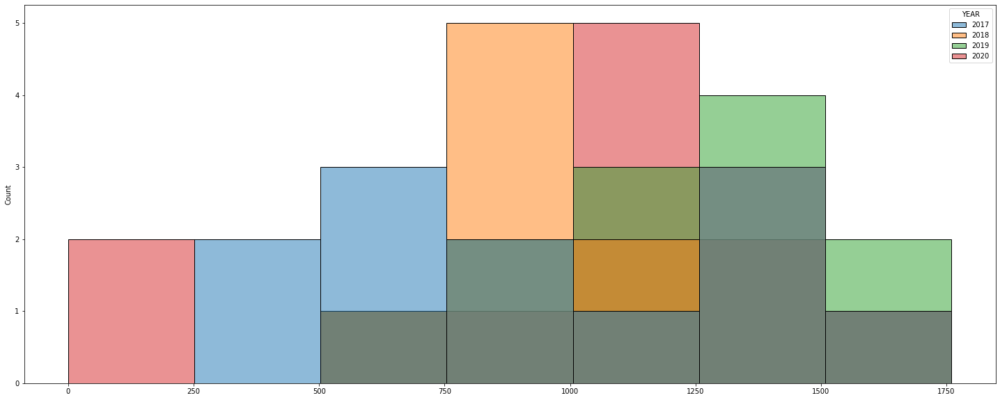

In [37]:
ax = plt.subplots(figsize=(25,10))
sns.histplot(df)
plt.show()

- Η παρακάτω γραφική παράσταση απεικονίζει την `ΣΥΝΟΛΙΚΗ ΠΟΣΟΤΗΤΑ ΠΩΛΗΣΕΩΝ / ΕΤΟΣ` (αφορά μόνο τις ημέρες που έχουμε το ψωμί προσφορά)

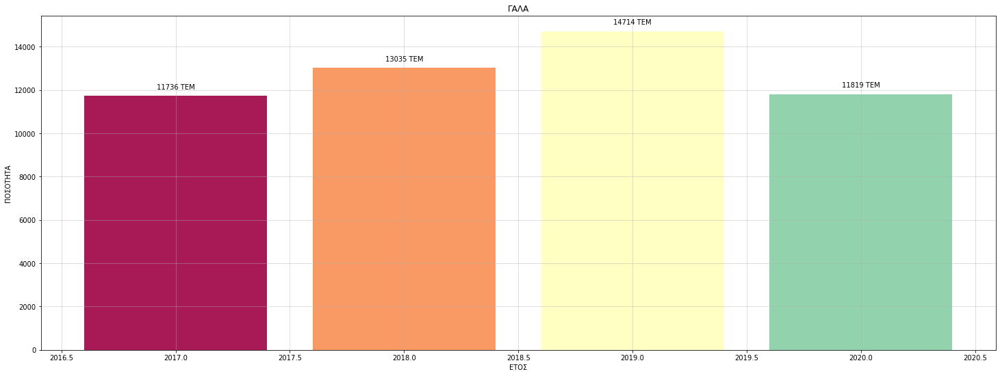

In [38]:
df_g = delta_pricelist.groupby('YEAR').sum().reset_index()
X = df_g.YEAR
y = df_g.QUANTITY
plt.figure(figsize=(25, 9))
plt.subplot(xlabel='ΕΤΟΣ', ylabel='ΠΟΣΟΤΗΤΑ', title='ΓΑΛΑ')
colors = [plt.cm.Spectral(i / float(len(X))) for i in range(len(X))]
plt.bar(X, y, alpha=0.9, color=colors)
for a, b in zip(X, y):
    label = "{:.0f} ΤΕΜ".format(b)

    # this method is called for each point
    plt.annotate(label,  # this is the text
                 (a, b),  # this is the point to label
                 textcoords="offset points",  # how to position the text
                 xytext=(0, 10),  # distance from text to points (x,y)
                 ha='center')  # horizontal alignment can be left, right or center
plt.grid(True, alpha=0.5)
plt.show()

In [39]:
df['ΣΥΝΟΛΑ'] = df.sum(axis=1)
df.loc['TOTAL'] = df.sum(axis=0)
print('ΠΟΣΟΤΙΚΕΣ ΠΩΛΗΣΕΙΣ ΤΙΜΟΚΑΤΑΛΟΓΟΥ: ΦΡΕΣΚΟ ΓΑΛΑ ΔΕΛΤΑ (ΠΑΡΑΣΚΕΥΗ - ΣΑΒΒΑΤΟ - ΚΥΡΙΑΚΗ)')
df

ΠΟΣΟΤΙΚΕΣ ΠΩΛΗΣΕΙΣ ΤΙΜΟΚΑΤΑΛΟΓΟΥ: ΦΡΕΣΚΟ ΓΑΛΑ ΔΕΛΤΑ (ΠΑΡΑΣΚΕΥΗ - ΣΑΒΒΑΤΟ - ΚΥΡΙΑΚΗ)


YEAR,2017,2018,2019,2020,ΣΥΝΟΛΑ
MONTH,,,,,
01-Jan,405.0,563.0,741.0,913.0,2622.0
02-Feb,494.0,756.0,923.0,1206.0,3379.0
03-Mar,562.0,976.0,1271.0,1095.0,3904.0
04-Apr,702.0,855.0,1046.0,1215.0,3818.0
05-May,845.0,1094.0,1298.0,1559.0,4796.0
06-Jun,1399.0,1429.0,1458.0,1190.0,5476.0
07-Jul,1669.0,1394.0,1413.0,1439.0,5915.0
08-Aug,1483.0,1668.0,1760.0,1463.0,6374.0
09-Sep,1482.0,1479.0,1587.0,1125.0,5673.0


<center><img src=https://techcommunity.microsoft.com/t5/image/serverpage/image-id/169409iD7A64C5EAEA1C2C8/image-size/large?v=1.0&px=999></center>

# <center> ΤΑΚΤΙΚΕΣ ΠΡΟΣΦΟΡΕΣ </center>
- Εισάγουμε μια νέα Βιβλιοθήκη μέσα στην οποία έχουμε δημιουργήσει τους τιμοκαταλόγους

In [40]:
from A_DAILY_ΠΟΡΕΙΑ_ΤΙΜΟΚΑΤΑΛΟΓΟΥ_ΠΩΛΗΣΕΩΝ.library import timokatalogos, sql_select
from A_DAILY_ΠΟΡΕΙΑ_ΤΙΜΟΚΑΤΑΛΟΓΟΥ_ΠΩΛΗΣΕΩΝ.library import plot as plot_tim

1 Αφορά: Β Δεκαπενθήμερο Προσφορών Ιανουαρίου
2 Αφορά: Σοκολάτες που Λήγουν
3 Αφορά: Β Δεκαπενθήμερο Προσφορών Φεβρουαρίου
4 Αφορά: Πασχαλινό Αυγό
5 Αφορά: Καθαρή Δευτέρα "Θαλασσινά"
6 Αφορά: Προϊόντα που Λήγουν
7 Αφορά: Α Δεκαπενθήμερο Προσφορών Μαρτίου
8 Αφορά: Α Δεκαπενθήμερο Προσφορών Απριλίου
9 Αφορά: Φυτίνη και Αλεύρι
10 Αφορά: Α Δεκαπενθήμερο Προσφορών Μαϊου
11 Αφορά: Nuvoleta Υγρά Πλυντηρίου
12 Αφορά: B Δεκαπενθήμερο Προσφορών Μαϊου
13 Αφορά: Α Δεκαπενθήμερο Προσφορών Ιουνίου & Eπέκταση (Nivea - PizBuin)
14 Αφορά: B Δεκαπενθήμερο Προσφορών Ιουνίου & Επέκταση (Nivea - PizBuin - Royal Dutch - Παπαγάλος)
15 Αφορά: Α Δεκαπενθήμερο Προσφορών Ιουλίου & Eπέκταση (Nivea - PizBuin - Nutella - Lays - Παπαγάλος)
16 Αφορά: Eπέκταση (Nivea (1+1) - Παπαγάλος - Nutella - Μαναβική)
17 Αφορά: 1+1 ΔΩΡΑ
18 ΕΠΕΚΤΑΣΗ: 1+1 ΔΩΡΑ


,BRAND,SalesQuantity,Turnover
0,Quaker,6.0,10.40
1,Gliss,12.0,19.32
2,Zewa,24.0,66.96
3,Fairy,51.0,77.37
4,Neomat,34.0,115.52


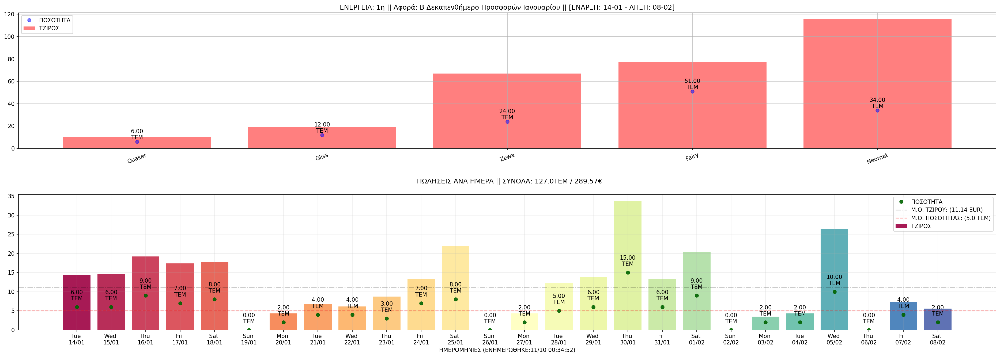

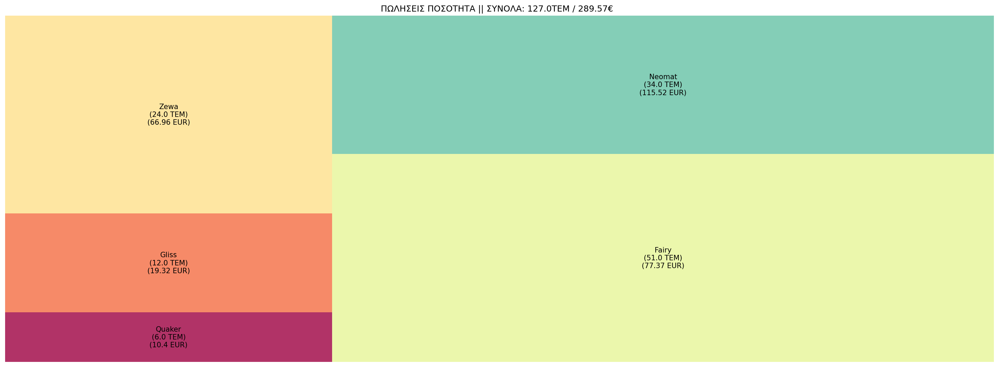

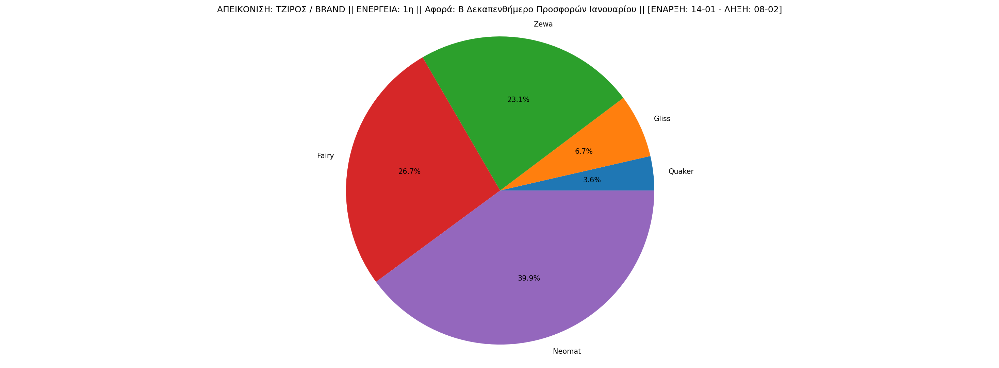

,BRAND,SalesQuantity,Turnover
0,Nestle,29.0,26.44


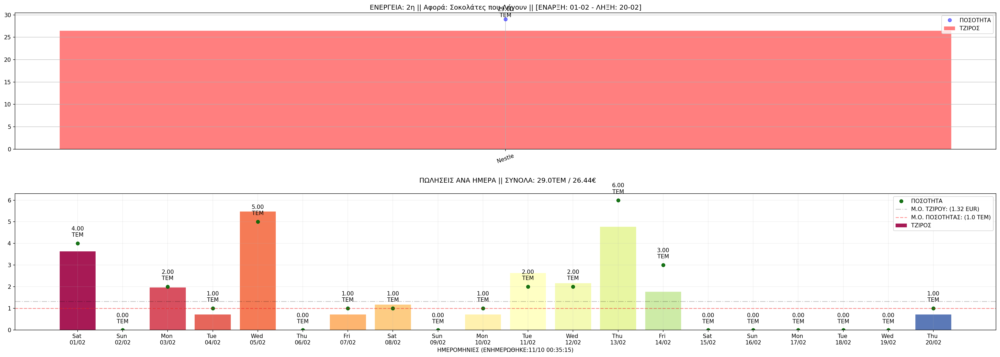

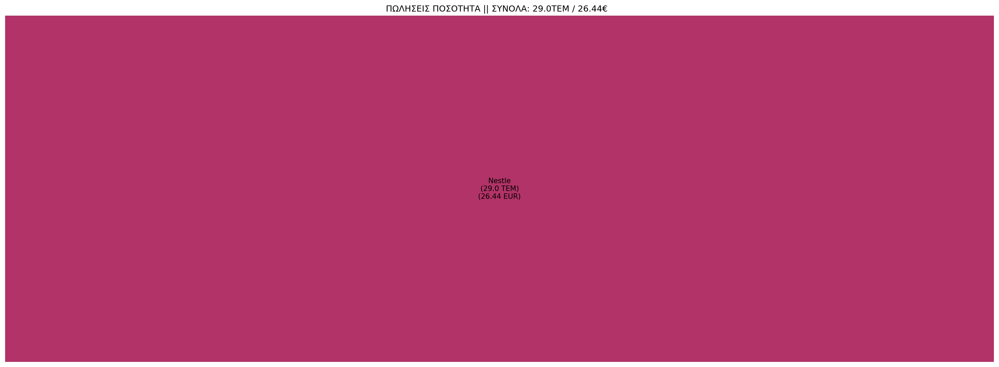

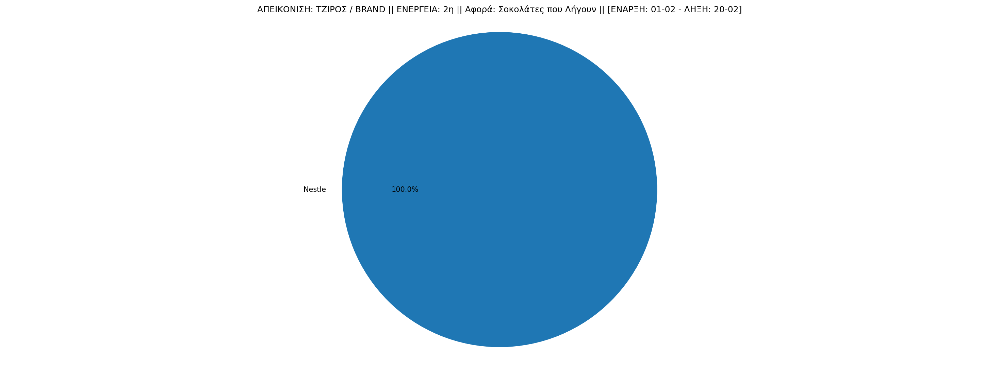

,BRAND,SalesQuantity,Turnover
0,Essex,13.0,34.84
1,Palmolive,35.0,36.06
2,Selpak,41.0,45.58
3,Soft,7.0,47.04
4,Soupline,19.0,51.77


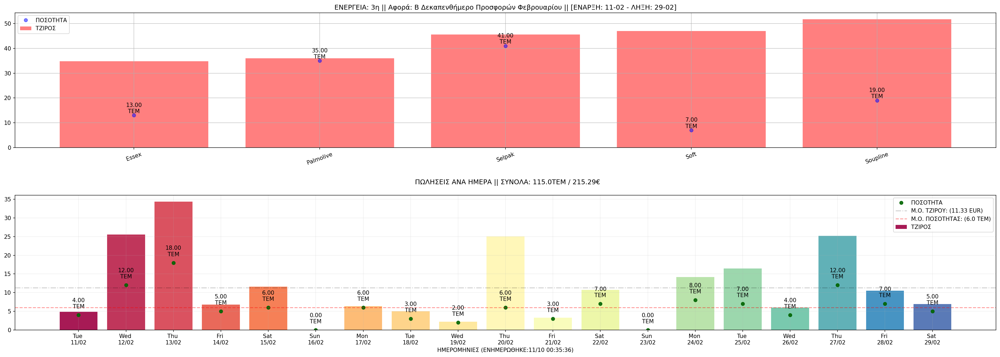

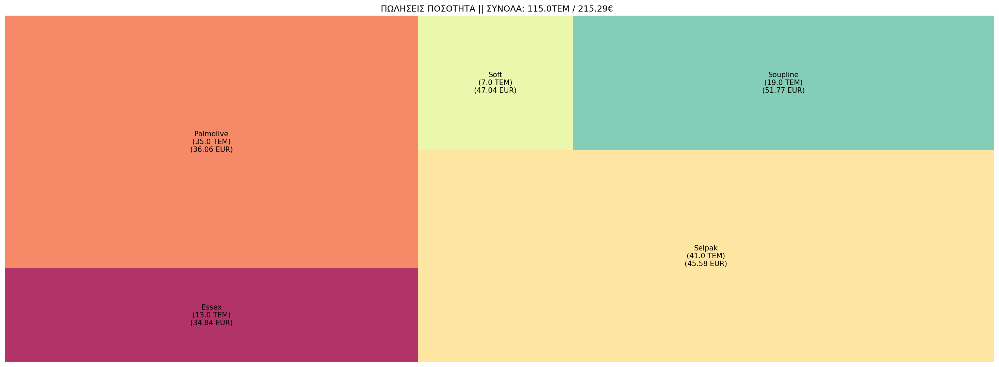

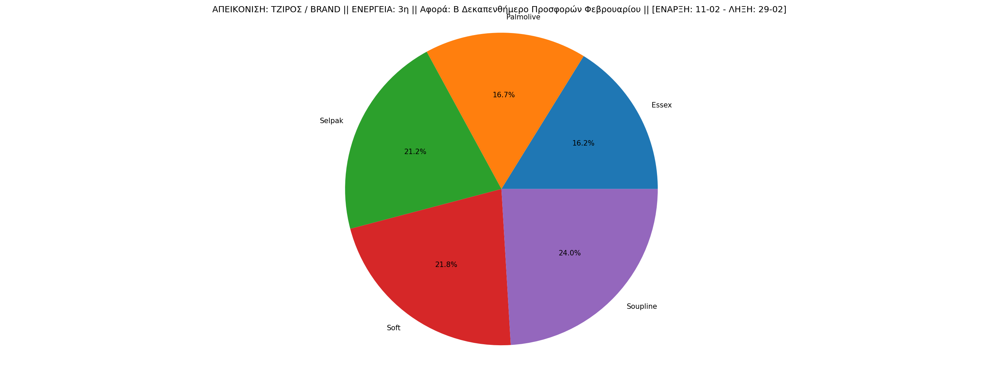

,BRAND,SalesQuantity,Turnover
0,Astir,87.0,52.19
1,Kinder,30.0,54.24


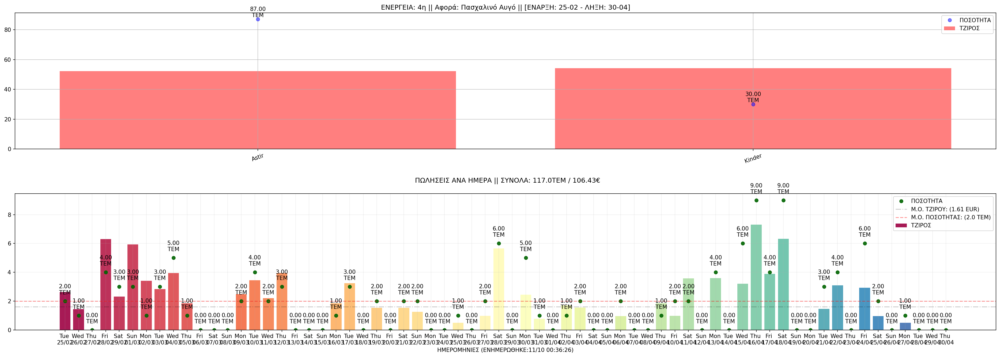

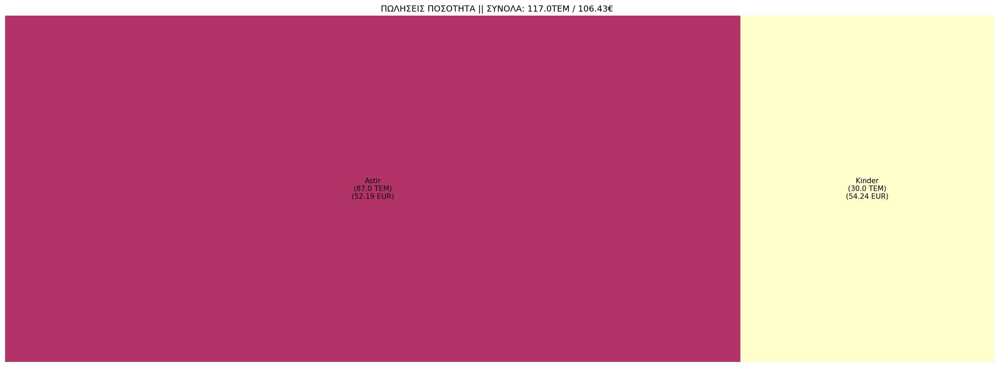

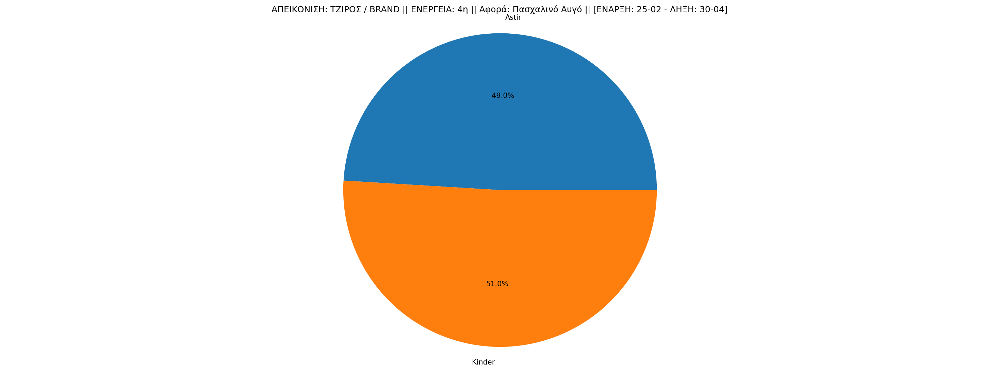

,BRAND,SalesQuantity,Turnover
0,Κόκκαλης,35.215,246.16


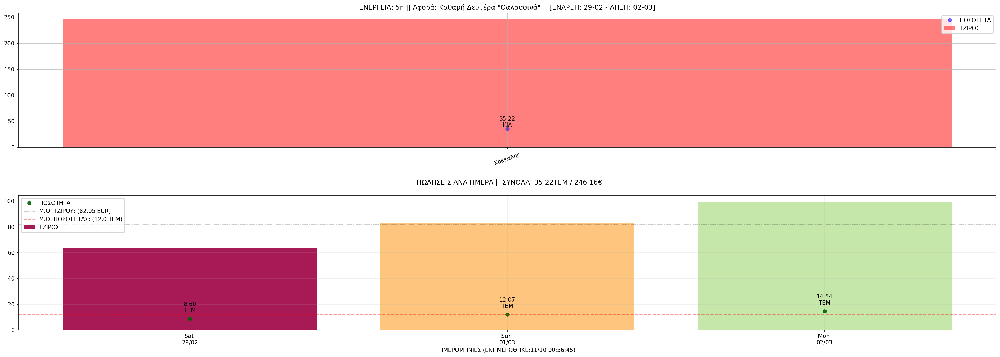

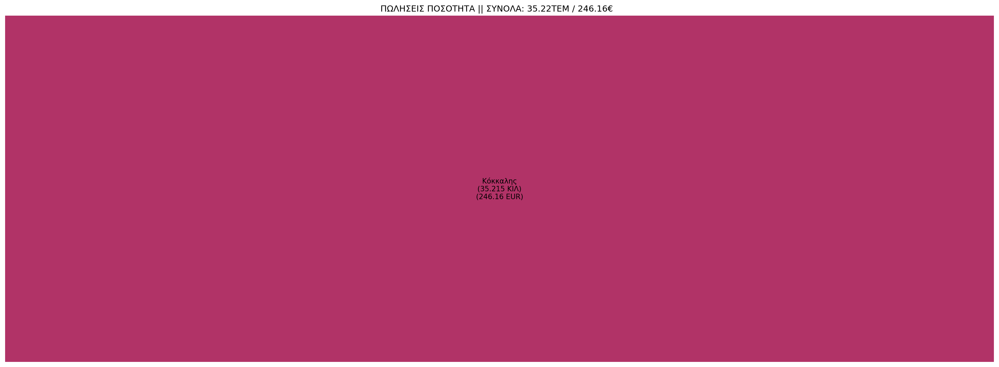

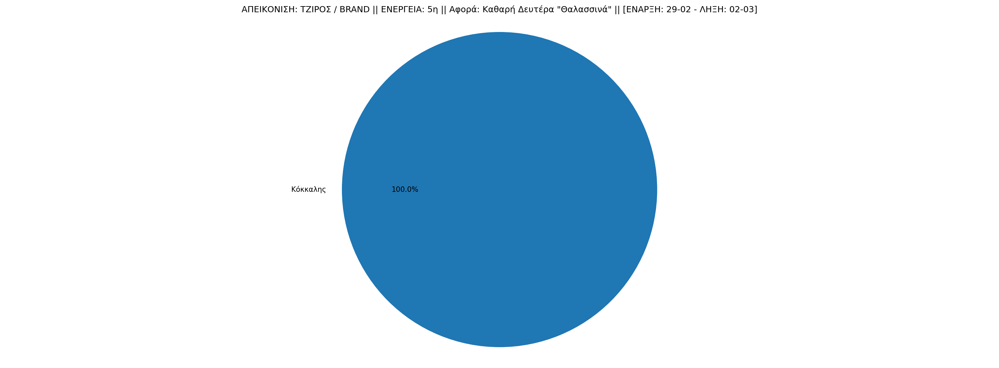

,BRAND,SalesQuantity,Turnover
0,Toblerone,7.0,6.09
1,Nescafe,40.0,62.07


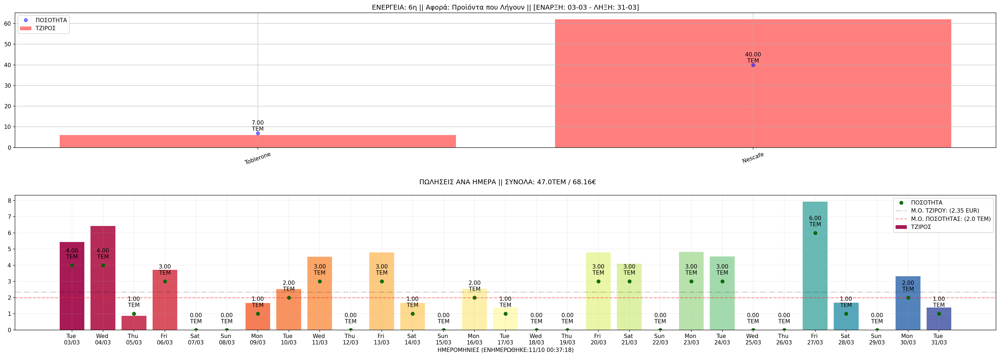

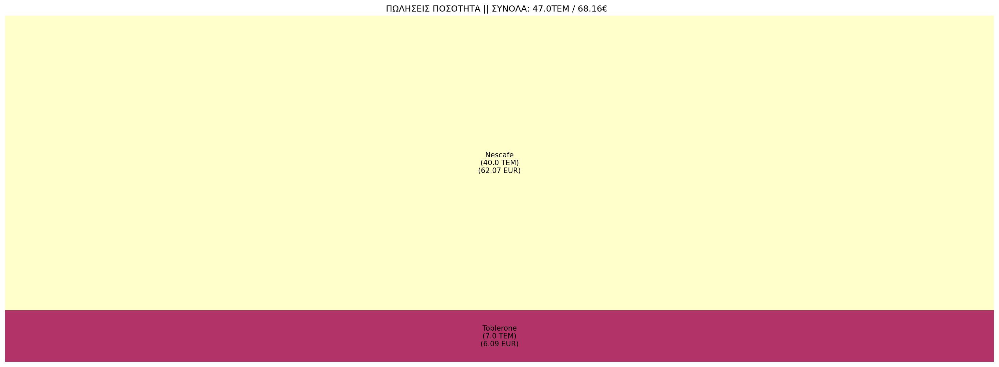

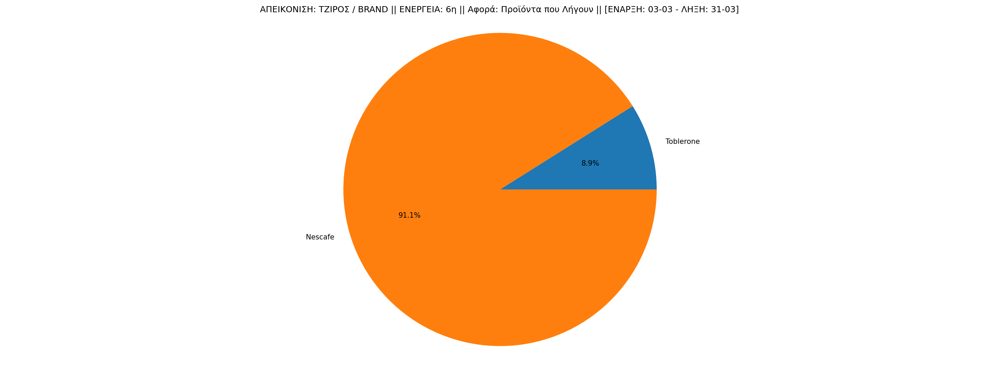

,BRAND,SalesQuantity,Turnover
0,Azax,9.0,12.28
1,Bazaar,15.0,18.42
2,Neomat,6.0,21.66
3,Softex,28.0,62.68
4,Soupline,19.0,73.35
5,Everyday,46.0,76.28


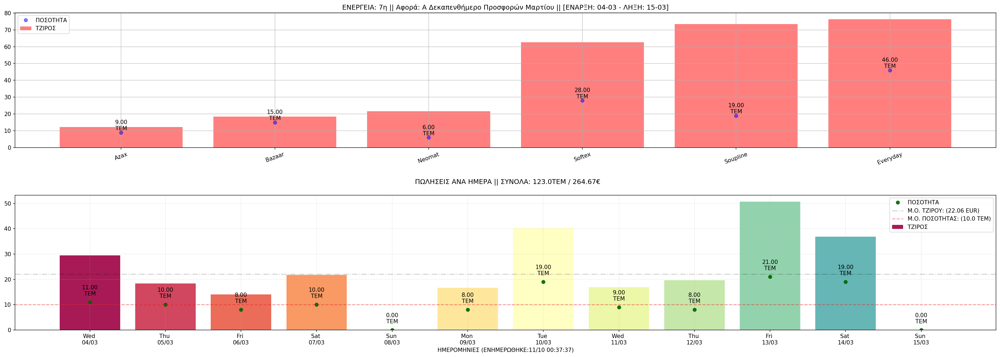

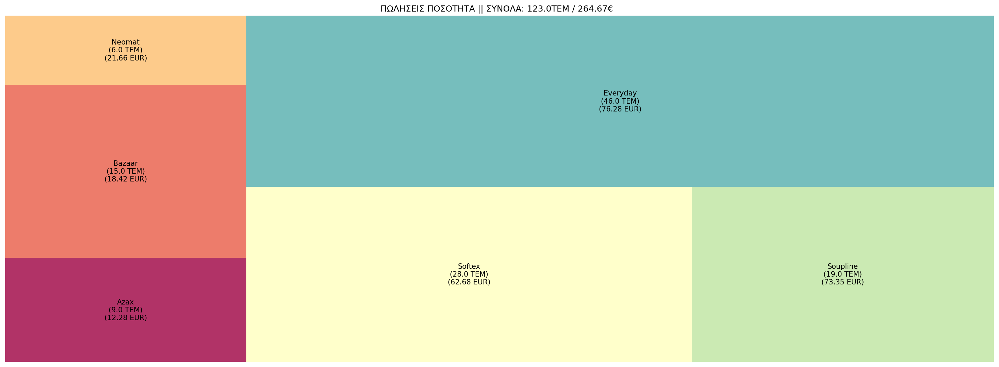

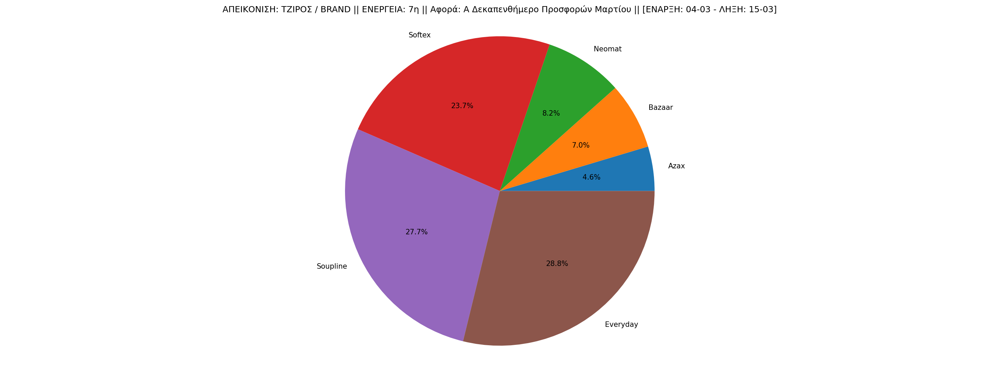

,BRAND,SalesQuantity,Turnover
0,Azax,19.0,28.42
1,Skip,6.0,31.82
2,Soupline,22.0,43.79
3,Ariel,18.0,72.25
4,Selpak,42.0,82.94


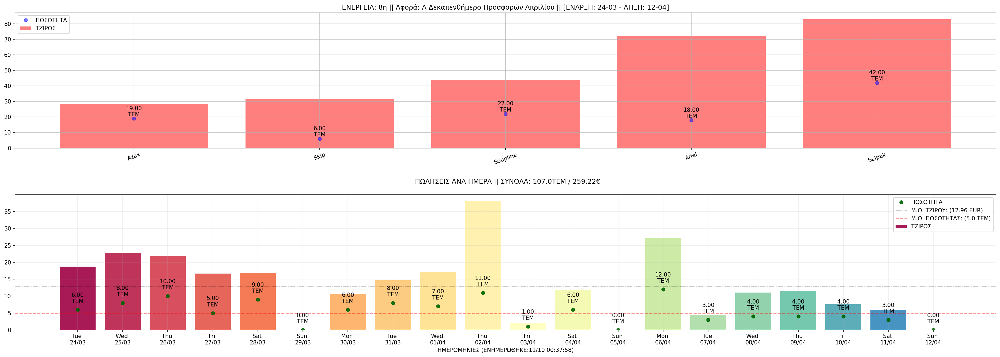

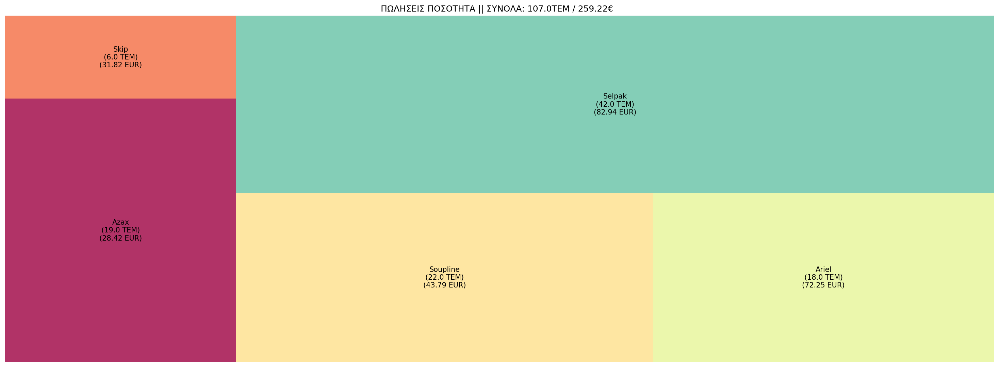

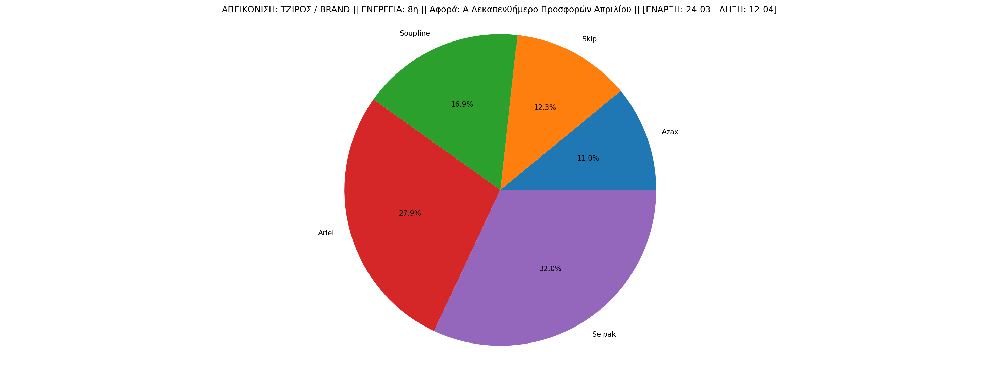

,BRAND,SalesQuantity,Turnover
0,Μύλοι Αγ. Γεωργίου,49.0,107.75
1,Φυτίνη,89.0,210.77
2,Αλλατίνη,119.0,282.15


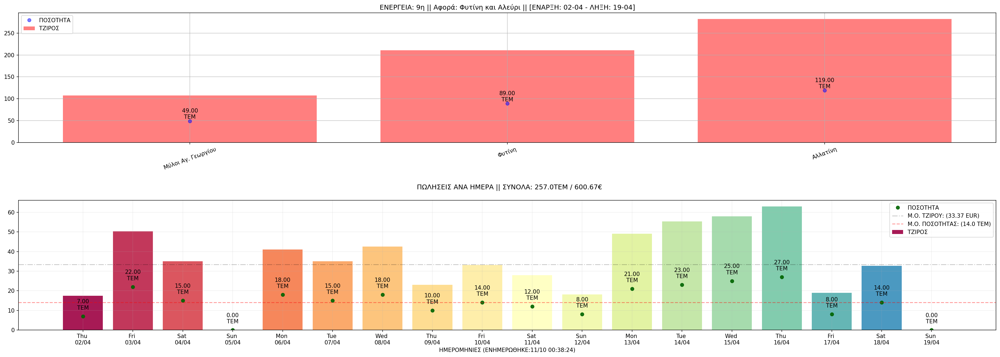

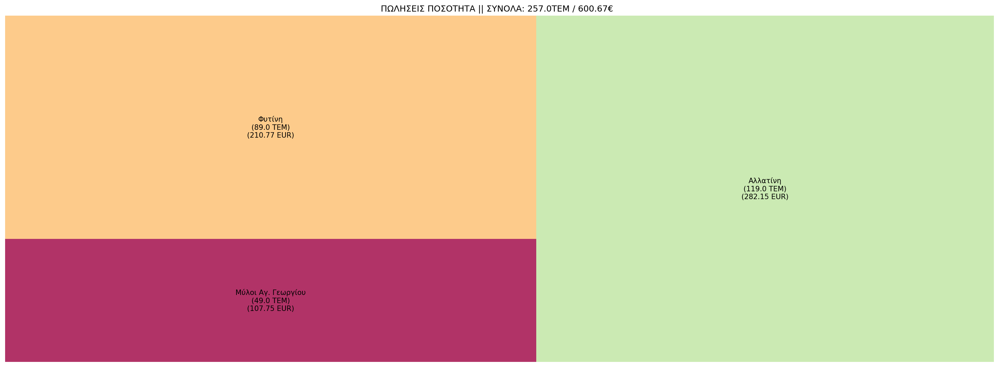

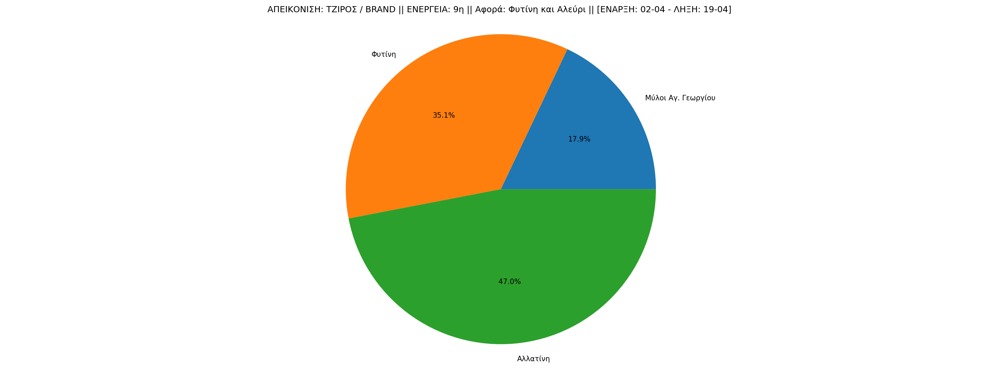

,BRAND,SalesQuantity,Turnover
0,Lenor,2.0,10.92
1,Klinex,5.0,24.11
2,Selpak,48.0,52.80
3,Kelloggs,36.0,56.91
4,Ava,89.0,68.20
5,Soupline,20.0,76.23
6,Neomat,24.0,86.64


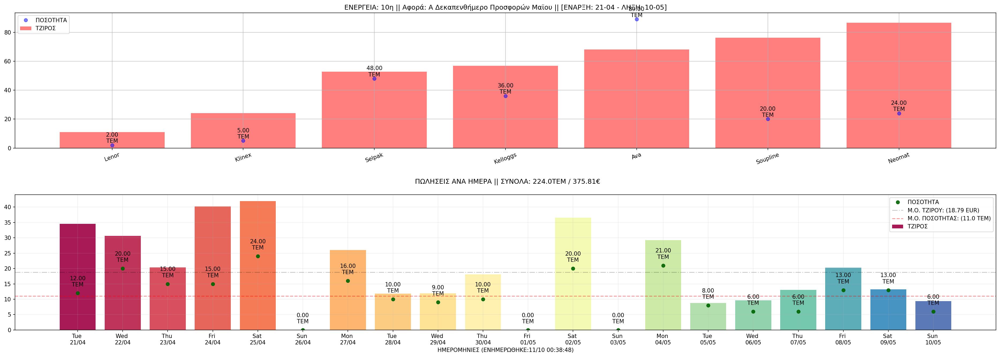

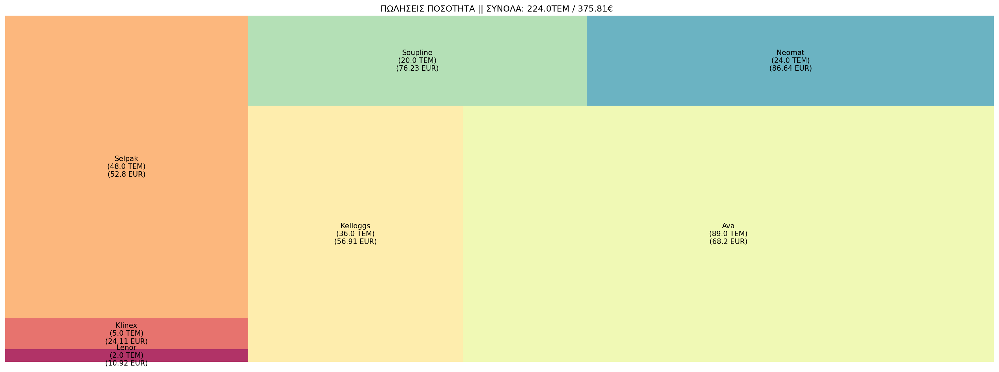

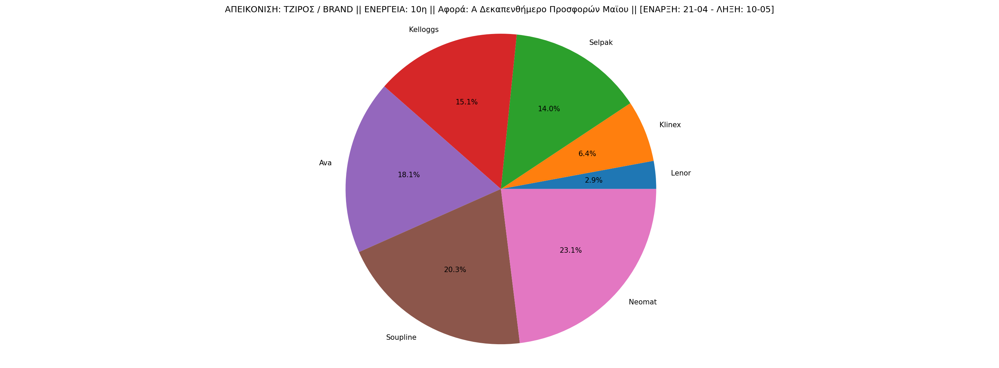

,BRAND,SalesQuantity,Turnover
0,Nuvoletta,4.0,8.59


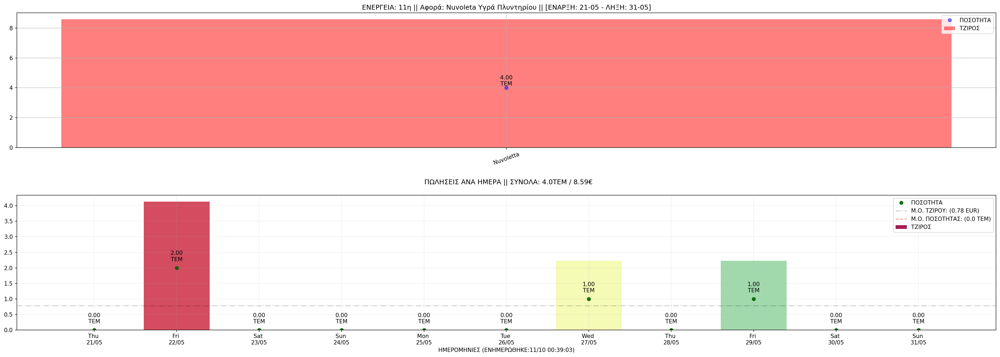

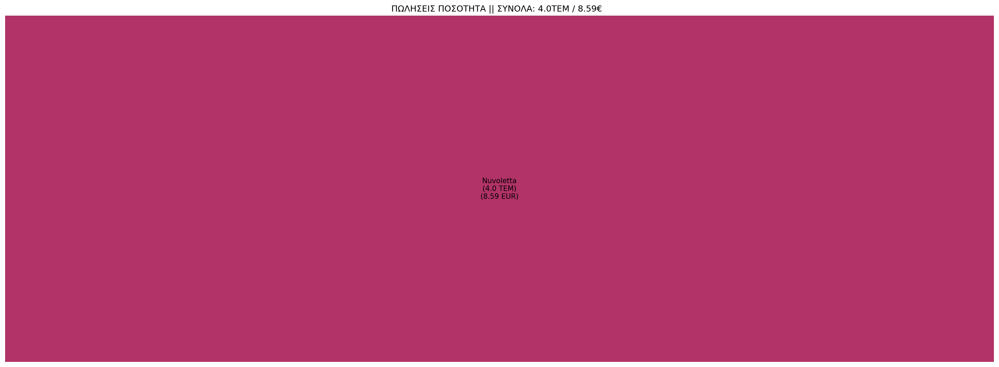

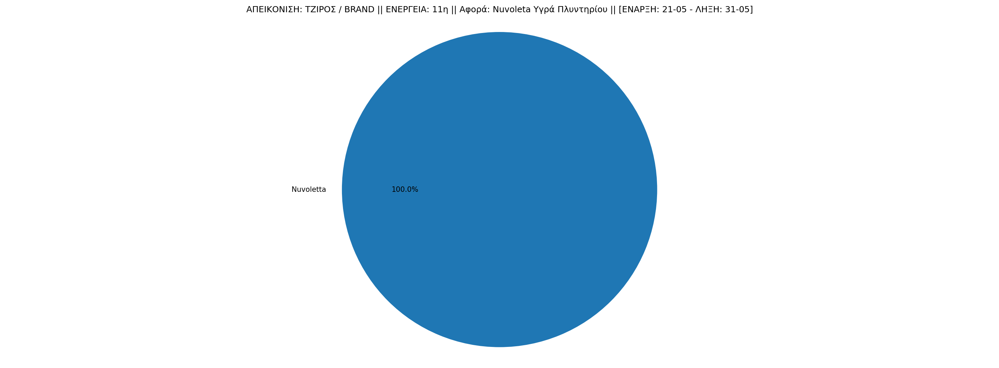

,BRAND,SalesQuantity,Turnover
0,Alberto,8.0,17.84
1,Bazaar,29.0,25.24
2,Zewa,18.0,49.83
3,Fitness,25.0,53.00
4,Ariel,8.0,58.97
5,Everyday,64.0,106.36
6,Dixan,25.0,124.16
7,PizBuin,15.0,125.87
8,Nivea,36.0,302.87


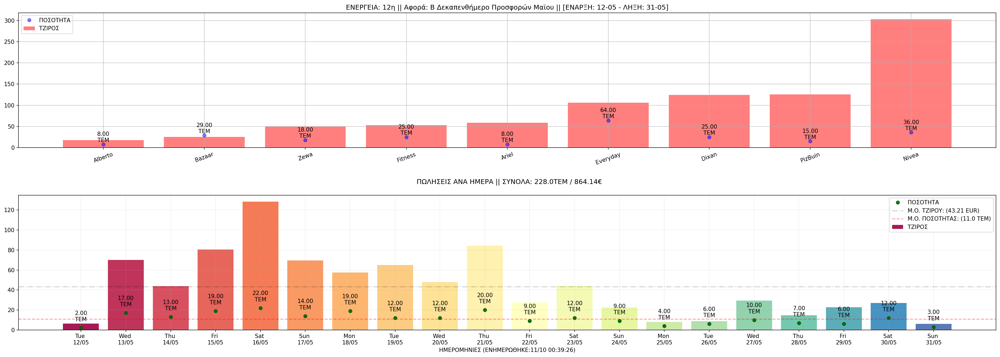

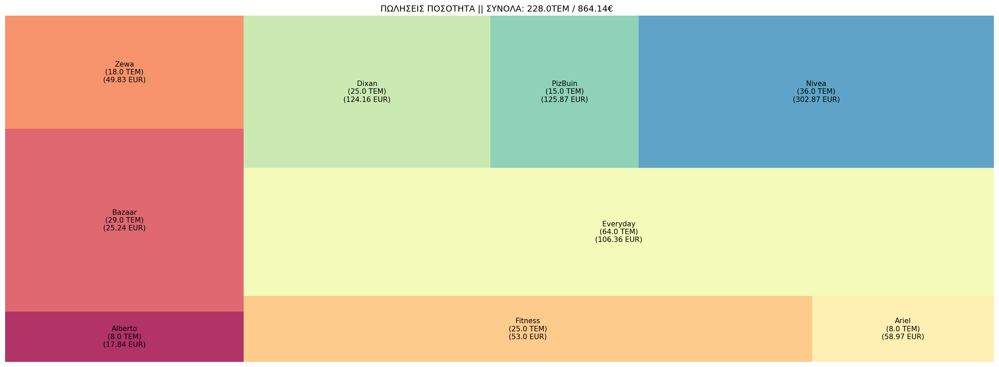

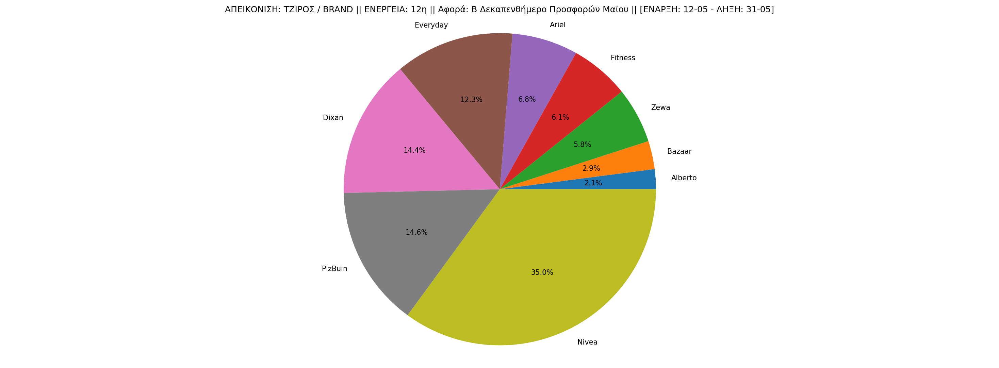

,BRAND,SalesQuantity,Turnover
0,Pantene,8.0,13.36
1,PizBuin,2.0,16.94
2,Nuvoletta,8.0,17.84
3,Ultrex,10.0,24.60
4,Palmolive,13.0,25.06
5,Softex,12.0,27.01
6,Azax,22.0,31.24
7,Papadopoulou,44.0,58.76
8,Royal Dutch,148.0,69.78
9,Skip,24.0,91.42


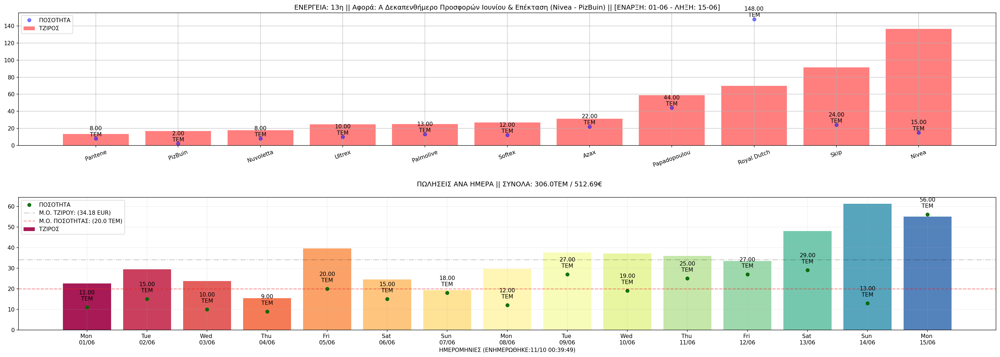

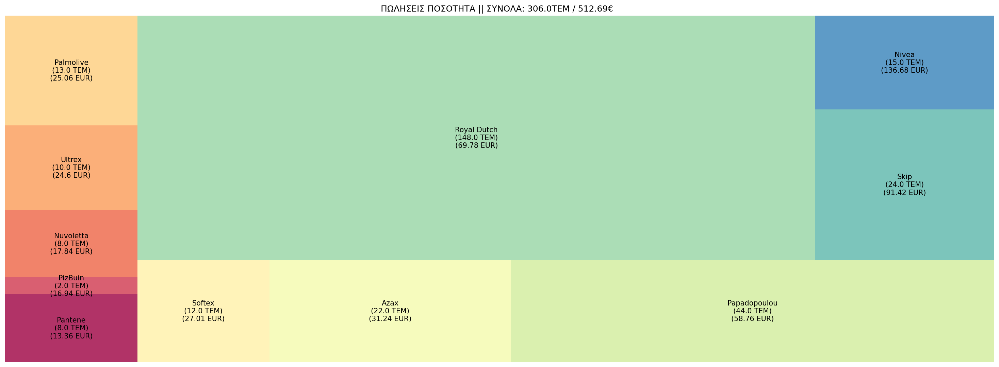

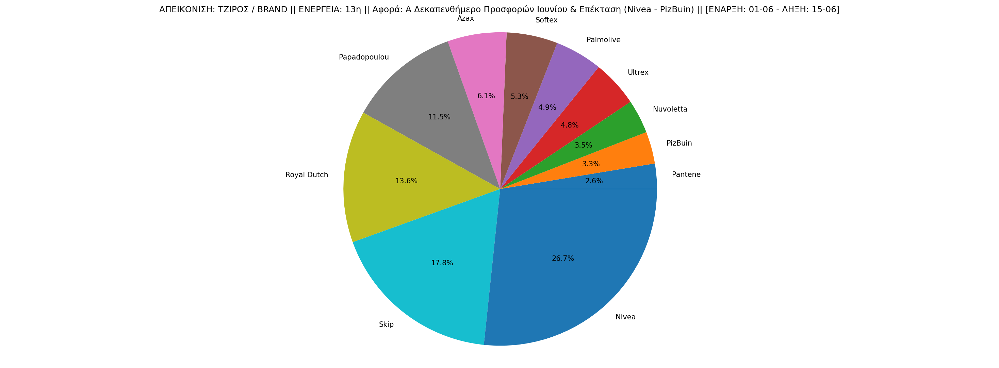

,BRAND,SalesQuantity,Turnover
0,Kelloggs,4.0,7.64
1,Παπαγάλος,7.0,14.21
2,Bazaar,19.0,17.67
3,Ava,27.0,18.22
4,Farmer,16.0,22.08
5,Selpak,22.0,42.57
6,Neomat,10.0,44.42
7,Pantene,21.0,46.80
8,Dixan,11.0,49.39
9,PizBuin,7.0,56.01


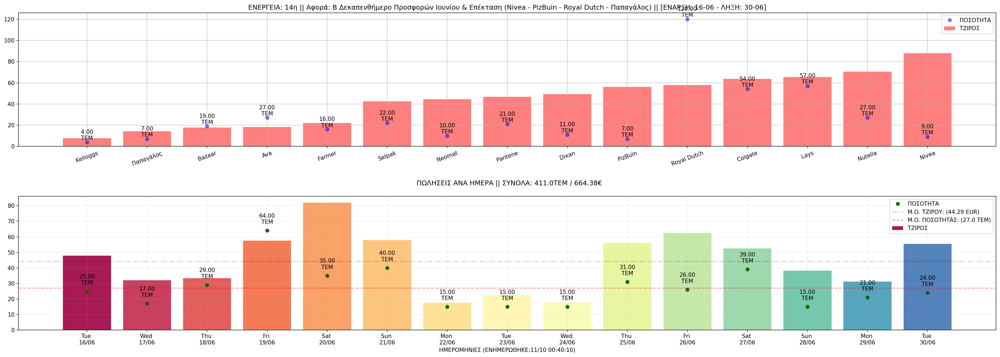

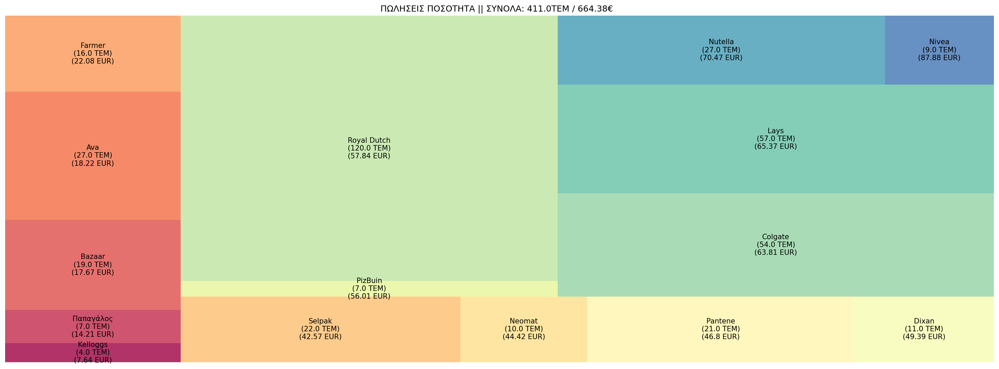

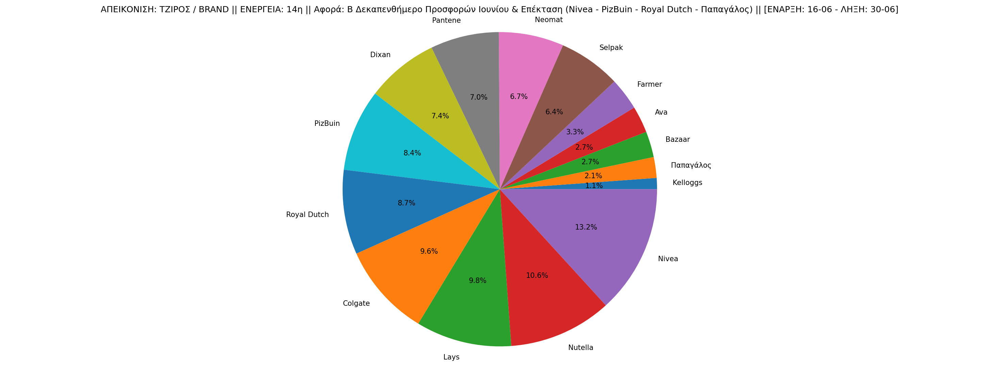

,BRAND,SalesQuantity,Turnover
0,Ηλιος,7.000,8.38
1,Fitness,8.000,19.05
2,Zewa,9.000,25.11
3,Elite,28.000,33.87
4,Ροδάκινο,53.435,39.27
5,Fairy,52.000,39.59
6,Soft,6.000,40.12
7,Dove,17.000,57.51
8,Lays,57.000,65.19
9,Παπαγάλος,40.000,67.60


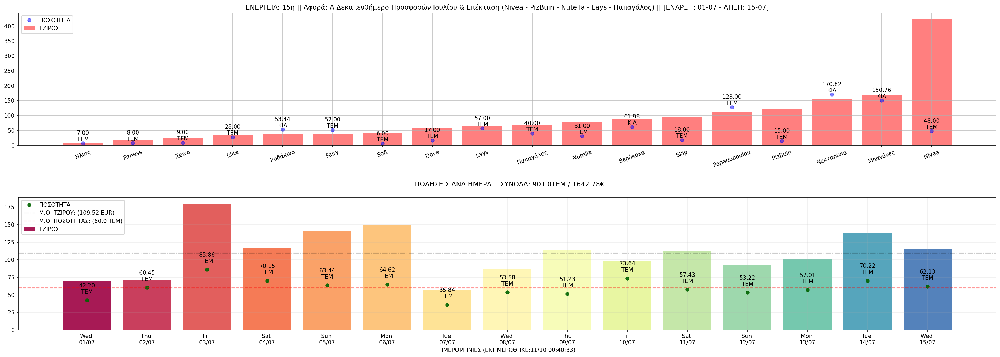

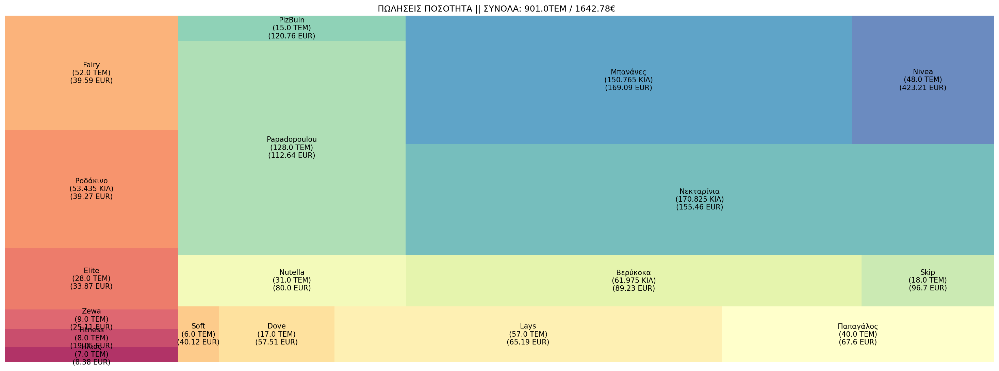

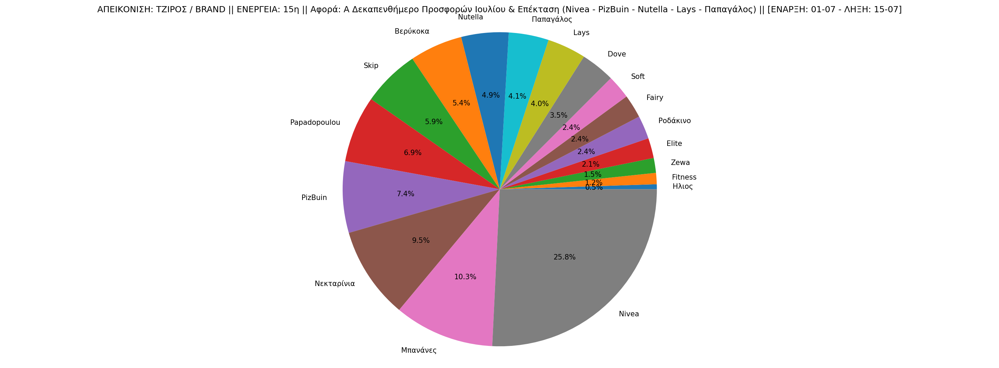

,BRAND,SalesQuantity,Turnover
0,Nivea,4.0,14.34
1,Παπαγάλος,19.0,31.02
2,Nutella,57.0,149.51


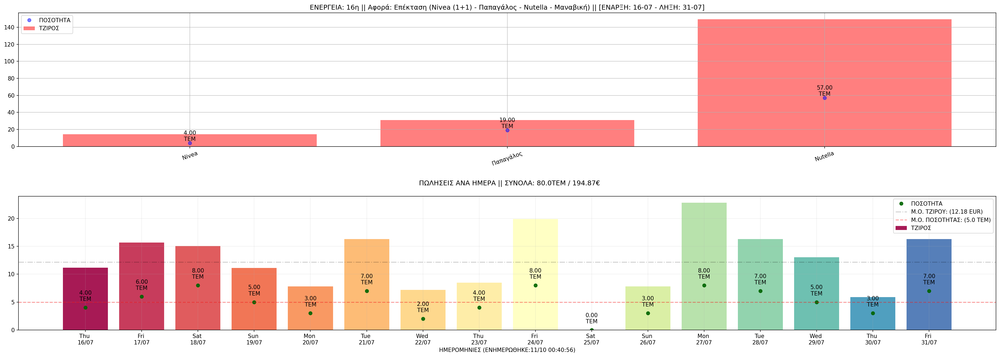

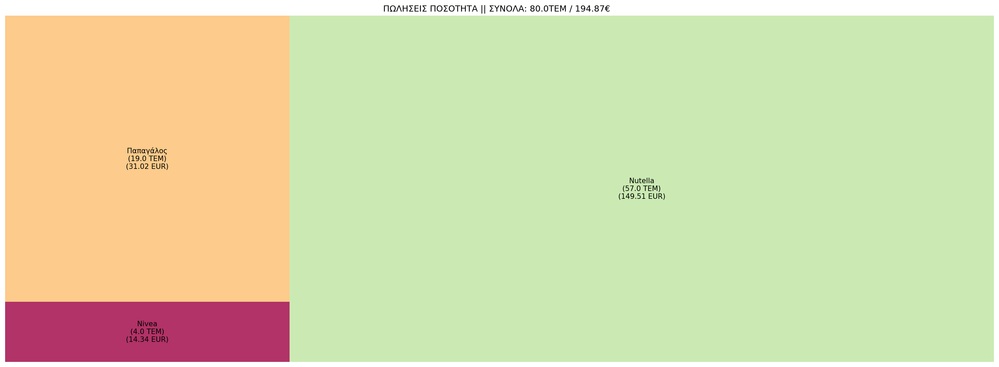

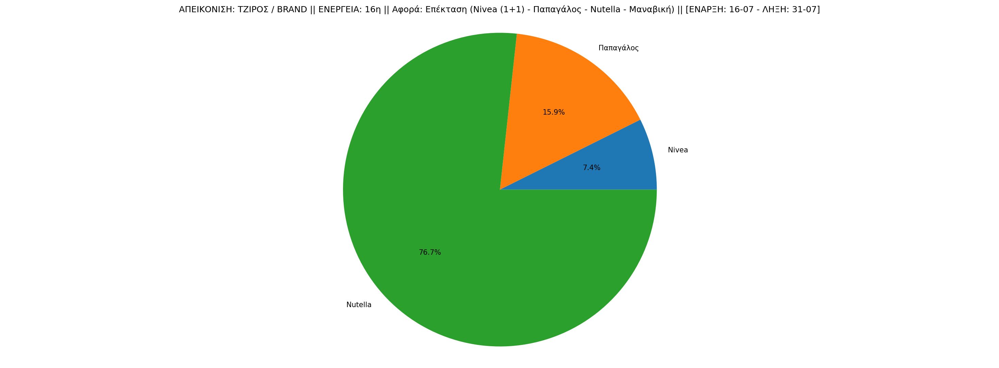

,BRAND,SalesQuantity,Turnover
0,Servin,18.0,12.73
1,Peppa Pig,12.0,16.12
2,7up,50.0,46.94
3,Minios,35.0,47.00
4,Pepsi,160.0,153.96


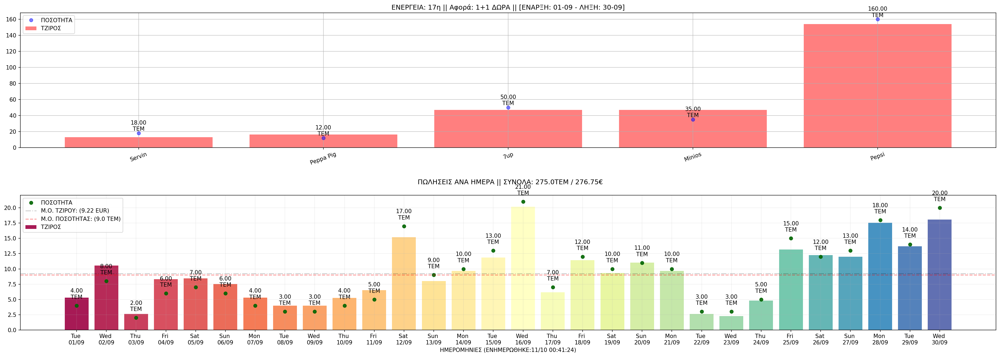

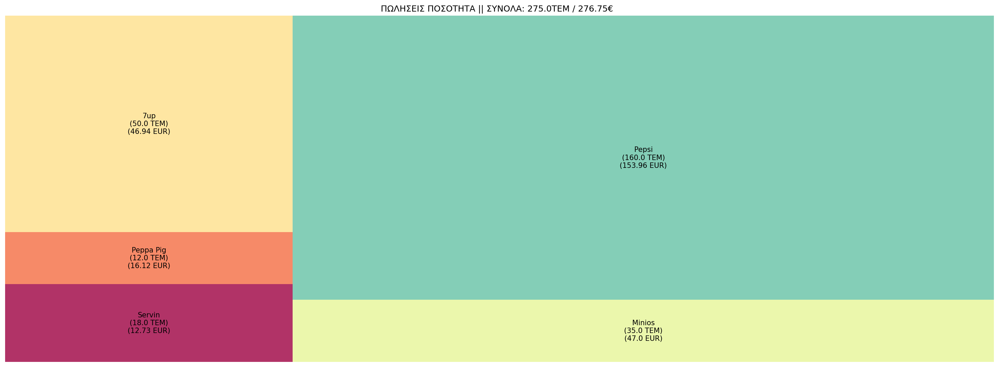

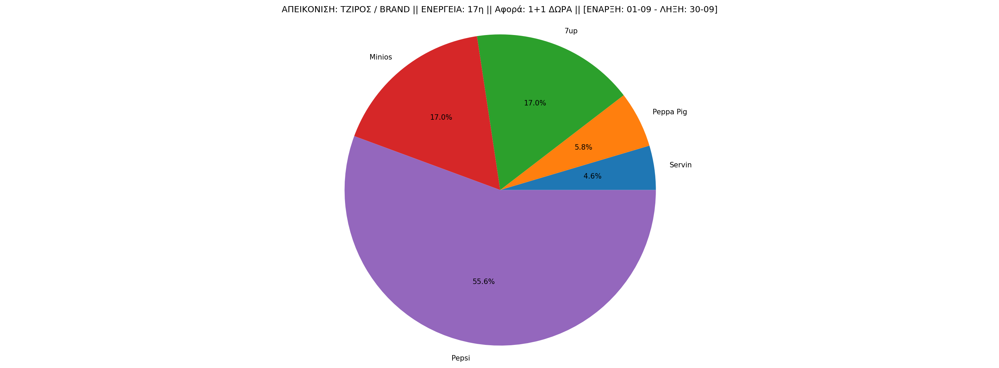

,BRAND,SalesQuantity,Turnover
0,Peppa Pig,1.0,1.31
1,Servin,12.0,8.07
2,Minios,9.0,11.75
3,7up,34.0,29.91
4,Pepsi,53.0,46.62


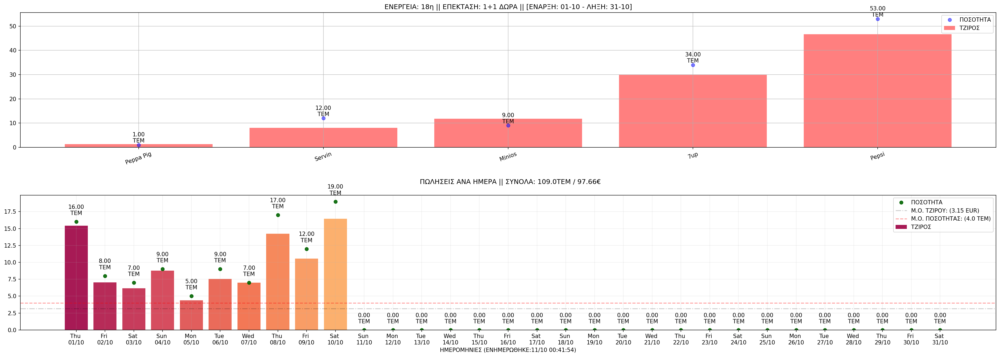

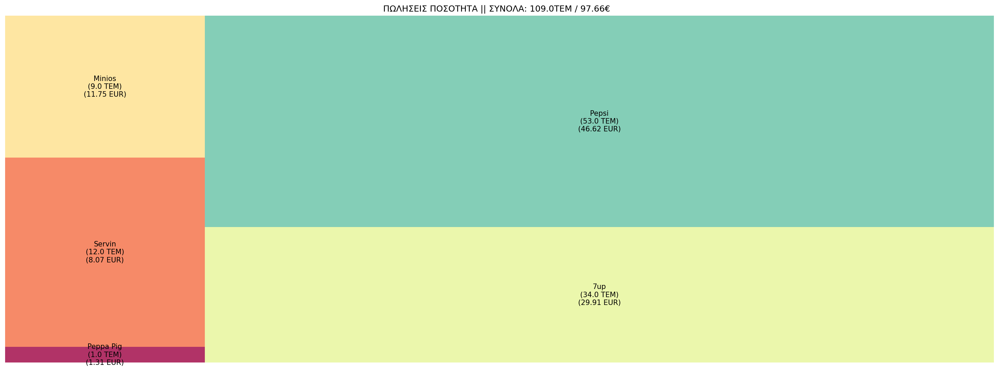

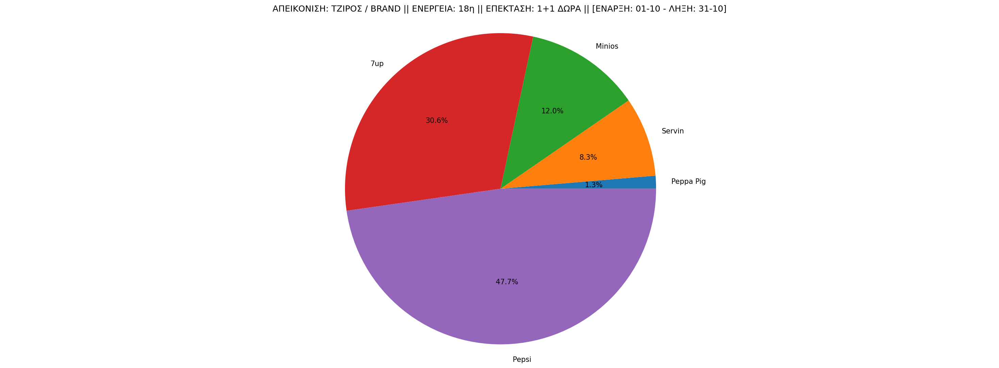

In [41]:
for choose_pricelist in timokatalogos.lista_2020:
    from_date = choose_pricelist.start
    to_date = choose_pricelist.end
    tim_id = choose_pricelist.tim_id
    dates_ranges = pd.date_range(from_date, to_date)
    timokatalogos = pd.read_sql_query(sql_select.get_products_in_the_period(from_date, to_date), sql_connect.connect())
    sales = pd.read_sql_query(sql_select.get_sales(from_date, to_date, tuple(timokatalogos['ΚΩΔΙΚΟΣ'].values)), sql_connect.connect())
    final_result = pd.merge(left=timokatalogos, right=sales, left_on='ΚΩΔΙΚΟΣ', right_on='ΚΩΔΙΚΟΣ').sort_values(by=['SalesQuantity'])
    brand_sales = final_result[['BRAND', 'SalesQuantity', 'Turnover']].groupby(by='BRAND').sum().sort_values('Turnover').reset_index()
    display(brand_sales)
    quantity_per_day = []
    tziros_per_day = []
    for specific_date in dates_ranges:
        sales_per_day = pd.read_sql_query(
            sql_select.get_sales_for_every_day(specific_date, tuple(timokatalogos['ΚΩΔΙΚΟΣ'].values)),
            sql_connect.connect())
        quantity_per_day.append(sales_per_day.SalesQuantity.sum())
        tziros_per_day.append(round(sales_per_day.Turnover.sum(), 2))
    plot_tim.run(choose_pricelist, from_date, to_date, brand_sales, final_result, dates_ranges,
                 tziros_per_day, quantity_per_day, tim_id)
        

<p><center>Ioannis E. Kommas<br>
    Data Science Enthusiast</center></p>
     
 Company
signature_233242791
 

In [42]:
display(datetime.now().strftime('ΚΑΙ ΕΔΩ Η ΛΗΞΗ ΤΟΥ :%d-%m-%Y & ΩΡΑ:%H:%M:%S'))

'ΚΑΙ ΕΔΩ Η ΛΗΞΗ ΤΟΥ :11-10-2020 & ΩΡΑ:00:42:02'